# COSC 2779 Assignment 1

Kah Hie TOH

## Import & Load Data
Before any analysis of the data is done, the data has to be able to load in the Notebook

In [36]:
# Mounting google drive to Notebook
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [37]:
# Extract the zip file containing the dataset & images
!cp -r /content/drive/data.zip .
!unzip -q -o data.zip
!ls
# !ls should show the files present in the zip file

'CK+ AgreementForm.pdf'   COSC2779_A1_data.zip	 drive	    sample_data
 cohn-kanade-images	  data_labels.csv	 __MACOSX


The `data_labels.csv` shows the annotates the images based on the subject, their facial movement, file path as well as the emotion portrayed on the image while the `cohn-kanade-images` directory holds all image sequences taken. Now, let's take a look some basic information of the csv file

# Exploratory Data Exploration

In [38]:
import pandas as pd
# Read the csv file
full_df = pd.read_csv('data_labels.csv')
print("Shape of dataset: ", full_df.shape)

Shape of dataset:  (560, 21)


In [39]:
# Check information about the dataset
full_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 560 entries, 0 to 559
Data columns (total 21 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   subject             560 non-null    object
 1   sequence            560 non-null    int64 
 2   image_index         560 non-null    int64 
 3   filepath            560 non-null    object
 4   file_prefix         560 non-null    object
 5   AU17                560 non-null    int64 
 6   AU1                 560 non-null    int64 
 7   AU2                 560 non-null    int64 
 8   AU25                560 non-null    int64 
 9   AU27                560 non-null    int64 
 10  AU4                 560 non-null    int64 
 11  AU7                 560 non-null    int64 
 12  AU23                560 non-null    int64 
 13  AU24                560 non-null    int64 
 14  AU6                 560 non-null    int64 
 15  AU12                560 non-null    int64 
 16  AU15                560 no

In [40]:
full_df

,subject,sequence,image_index,filepath,file_prefix,AU17,AU1,AU2,AU25,AU27,...,AU7,AU23,AU24,AU6,AU12,AU15,AU14,AU11,AU26,high_level_emotion
0,S005,1,11,./cohn-kanade-images/S005/001/S005_001_0000001...,S005_001_00000011,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,negative
1,S010,1,14,./cohn-kanade-images/S010/001/S010_001_0000001...,S010_001_00000014,0,1,1,1,0,...,0,0,0,0,0,0,0,0,0,negative
2,S010,2,14,./cohn-kanade-images/S010/002/S010_002_0000001...,S010_002_00000014,0,1,1,1,1,...,0,0,0,0,0,0,0,0,0,surprise
3,S010,3,18,./cohn-kanade-images/S010/003/S010_003_0000001...,S010_003_00000018,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,negative
4,S010,4,19,./cohn-kanade-images/S010/004/S010_004_0000001...,S010_004_00000019,1,0,0,0,0,...,1,1,1,0,0,0,0,0,0,negative
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
555,S506,4,38,./cohn-kanade-images/S506/004/S506_004_0000003...,S506_004_00000038,0,1,1,1,0,...,0,0,0,0,0,0,0,0,0,negative
556,S506,6,42,./cohn-kanade-images/S506/006/S506_006_0000004...,S506_006_00000042,1,1,1,0,0,...,0,0,0,0,0,1,0,0,1,negative
557,S895,2,7,./cohn-kanade-images/S895/002/S895_002_0000000...,S895_002_00000007,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,negative
558,S999,1,18,./cohn-kanade-images/S999/001/S999_001_0000001...,S999_001_00000018,1,0,0,0,0,...,0,1,0,0,0,0,0,0,0,negative


From above, it can be seen that there are a total of 560 annotated images, and there are 21 features present for each of the data. There are no null vlaues present. It can be seen that each image is annotated with the subject, sequence, file path, all AU codes as well as the high level emotion.
Now, let's take the different emotions present in the dataset

In [41]:
# Number of data for different emotions
full_df['high_level_emotion'].value_counts()

negative    328
positive    121
surprise    111
Name: high_level_emotion, dtype: int64

From above, it can be seen that the dataset is not very balanced, with a lot of images that portray `negative` emotions compared to `positive` and `surprise` emotions. Let's take a look at the emotions present in terms of the subjects

In [42]:
# Total number of subjects
full_df['subject'].nunique()

123

In [43]:
# Number of subjects with images of said emotions in the dataset
full_df.groupby('high_level_emotion')['subject'].nunique()

high_level_emotion
negative    119
positive     92
surprise     89
Name: subject, dtype: int64

In [44]:
from collections import Counter
au_codes = list(full_df.columns)[5:20]

# The combinations of FACS codes for different emotions
negative_facs = full_df[full_df['high_level_emotion'] == 'negative'][au_codes].values.astype(str).tolist()
negative_facs_str = [' '.join(item) for item in negative_facs]

positive_facs = full_df[full_df['high_level_emotion'] == 'positive'][au_codes].values.astype(str).tolist()
positive_facs_str = [' '.join(item) for item in positive_facs]

surprise_facs = full_df[full_df['high_level_emotion'] == 'surprise'][au_codes].values.astype(str).tolist()
surprise_facs_str = [' '.join(item) for item in surprise_facs]

In [45]:
# Columns for facial movements

print("FACS Codes Combination for Negative emotion:")
for key, value in Counter(negative_facs_str).items():
  print(key,":", value)

FACS Codes Combination for Negative emotion:
1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 : 5
0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 : 6
1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 : 8
1 0 0 0 0 1 1 1 1 0 0 0 0 0 0 : 16
0 0 0 1 0 1 1 0 0 1 0 0 0 0 0 : 2
1 1 0 0 0 1 0 0 0 0 0 1 0 0 0 : 12
0 1 0 1 0 1 1 0 0 0 0 0 0 0 0 : 2
0 0 0 1 0 1 1 0 0 0 0 0 0 0 0 : 4
1 0 0 0 0 1 1 0 0 0 0 0 0 0 0 : 12
0 1 1 1 0 1 0 0 0 0 0 0 0 0 0 : 3
1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 : 30
1 0 0 0 0 1 0 0 1 0 0 1 0 0 0 : 1
1 0 0 0 0 1 1 0 1 0 0 0 1 0 0 : 3
1 0 0 0 0 0 1 0 0 1 0 1 0 0 0 : 1
0 1 0 1 0 1 1 0 0 1 0 0 0 0 0 : 2
1 0 0 0 0 1 1 1 0 1 0 0 0 0 0 : 1
1 0 0 0 0 1 0 1 1 0 0 0 0 0 0 : 4
0 0 0 1 0 1 1 0 0 0 0 0 0 1 0 : 2
0 0 0 1 0 1 1 0 0 1 1 0 0 0 0 : 2
0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 : 1
1 0 0 0 0 1 1 1 0 0 0 0 0 0 0 : 3
1 1 0 0 0 1 0 0 0 0 0 0 0 0 0 : 4
0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 : 3
1 0 0 0 0 1 1 1 1 0 0 0 1 0 0 : 1
1 0 0 0 0 1 1 0 0 1 0 0 0 0 0 : 13
0 0 0 0 0 1 1 0 0 1 0 0 0 0 0 : 1
1 1 1 0 0 0 0 0 1 0 0 0 0 0 0 : 1
1 0 0 1 0 1 1 0 0 0 0 0 0 0 0 : 

In [46]:
print("FACS Codes Combination for Positive emotion:")
for key, value in Counter(positive_facs_str).items():
  print(key,":", value)

FACS Codes Combination for Positive emotion:
0 0 0 1 0 0 0 0 0 1 1 0 0 0 0 : 57
0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 : 13
0 1 0 1 0 1 1 0 0 1 1 0 0 1 0 : 1
0 1 1 0 0 0 0 0 0 0 1 0 0 1 0 : 1
0 0 0 1 0 0 0 0 0 1 1 0 0 0 1 : 4
0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 : 9
0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 : 1
0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 : 4
1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 : 1
0 1 0 1 0 1 1 0 0 0 1 0 0 1 0 : 1
0 0 0 1 0 0 1 0 0 1 1 0 0 0 0 : 5
0 0 0 1 0 0 1 0 0 1 1 0 0 0 1 : 1
0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 : 20
0 1 0 1 0 1 0 0 0 0 0 0 0 0 0 : 1
0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 : 1
0 0 0 0 0 0 1 0 0 1 1 0 0 0 0 : 1


In [47]:
print("FACS Codes Combination for Surprise emotion:")
for key, value in Counter(surprise_facs_str).items():
  print(key,":", value)

FACS Codes Combination for Surprise emotion:
0 1 1 1 1 0 0 0 0 0 0 0 0 0 0 : 65
0 1 1 1 1 0 0 0 0 0 1 0 0 0 0 : 3
0 1 1 1 1 0 0 0 0 0 0 1 0 0 0 : 1
0 1 1 1 0 0 0 0 0 0 0 0 0 0 1 : 12
0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 : 4
0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 : 9
0 0 0 1 0 1 1 0 0 0 0 0 0 0 0 : 1
0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 : 12
0 1 1 1 1 1 0 0 0 0 0 0 0 0 0 : 2
0 1 1 1 1 0 0 1 0 0 0 0 0 0 0 : 1
0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 : 1


From above, it can be shown that there are a lot of unique combination of FACS codes. This could potentially decrease the model's performance as the model would only see it once and will not be able to learn it.

# Data Splitting
From some minimal EDA performed above, it can be seen that the dataset is inbalanced, which means after the test set is split, it will have to be validated to prevent it from missing those less frequent emotions

Other than that, to prevent data leakage, the data would be split by actors instead of emotions.

In [48]:
from sklearn.model_selection import train_test_split

# Train test split
train_user, test_val_user = train_test_split(full_df['subject'].unique(),test_size=0.4,random_state=735)
test_user, val_user = train_test_split(test_val_user,test_size=0.5,random_state=4)

train = full_df[full_df['subject'].isin(train_user)]
test = full_df[full_df['subject'].isin(test_user)]
val = full_df[full_df['subject'].isin(val_user)]

print("Number of subjects for Train: ", len(train['subject'].unique()))
print("Number of subjects for Test: ", len(test['subject'].unique()))
print("Number of subjects for Val: ", len(val['subject'].unique()))

Number of subjects for Train:  73
Number of subjects for Test:  25
Number of subjects for Val:  25


In [49]:
train['high_level_emotion'].value_counts()

negative    193
positive     74
surprise     67
Name: high_level_emotion, dtype: int64

In [50]:
test['high_level_emotion'].value_counts()

negative    64
surprise    23
positive    21
Name: high_level_emotion, dtype: int64

In [51]:
val['high_level_emotion'].value_counts()

negative    71
positive    26
surprise    21
Name: high_level_emotion, dtype: int64

In [52]:
import matplotlib.pyplot as plt

# Plot histogram of target attributes
def plot_histograms(dfs, columns):
    plt.figure(figsize=(20,30))
    # enumerate(columns) produces columns in form of (index,column name)
    num = len(dfs[0].columns) // 4 + 1
    colors = ['r','g','b']
    widths = [0.1,0.13,0.16]
    for i,df in enumerate(dfs):
      for j,col in enumerate(columns):
      #   Generate a subplot out of 5x5 subplots
      #   i+1 indicates the (i+1)th number of plot
          plt.subplot(num,4,j+1)
      #     density=True returns a probability density
      #     so that the area under the histogram is 1
      #     alpha sets the transparency of each bin
          plt.hist(df[col],bins=12,alpha=0.4, color=colors[i], width=widths[i])
          # plt.hist(df[col],bins=12,alpha=0.5,color='r')
          # plt.hist(df[col],bins=12,alpha=0.5,color='r')
      #     Set the title to be the column name
          plt.title(col)
      #     Rotate the xticks to vertical
          plt.xticks(rotation="vertical")
          # plt.legend()
          plt.subplots_adjust(hspace=0.4)
          if col.startswith('AU'):
            plt.xlim([0,1.1])
# Source: COSC2793 Week 3 Lab Exercises

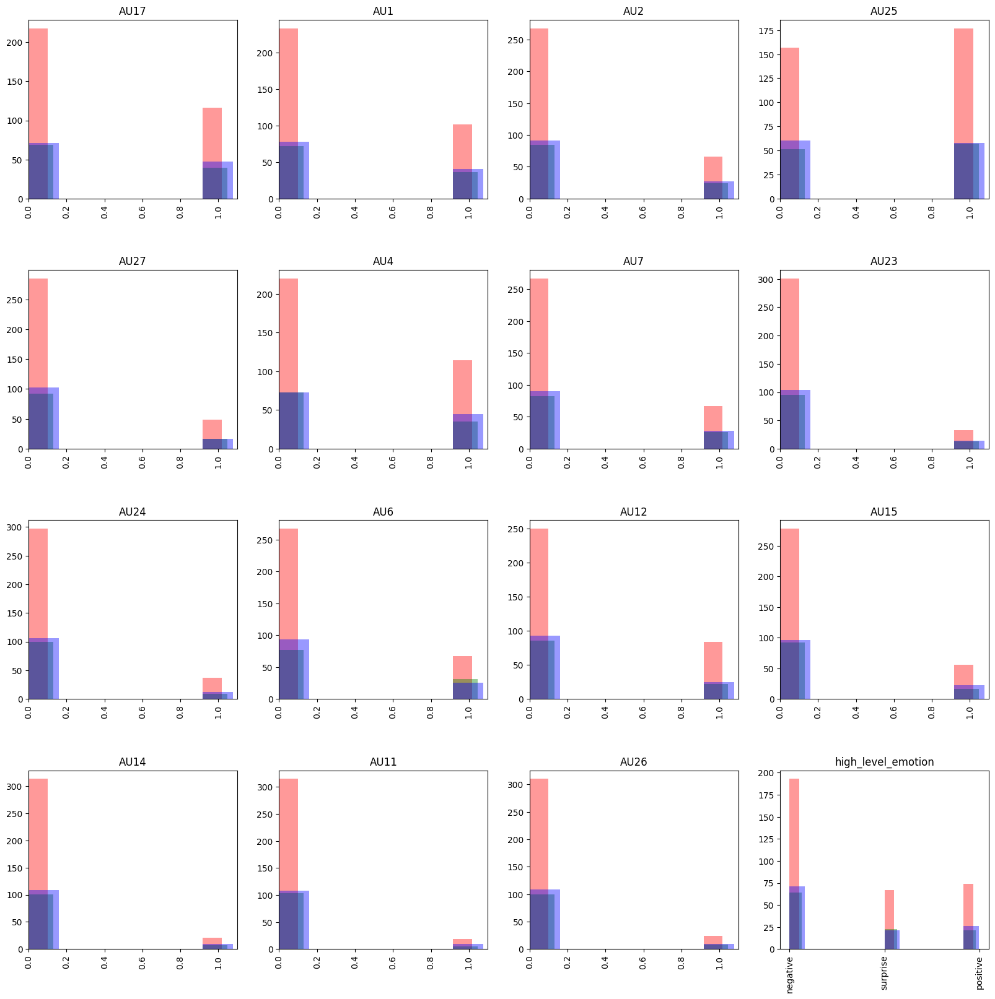

In [53]:
target_attributes = list(full_df.columns)[5:21]
plot_histograms([train,test,val],target_attributes)

In [54]:
# Check if there is any intersection between the subjects present in each dataset

set_train = set(train['subject'])
set_test = set(test['subject'])
set_val = set(val['subject'])

print("Intersection between Train and Test set: ", set.intersection(set_train,set_test))
print("Intersection between Train and Validation set: ", set.intersection(set_train,set_val))
print("Intersection between Validation and Test set: ", set.intersection(set_val,set_test))

Intersection between Train and Test set:  set()
Intersection between Train and Validation set:  set()
Intersection between Validation and Test set:  set()


From the histogram shown above, it is safe to say that the dataset is split equally across train, test and validation dataset as the target attributes have identical distribution. Other than that, it can be seen that there are no intersection of subjects between all datasets, which means there will be no data leakage as well.

# Exploratory Data Analysis (Cont)
Now that the dataset is successfully split, let's perform a more in-depth analysis with the train dataset

With that, let's check the how the emotions are related to the AU codes

Text(0.5, 1.0, 'Average occurence of AU Codes for different emotions')

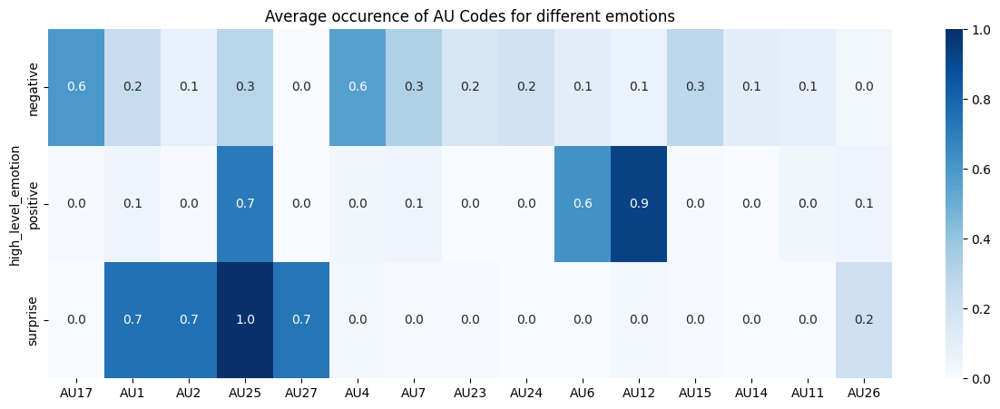

In [55]:
# import matplotlib.pyplot as plt
import seaborn as sns

# Plot heatmap for how often the facial movement is present based on the emotions
fig, ax = plt.subplots(figsize=(15,5))
sns.heatmap(train.groupby('high_level_emotion')[au_codes].mean(),cmap='Blues',annot=True,fmt=".1f", ax=ax)
plt.title("Average occurence of AU Codes for different emotions")

From the heatmap above, it can be seen that different AU Codes are present generally for different emotions. For example, when the image shows a positive emotion, it is very likely that the Facial Code AU12 (Lip Corner Puller) is present. Although AU25 (Lip Parts) seems like a sure sign for the `surprise` emotion, it is important to note that this facial code is also present in other emotions as well. Although there is no specific facial codes present for the `negative` emotion, a combination of different facial codes are present. Among all facial codes, AU14 and AU11 are the least present across all emotions. With that, now let's take a closer look at some of the images present

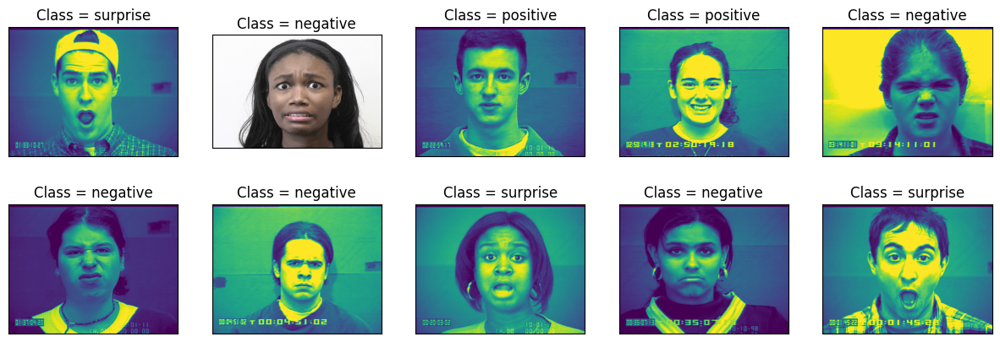

In [56]:
import matplotlib.image as mpimg
import random

# Function to show 10 images randomly
def show_images(df, preprocess=None):
  plt.figure(figsize=(15,5))
  for i in range(10):
      plt.subplot(2,5,i+1)
      ind = random.choice(df.index)
      img = mpimg.imread(df.loc[ind,'filepath'])

      # Preprocess image if a preprocess function is provided
      if preprocess is not None:
        for func in preprocess:
          img = func(img)
          if len(img.shape) > 3:
            img = np.squeeze(img,axis=0)

      plt.imshow(img)
      plt.xticks([])
      plt.yticks([])
      plt.title('Class = '+ df.loc[ind,'high_level_emotion'])
  plt.show()

show_images(train)

From the images, it can be seen that the image have inconsistent properties, with some being coloured or are of different size. With that, let's investigate the images' properties

In [57]:
from collections import Counter
# Check the image shapes
image_properties = [mpimg.imread(data).shape for data in train['filepath']]

image_min = [mpimg.imread(data).min() for data in train['filepath']]
image_max = [mpimg.imread(data).max() for data in train['filepath']]

print("Image shapes: ")
for key, value in Counter(image_properties).items():
  print(key,": ", value)
print()
print("Image min values: ")
for key, value in Counter(image_min).items():
  print(key,": ", value)
print()
print("Image max values: ")
for key, value in Counter(image_max).items():
  print(key,": ", value)

Image shapes: 
(490, 640) :  314
(480, 640, 3) :  12
(480, 720, 3) :  8

Image min values: 
0.0 :  325
0.11764706 :  1
0.003921569 :  8

Image max values: 
1.0 :  326
0.99607843 :  8


For RGB images, the shape would be shown with (W,H,3) while for grayscale images, the shape would be shown as only (W,H). From above, it can be seen that there are 3 different type of image dimensions present and the values seems to sit between 0 and 1. As neural networks have to receive inputs of the same size, all images will be formatted into a single format.

# Data PreProcessing
From the analysis above, it shows that we would need to convert the images that are of various properties into a single format. With that, there are 2 observations:  
- Most of the actors' face sits within the center of the image, meaning that the left and right edge of the images are uneccessary
- Most of them were in grayscale

With that, all images will first be converted into grayscale, after that, they will be cropped into a square image of 500x500. After the image is successfully cropped, the image size will then be reduced to 64x64 and check if the size is adequate


In [58]:
labels_int = {'negative': 0, 'positive': 1, 'surprise':2}
train.loc[:,'high_level_emotion_num'] = train['high_level_emotion'].map(labels_int)
val.loc[:,'high_level_emotion_num'] = val['high_level_emotion'].map(labels_int)
test.loc[:,'high_level_emotion_num'] = test['high_level_emotion'].map(labels_int)

<ipython-input-58-9c02b12369b4>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train.loc[:,'high_level_emotion_num'] = train['high_level_emotion'].map(labels_int)
<ipython-input-58-9c02b12369b4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val.loc[:,'high_level_emotion_num'] = val['high_level_emotion'].map(labels_int)
<ipython-input-58-9c02b12369b4>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

Se

In [59]:
train

,subject,sequence,image_index,filepath,file_prefix,AU17,AU1,AU2,AU25,AU27,...,AU23,AU24,AU6,AU12,AU15,AU14,AU11,AU26,high_level_emotion,high_level_emotion_num
1,S010,1,14,./cohn-kanade-images/S010/001/S010_001_0000001...,S010_001_00000014,0,1,1,1,0,...,0,0,0,0,0,0,0,0,negative,0
2,S010,2,14,./cohn-kanade-images/S010/002/S010_002_0000001...,S010_002_00000014,0,1,1,1,1,...,0,0,0,0,0,0,0,0,surprise,2
3,S010,3,18,./cohn-kanade-images/S010/003/S010_003_0000001...,S010_003_00000018,1,0,0,0,0,...,0,0,0,0,0,0,0,0,negative,0
4,S010,4,19,./cohn-kanade-images/S010/004/S010_004_0000001...,S010_004_00000019,1,0,0,0,0,...,1,1,0,0,0,0,0,0,negative,0
5,S010,5,16,./cohn-kanade-images/S010/005/S010_005_0000001...,S010_005_00000016,0,0,0,1,0,...,0,0,1,0,0,0,0,0,negative,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
543,S502,4,52,./cohn-kanade-images/S502/004/S502_004_0000005...,S502_004_00000052,0,1,0,1,0,...,0,0,0,0,0,1,0,0,negative,0
551,S505,2,21,./cohn-kanade-images/S505/002/S505_002_0000002...,S505_002_00000021,0,0,0,0,0,...,0,0,0,0,0,1,0,0,negative,0
552,S505,6,19,./cohn-kanade-images/S505/006/S505_006_0000001...,S505_006_00000019,1,1,0,0,0,...,0,0,0,0,1,0,0,0,negative,0
558,S999,1,18,./cohn-kanade-images/S999/001/S999_001_0000001...,S999_001_00000018,1,0,0,0,0,...,1,0,0,0,0,0,0,0,negative,0


In [60]:
import numpy as np
import tensorflow as tf

# Function for the necessary pre-processing of the images
def convert(img, dim=(64,64), normalize=True):

  # Expand the shape of images without channels
  if(len(img.shape)<3):
    img = np.expand_dims(img, axis=-1)

  # If image data is in format 1-255, rescale them to range between 0 and 1
  if(img.max() > 1 and normalize):
    print("Found image with inconsistent data, rescaling...")
    img = img*1/255

  # If it is set to not normalize and image is within range 0-1
  # multiply it by 255
  if not normalize and img.max() <= 1:
    # print("Normalizing image")
    img = img*255
    # print(img)
    img = np.array(img, dtype=int)

  # # If the image has more than 1 channel
  # Convert to grayscale
  if(img.shape[-1] > 1):
    # print("Converting image to grayscale")
    img = tf.image.rgb_to_grayscale(img)

  # print("Cropping image")
  width = img.shape[1]
  height = img.shape[0]

# Crop and resize image
  cropped_img = tf.image.crop_and_resize(np.expand_dims(img,axis=0),
                                         np.array([[0,0.1,1,0.9]]),
                                         tf.constant([0]),
                                          (dim))
  # if return_img:
  #   cropped_img = np.squeeze(np.squeeze(cropped_img,axis=0))
  return cropped_img

With the function being created, it is good to ensure that no key information is being cut.

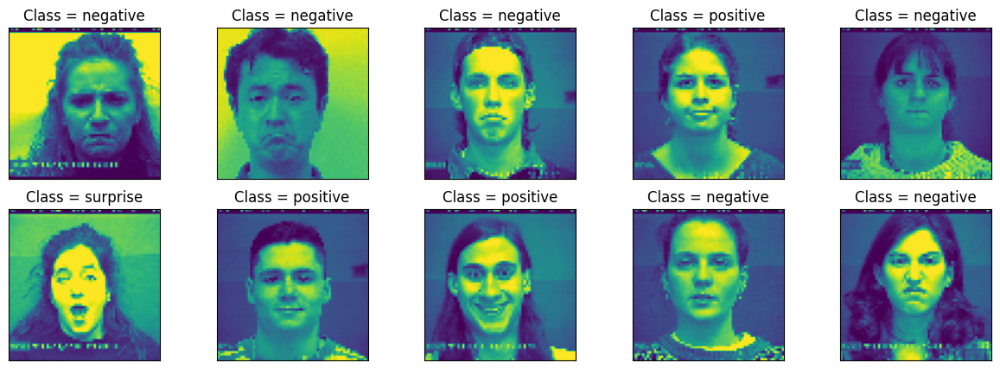

In [61]:
show_images(train,[convert])

From above, it seems like the crop did not cut out crucial information from the image! With that, it is time to create a data generator for the different emotions. It is common knowledge that data augmentation would improve the training process, however, it is also important to see if augmentation would be able to keep the crucial information within the image.

With that, there are some augmentation procedures that will not be considered such as:  
- Flipping vertically - Distords the face
- Any form of cropping - Images are already cropped


In [62]:
import random

# Function to generate random numbers of given size
def random_seed(size):
  seed = None
  if size == 1:
    # seed = tf.random.uniform([1])
    seed = random.randrange(0,999)


  if size == 2:
    # a = tf.random.uniform([1])
    # b = tf.random.uniform([1])
    a = random.randrange(0,999)
    b = random.randrange(0,999)
    seed = a,b

  # print(seed)
  return seed


In [63]:
import random
# Function to perform augmentation on image
def augmentation(data,brightness_delta=0.8, contrast_lower=0.1):
  # print("Augmentation process started")
  seed = random.randrange(0,999)
  # tf.random.set_seed(seed)

  # Expand the shape of images without channels
  if(len(data.shape)<3):
    data = np.expand_dims(data, axis=-1)

  # print("Flipping")
  # Flipping
  data = tf.image.stateless_random_flip_left_right(data,random_seed(2))


  # print("Brightness")
  # Adjust brightness
  data = tf.image.stateless_random_brightness(data, max_delta=brightness_delta,seed=random_seed(2))

  # print("Contrast")
  # Adjust contrast
  data = tf.image.stateless_random_contrast(data,lower=contrast_lower,upper=0.9,seed=random_seed(2))

  # print("Rotation")
  # Adjust rotation
  rotation = tf.keras.layers.RandomRotation([-0.1,0.1],seed=random_seed(2))
  data = rotation(data)

  # print("Shifting")
  # Random shifting
  shift = tf.keras.layers.RandomTranslation([-0.1,0.1],[-0.1,0.1],seed=random_seed(2))
  data = shift(data)

  # print(data.shape)
  return data

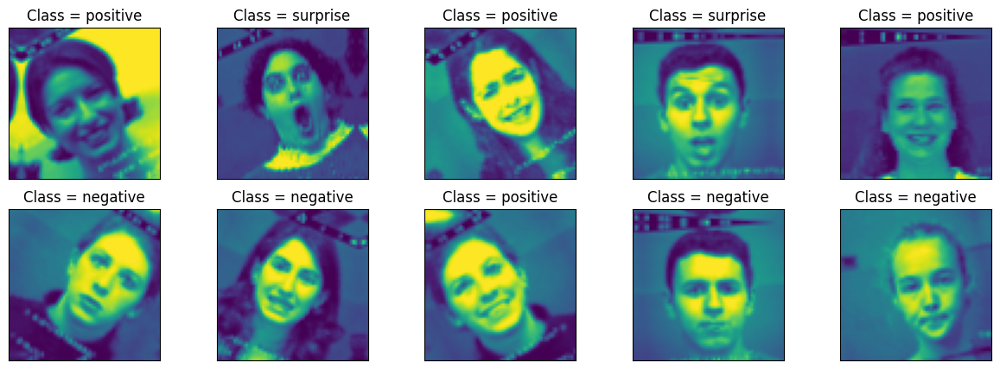

In [64]:
show_images(train,[convert,augmentation])

After checking some of the augmentation, it can be seen taht augmentation can be done without losing the quality of the data! Thus, this process is followed through

## Data Generator

In [65]:
import tensorflow.keras as keras
# import tensorflow-addons as tfa

class DataGenerator(keras.utils.Sequence):
  'Data Generator initialization'
  def __init__(self, dataframe, batch_size=8, dim=(64,64,1),
               n_classes1=3, n_classes2=15,
               data_mean=0, data_std=1, data_prefix='',
               shuffle=True, Augment=True,
               rgb=False, normalize=True,
               multi_output=False, preprocessing_function=None):

    self.dim = dim
    self.batch_size = batch_size
    self.n_classes1 = n_classes1
    self.n_classes2 = n_classes2

    self.shuffle = shuffle
    self.augment = Augment
    self.rgb = rgb
    self.normalize=normalize

    self.multi_output = multi_output

    self.dataframe = dataframe

    # Get all target values into a list
    self.image_label1 = dataframe['high_level_emotion_num'].values.tolist()

    self.image_label2 = dataframe[au_codes].values.tolist()

    # Assign a number incrementally to every data in the dataset
    self.image_ids = np.arange(len(self.image_label1)).tolist()
    self.data_prefix = data_prefix

    self.data_mean = data_mean
    self.data_std = data_std

    # Augmentation
    self.brightness_delta = 0.8
    self.contrast_lb = 0.1

    self.preprocessing_function = preprocessing_function

    self.on_epoch_end()

  def __len__(self):
    return int(np.floor(len(self.image_ids) / self.batch_size))

  def show_individual(self):
    ind = random.choice(self.image_ids)
    label1 = self.image_label1[ind]
    label2 = self.image_label2[ind]

    filepath = self.data_prefix + self.dataframe.iloc[ind]['filepath']

    plt.subplot(2,5,1)
    ori_img = mpimg.imread(filepath)
    plt.imshow(ori_img)
    plt.xticks([])
    plt.yticks([])
    plt.title('Original Image')

    for i in range(2,11):
      plt.subplot(2,5,i)
      # os.path.relpath(,'')
      img = self.__read_data_instance(self.image_ids[ind])
      img = np.squeeze(img, axis=0)
      plt.imshow(img.astype(np.uint8))
      plt.xticks([])
      plt.yticks([])
      plt.title(list(labels_int.keys())[list(labels_int.values()).index(label1)])

  def show(self):
      for i in range(10):
        plt.subplot(2,5,i+1)

        ind = random.choice(self.image_ids)
        label1 = self.image_label1[ind]
        label2 = self.image_label2[ind]

        img = self.__read_data_instance(self.image_ids[ind])
        img = np.squeeze(img, axis=0)
        # print(img.shape)
        plt.imshow(img.astype(np.uint8))
        plt.xticks([])
        plt.yticks([])
        plt.title(list(labels_int.keys())[list(labels_int.values()).index(label1)])

  def __getitem__(self, index):
    # Get all indexes of images for this batch
    indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]

    # get the nth images from the batched indexes
    data_ids_temp = [self.image_ids[k] for k in indexes]

    # get the nth labels from the batched indexes
    image_label1_temp = [self.image_label1[k] for k in indexes]

    # get the nth labels from the batched indexes
    image_label2_temp = [self.image_label2[k] for k in indexes]

    if self.multi_output:
      X, y = self.__data_generation(data_ids_temp,
                                    image_label1_temp,
                                    image_label2_temp)
      return X, y
    else:
      X, y = self.__data_generation(data_ids_temp,
                                    image_label1_temp,
                                    image_label2_temp)
      return X, y

  def on_epoch_end(self):
    self.indexes = np.arange(len(self.image_ids))
    if self.shuffle:
      np.random.shuffle(self.indexes)

  def __data_generation(self, data_ids_temp, image_label1_temp, image_label2_temp):
    # Initialize 2 empty arrays the size of the batch size
    X = np.empty((self.batch_size, *self.dim))
    y1 = np.empty((self.batch_size),dtype=int)

    y2 = np.ndarray((self.batch_size,self.n_classes2))
    # y = np.empty((self.batch_size), dtype=str)

    # Populate all data into the empty arrays
    for i,ids in enumerate(data_ids_temp):
      X[i,] = self.__read_data_instance(data_ids_temp[i])
      y1[i] = image_label1_temp[i]
      y2[i] = image_label2_temp[i]

    if self.multi_output:
      return X, [keras.utils.to_categorical(y1,num_classes=self.n_classes1), y2]

    return X, keras.utils.to_categorical(y1, num_classes=self.n_classes1)

  def __read_data_instance(self, pid):
    filepath = self.data_prefix + self.dataframe.iloc[pid]['filepath']

    data = mpimg.imread(filepath)
    data = convert(data, self.dim[0:2], self.normalize)

    if self.rgb:
      # tf.io.decode_image(raw_img, expand_animations = False, dtype=tf.float32, channels=1)
      # to get rgb:
      # data = tf.io.decode_image(data, expand_animations = False, dtype=tf.float32, channels=3)

      data = tf.image.grayscale_to_rgb(data) if data.shape[-1] == 1 else data.astype(int)

    # else:
    #   data = tf.image.rgb_to_grayscale(data) if data.shape[-1] > 1 else data

    if self.augment:
      data = augmentation(data, self.brightness_delta, self.contrast_lb)

    X = data

    # Input normalization
    X = (X - self.data_mean) / self.data_std

    if self.preprocessing_function is not None:
      X = self.preprocessing_function(X)

    return X

  def change_brightness_delta(self,delta):
    self.brightness_delta = delta

  def change_contrast_lb(self, lb):
    self.contrast_lb = lb

# Source: COSC2779 Week 5 Lab Exercse

In [66]:
prefix = ''
BATCH_SIZE = 16

training_generator = DataGenerator(train, batch_size=BATCH_SIZE, n_classes1=3, Augment=True, data_prefix=prefix)
validation_generator = DataGenerator(val, batch_size=BATCH_SIZE, n_classes1=3, Augment=False, data_prefix=prefix)

In [67]:

print(training_generator.__len__())

for x,y in training_generator.__iter__():
  print(x.shape, y.shape)

20
(16, 64, 64, 1) (16, 3)
(16, 64, 64, 1) (16, 3)
(16, 64, 64, 1) (16, 3)
(16, 64, 64, 1) (16, 3)
(16, 64, 64, 1) (16, 3)
(16, 64, 64, 1) (16, 3)
(16, 64, 64, 1) (16, 3)
(16, 64, 64, 1) (16, 3)
(16, 64, 64, 1) (16, 3)
(16, 64, 64, 1) (16, 3)
(16, 64, 64, 1) (16, 3)
(16, 64, 64, 1) (16, 3)
(16, 64, 64, 1) (16, 3)
(16, 64, 64, 1) (16, 3)
(16, 64, 64, 1) (16, 3)
(16, 64, 64, 1) (16, 3)
(16, 64, 64, 1) (16, 3)
(16, 64, 64, 1) (16, 3)
(16, 64, 64, 1) (16, 3)
(16, 64, 64, 1) (16, 3)


With that, it can be said that the data generator has been successfully generated.

# Tensorboard

In [68]:
%reload_ext tensorboard

!lsof -i:8000

COMMAND     PID USER   FD   TYPE DEVICE SIZE/OFF NODE NAME
tensorboa 15261 root    7u  IPv4 363283      0t0  TCP localhost:8000 (LISTEN)


In [69]:
drive_logdir = '/content/drive/My Drive/RMIT/COSC2779/tensorboard_logs/'

In [70]:
import pathlib
import shutil
import tempfile

root = '/content/drive/My Drive/RMIT/COSC2779/'

# Load the TensorBoard notebook extension
%load_ext tensorboard

# Open an embedded TensorBoard viewer
%tensorboard --logdir '/content/drive/My Drive/RMIT/COSC2779/tensorboard_logs/models' --port=8000

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 8000 (pid 15261), started 0:08:48 ago. (Use '!kill 15261' to kill it.)

<IPython.core.display.Javascript object>

In [38]:
# Function to return call backs
def get_callbacks(name, early_stopping=False, metric='val_loss', patience_num=25):
  if early_stopping:
    return [
        tf.keras.callbacks.EarlyStopping(monitor=metric, patience=patience_num),
        tf.keras.callbacks.TensorBoard(root + "/tensorboard_logs/" + name),
        tf.keras.callbacks.ModelCheckpoint(filepath=root + name + "/",
                                          save_weights_only=False,
                                          save_best_only=True,
                                          save_freq="epoch",
                                          verbose=1)
      ]

  return [
    tf.keras.callbacks.TensorBoard(root + "/tensorboard_logs/" + name),
    tf.keras.callbacks.ModelCheckpoint(filepath=root + name + "/",
                                       save_weights_only=False,
                                       save_best_only=True,
                                       save_freq="epoch",
                                       verbose=1)
  ]

# Baseline Model
As a baseline model, Le (2018) created 4 Convolutional Neural Network Models for the image classification task of classifying the MNIST Fashion Dataset with a decent accuracy (91.17%) with his 3-Conv CNN architecture. Thus, his architecture will be used as our baseline model. However, accuracy was the metrics chosen for assessing the model's performance, which will be changed to f1 score instead as we are dealing with an unbalanced dataset

In [39]:
from tensorflow.keras import Sequential

baseline_model = Sequential([
    tf.keras.layers.Conv2D(32, (3,3), activation='relu'),
    tf.keras.layers.MaxPool2D(),
    tf.keras.layers.Dropout(0.25),

    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPool2D(),
    tf.keras.layers.Dropout(0.25),

    tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
    tf.keras.layers.Dropout(0.4),

    tf.keras.layers.Flatten(),

    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dropout(0.3),

    tf.keras.layers.Dense(3, activation='softmax')
])

### Function : F1 Score
From previous data analysis it can be seen that the dataset is imbalanced. According to Allwright (2022), F1 Score is the recommended metric as it balances precision and recall while performing well on imbalanced datasets.

As there is an error importing tensorflow addons, Saturn Cloud (2023) proposed a custom F1 Score using the Keras backend.

In [39]:
import keras.backend as K
# Acquired at Saturn Cloud (2023) : https://saturncloud.io/blog/custom-f1score-metric-in-tensorflow/

def get_f1(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    recall = true_positives / (possible_positives + K.epsilon())
    f1_val = 2*(precision*recall)/(precision+recall+K.epsilon())
    return f1_val

### Function : Verify Training

In [40]:
def verify_training(name, training, early_stopping=False, metric='val_loss', patience_num=25):
  callbacks = get_callbacks(name, early_stopping, metric, patience_num)
  if not training and len(os.listdir(drive_logdir+ name)) > 0:
    print("Existing training files found, training stopped")
    return callbacks, False

  else:
    shutil.rmtree(drive_logdir + name, ignore_errors=True)
    return callbacks, True

In [43]:
import os
name_m0 = 'models/baseline_model'
training = True

baseline_model.compile(loss="categorical_crossentropy",
                  optimizer=tf.keras.optimizers.Adam(),
                  metrics=get_f1)

callbacks, train_model = verify_training(name_m0, training)

if train_model:
  history = baseline_model.fit(training_generator,
                            epochs=30,
                            callbacks=callbacks,
                            validation_data=validation_generator)

Epoch 1/30
20/20 [==============================] - ETA: 0s - loss: 1.0397 - get_f1: 0.3196
Epoch 1: val_loss improved from inf to 0.98024, saving model to /content/drive/My Drive/RMIT/COSC2779/models/baseline_model/


20/20 [==============================] - 22s 881ms/step - loss: 1.0397 - get_f1: 0.3196 - val_loss: 0.9802 - val_get_f1: 0.0000e+00
Epoch 2/30
20/20 [==============================] - ETA: 0s - loss: 1.0143 - get_f1: 0.3626
Epoch 2: val_loss improved from 0.98024 to 0.95835, saving model to /content/drive/My Drive/RMIT/COSC2779/models/baseline_model/


20/20 [==============================] - 15s 740ms/step - loss: 1.0143 - get_f1: 0.3626 - val_loss: 0.9583 - val_get_f1: 0.5982
Epoch 3/30
20/20 [==============================] - ETA: 0s - loss: 1.0071 - get_f1: 0.4056
Epoch 3: val_loss did not improve from 0.95835
20/20 [==============================] - 13s 671ms/step - loss: 1.0071 - get_f1: 0.4056 - val_loss: 0.9911 - val_get_f1: 0.0000e+00
Epoch 4/30
20/20 [==============================] - ETA: 0s - loss: 0.9957 - get_f1: 0.4613
Epoch 4: val_loss improved from 0.95835 to 0.94486, saving model to /content/drive/My Drive/RMIT/COSC2779/models/baseline_model/


20/20 [==============================] - 14s 731ms/step - loss: 0.9957 - get_f1: 0.4613 - val_loss: 0.9449 - val_get_f1: 0.6071
Epoch 5/30
20/20 [==============================] - ETA: 0s - loss: 0.9780 - get_f1: 0.5634
Epoch 5: val_loss did not improve from 0.94486
20/20 [==============================] - 13s 670ms/step - loss: 0.9780 - get_f1: 0.5634 - val_loss: 0.9530 - val_get_f1: 0.5982
Epoch 6/30
20/20 [==============================] - ETA: 0s - loss: 0.9871 - get_f1: 0.5241
Epoch 6: val_loss did not improve from 0.94486
20/20 [==============================] - 13s 659ms/step - loss: 0.9871 - get_f1: 0.5241 - val_loss: 0.9505 - val_get_f1: 0.5982
Epoch 7/30
20/20 [==============================] - ETA: 0s - loss: 1.0005 - get_f1: 0.5107
Epoch 7: val_loss improved from 0.94486 to 0.93818, saving model to /content/drive/My Drive/RMIT/COSC2779/models/baseline_model/


20/20 [==============================] - 15s 763ms/step - loss: 1.0005 - get_f1: 0.5107 - val_loss: 0.9382 - val_get_f1: 0.6161
Epoch 8/30
20/20 [==============================] - ETA: 0s - loss: 0.9913 - get_f1: 0.5422
Epoch 8: val_loss did not improve from 0.93818
20/20 [==============================] - 14s 706ms/step - loss: 0.9913 - get_f1: 0.5422 - val_loss: 0.9490 - val_get_f1: 0.6161
Epoch 9/30
20/20 [==============================] - ETA: 0s - loss: 0.9891 - get_f1: 0.5692
Epoch 9: val_loss did not improve from 0.93818
20/20 [==============================] - 14s 708ms/step - loss: 0.9891 - get_f1: 0.5692 - val_loss: 0.9461 - val_get_f1: 0.6071
Epoch 10/30
20/20 [==============================] - ETA: 0s - loss: 0.9753 - get_f1: 0.5106
Epoch 10: val_loss did not improve from 0.93818
20/20 [==============================] - 14s 718ms/step - loss: 0.9753 - get_f1: 0.5106 - val_loss: 0.9464 - val_get_f1: 0.6071
Epoch 11/30
20/20 [==============================] - ETA: 0s - loss: 

20/20 [==============================] - 15s 751ms/step - loss: 0.9874 - get_f1: 0.5514 - val_loss: 0.9300 - val_get_f1: 0.6161
Epoch 23/30
20/20 [==============================] - ETA: 0s - loss: 0.9870 - get_f1: 0.5049
Epoch 23: val_loss did not improve from 0.93001
20/20 [==============================] - 13s 672ms/step - loss: 0.9870 - get_f1: 0.5049 - val_loss: 0.9716 - val_get_f1: 0.5804
Epoch 24/30
20/20 [==============================] - ETA: 0s - loss: 0.9772 - get_f1: 0.5668
Epoch 24: val_loss did not improve from 0.93001
20/20 [==============================] - 13s 679ms/step - loss: 0.9772 - get_f1: 0.5668 - val_loss: 0.9595 - val_get_f1: 0.5893
Epoch 25/30
20/20 [==============================] - ETA: 0s - loss: 0.9852 - get_f1: 0.5397
Epoch 25: val_loss did not improve from 0.93001
20/20 [==============================] - 13s 670ms/step - loss: 0.9852 - get_f1: 0.5397 - val_loss: 0.9492 - val_get_f1: 0.6071
Epoch 26/30
20/20 [==============================] - ETA: 0s - lo

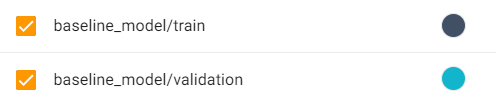

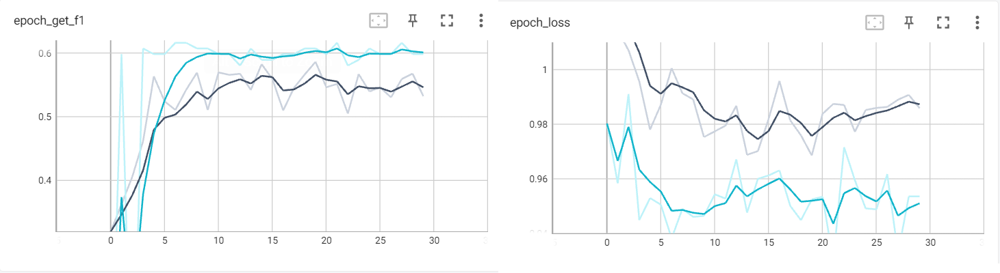

## Model Analysis

From above, it can be seen that the F1 score of the training and validation dataset is similar, with the validation F1 score slightly higher than training, meaning that there was no overfitting occured. However, both of them are at a low figure, of around 0.6, meaning that the model is roughly 60% accurate. Ohter than that, the loss is still high around 0.9 across all epochs. Also, it is observed that there are oscillations of training and validation loss, which could pontentially be caused by a batch size that is too small or a high learning rate.

It is important to note that the validation loss is always slightly lower than training loss. However, taking a closer look at the values, the difference is minimal.

According to Rosebrock (2019), this could occur due to several reasons:  
- Regularization applied only during training but not on validation
- Training loss measure during each epoch while validation loss is measure after
- Data Leakage or validation set is easier than training set
- Model is over-regularized

As measures are taken to ensure that no data leakage occured and the distribution is similar across those datasets and the difference is minimal, this should not be a major problem as of now.

# Approach 1 : Multi-Output Model
From the previous results, the following changes will be made:  
- Batch size: 16 to 32  

It is important to note that as the validation dataset is small, there is a possibility that the data would overlap if the batch size is increased. Thus, augmentation would be performed on the validation dataset as well to increase the data variety.

From the dataset, it can be seen that other than the emotion of the actors, there are also FACS codes that are to be predicted by the model. With that, the baseline model will be modified to accomodate 2 outputs instead to see if it is able to predict different outputs and also hopefully improve its performance through both output.

The model architecture is created to have a bottleneck layer so that loss from both branches could be joined, making the model learn from 2 outputs together.

In [41]:
validation_generator = DataGenerator(val, batch_size=BATCH_SIZE, n_classes1=3, Augment=True, data_prefix=prefix)

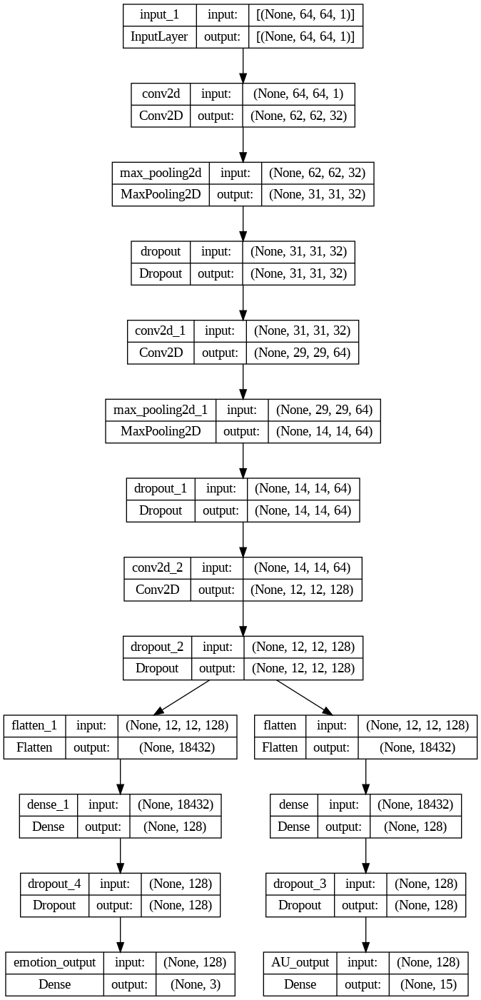

In [42]:
class MultiOutputModel():
  # Base layers from Baseline Model
  def base_layers(self, inputs):
    x = tf.keras.layers.Conv2D(32,(3,3), activation='relu')(inputs)
    x = tf.keras.layers.MaxPool2D()(x)
    x = tf.keras.layers.Dropout(0.25)(x)

    x = tf.keras.layers.Conv2D(64,(3,3), activation='relu')(x)
    x = tf.keras.layers.MaxPool2D()(x)
    x = tf.keras.layers.Dropout(0.25)(x)

    x = tf.keras.layers.Conv2D(128,(3,3), activation='relu')(x)
    x = tf.keras.layers.Dropout(0.4)(x)

    return x

  def build_AU_branch(self, inputs, num_AU=15):
    # Flatten inputs and start training
    x = tf.keras.layers.Flatten()(inputs)
    x = tf.keras.layers.Dense(128, activation='relu')(x)
    x = tf.keras.layers.Dropout(0.5)(x)
    x = tf.keras.layers.Dense(num_AU, activation='sigmoid', name="AU_output")(x)

    return x

  def build_emotion_branch(self, inputs, num_emotion=3):

    x = tf.keras.layers.Flatten()(inputs)
    x = tf.keras.layers.Dense(128, activation='relu')(x)
    x = tf.keras.layers.Dropout(0.5)(x)
    x = tf.keras.layers.Dense(num_emotion, activation='softmax', name="emotion_output")(x)

    return x

  def assemble_full_model(self, width, height, num_AU, num_emotion):
    input_shape = (height, width, 1)

    inputs = tf.keras.layers.Input(shape=input_shape)

    x = self.base_layers(inputs)
    AU_branch = self.build_AU_branch(x, num_AU)
    emotion_branch = self.build_emotion_branch(x, num_emotion)

    model = tf.keras.models.Model(inputs = inputs,
                                  outputs=[emotion_branch, AU_branch])
    return model

model_1 = MultiOutputModel().assemble_full_model(64,64,num_AU=len(au_codes), num_emotion=3)

tf.keras.utils.plot_model(model_1, show_shapes=True)

In [43]:
prefix = ''
BATCH_SIZE = 32

multi_training_generator = DataGenerator(train, batch_size=BATCH_SIZE, n_classes1=3, Augment=True, data_prefix=prefix, multi_output=True)
multi_validation_generator = DataGenerator(val, batch_size=BATCH_SIZE, n_classes1=3, Augment=True, data_prefix=prefix, multi_output=True)

In [ ]:
print(multi_training_generator.__len__())

for x,y in multi_training_generator.__iter__():
  # print(x.shape, y1.shape, y2.shape)
  print(x.shape, [i.shape for i in y])
  # print(y1)
  # print(y2)

11
(32, 64, 64, 1) [(32, 3), (32, 15)]
(32, 64, 64, 1) [(32, 3), (32, 15)]
(32, 64, 64, 1) [(32, 3), (32, 15)]
(32, 64, 64, 1) [(32, 3), (32, 15)]
(32, 64, 64, 1) [(32, 3), (32, 15)]
(32, 64, 64, 1) [(32, 3), (32, 15)]
(32, 64, 64, 1) [(32, 3), (32, 15)]
(32, 64, 64, 1) [(32, 3), (32, 15)]
(32, 64, 64, 1) [(32, 3), (32, 15)]
(32, 64, 64, 1) [(32, 3), (32, 15)]
(32, 64, 64, 1) [(32, 3), (32, 15)]


In [47]:
name_m1 = 'models/model_1'
training = True

model_1.compile(optimizer=tf.keras.optimizers.Adam(),
                loss={'emotion_output': 'categorical_crossentropy',
                      'AU_output': 'binary_crossentropy'
                      },
                loss_weights={
                    'AU_output': 2,
                    'emotion_output': 1
                },

                metrics={'emotion_output': get_f1,
                         'AU_output': get_f1
                })

callbacks, train_model = verify_training(name_m1, training)

if train_model:
  history_1 = model_1.fit(multi_training_generator,
                              epochs=30,
                              callbacks=callbacks,
                              validation_data=multi_validation_generator)

Epoch 1/30
10/10 [==============================] - ETA: 0s - loss: 2.1816 - emotion_output_loss: 1.0695 - AU_output_loss: 0.5561 - emotion_output_get_f1: 0.3433 - AU_output_get_f1: 0.1421
Epoch 1: val_loss improved from inf to 2.07270, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_1/


10/10 [==============================] - 27s 2s/step - loss: 2.1816 - emotion_output_loss: 1.0695 - AU_output_loss: 0.5561 - emotion_output_get_f1: 0.3433 - AU_output_get_f1: 0.1421 - val_loss: 2.0727 - val_emotion_output_loss: 1.0295 - val_AU_output_loss: 0.5216 - val_emotion_output_get_f1: 0.0926 - val_AU_output_get_f1: 0.0000e+00
Epoch 2/30
10/10 [==============================] - ETA: 0s - loss: 1.9965 - emotion_output_loss: 0.9887 - AU_output_loss: 0.5039 - emotion_output_get_f1: 0.4693 - AU_output_get_f1: 0.1966
Epoch 2: val_loss improved from 2.07270 to 1.92947, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_1/


10/10 [==============================] - 18s 2s/step - loss: 1.9965 - emotion_output_loss: 0.9887 - AU_output_loss: 0.5039 - emotion_output_get_f1: 0.4693 - AU_output_get_f1: 0.1966 - val_loss: 1.9295 - val_emotion_output_loss: 0.9181 - val_AU_output_loss: 0.5057 - val_emotion_output_get_f1: 0.5481 - val_AU_output_get_f1: 0.2075
Epoch 3/30
10/10 [==============================] - ETA: 0s - loss: 1.9996 - emotion_output_loss: 1.0011 - AU_output_loss: 0.4993 - emotion_output_get_f1: 0.5193 - AU_output_get_f1: 0.1922
Epoch 3: val_loss improved from 1.92947 to 1.90802, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_1/


10/10 [==============================] - 20s 2s/step - loss: 1.9996 - emotion_output_loss: 1.0011 - AU_output_loss: 0.4993 - emotion_output_get_f1: 0.5193 - AU_output_get_f1: 0.1922 - val_loss: 1.9080 - val_emotion_output_loss: 0.9511 - val_AU_output_loss: 0.4785 - val_emotion_output_get_f1: 0.6070 - val_AU_output_get_f1: 0.2283
Epoch 4/30
10/10 [==============================] - ETA: 0s - loss: 1.9735 - emotion_output_loss: 1.0058 - AU_output_loss: 0.4839 - emotion_output_get_f1: 0.5216 - AU_output_get_f1: 0.1814
Epoch 4: val_loss did not improve from 1.90802
10/10 [==============================] - 25s 3s/step - loss: 1.9735 - emotion_output_loss: 1.0058 - AU_output_loss: 0.4839 - emotion_output_get_f1: 0.5216 - AU_output_get_f1: 0.1814 - val_loss: 1.9137 - val_emotion_output_loss: 0.9300 - val_AU_output_loss: 0.4918 - val_emotion_output_get_f1: 0.4298 - val_AU_output_get_f1: 0.1968
Epoch 5/30
10/10 [==============================] - ETA: 0s - loss: 1.9679 - emotion_output_loss: 1.00

10/10 [==============================] - 22s 2s/step - loss: 1.9679 - emotion_output_loss: 1.0000 - AU_output_loss: 0.4840 - emotion_output_get_f1: 0.3758 - AU_output_get_f1: 0.1905 - val_loss: 1.8908 - val_emotion_output_loss: 0.9235 - val_AU_output_loss: 0.4836 - val_emotion_output_get_f1: 0.6354 - val_AU_output_get_f1: 0.2112
Epoch 6/30
10/10 [==============================] - ETA: 0s - loss: 1.9763 - emotion_output_loss: 0.9995 - AU_output_loss: 0.4884 - emotion_output_get_f1: 0.4590 - AU_output_get_f1: 0.2056
Epoch 6: val_loss did not improve from 1.89076
10/10 [==============================] - 16s 2s/step - loss: 1.9763 - emotion_output_loss: 0.9995 - AU_output_loss: 0.4884 - emotion_output_get_f1: 0.4590 - AU_output_get_f1: 0.2056 - val_loss: 1.9420 - val_emotion_output_loss: 0.9688 - val_AU_output_loss: 0.4866 - val_emotion_output_get_f1: 0.5833 - val_AU_output_get_f1: 0.2338
Epoch 7/30
10/10 [==============================] - ETA: 0s - loss: 1.9610 - emotion_output_loss: 0.99

10/10 [==============================] - 20s 2s/step - loss: 1.9330 - emotion_output_loss: 0.9847 - AU_output_loss: 0.4741 - emotion_output_get_f1: 0.5442 - AU_output_get_f1: 0.1759 - val_loss: 1.8846 - val_emotion_output_loss: 0.9164 - val_AU_output_loss: 0.4841 - val_emotion_output_get_f1: 0.6354 - val_AU_output_get_f1: 0.2164
Epoch 17/30
10/10 [==============================] - ETA: 0s - loss: 1.9272 - emotion_output_loss: 0.9767 - AU_output_loss: 0.4753 - emotion_output_get_f1: 0.5293 - AU_output_get_f1: 0.1956
Epoch 17: val_loss did not improve from 1.88459
10/10 [==============================] - 19s 2s/step - loss: 1.9272 - emotion_output_loss: 0.9767 - AU_output_loss: 0.4753 - emotion_output_get_f1: 0.5293 - AU_output_get_f1: 0.1956 - val_loss: 1.8982 - val_emotion_output_loss: 0.9115 - val_AU_output_loss: 0.4934 - val_emotion_output_get_f1: 0.6354 - val_AU_output_get_f1: 0.2148
Epoch 18/30
10/10 [==============================] - ETA: 0s - loss: 1.9341 - emotion_output_loss: 0

10/10 [==============================] - 17s 2s/step - loss: 1.9125 - emotion_output_loss: 0.9668 - AU_output_loss: 0.4728 - emotion_output_get_f1: 0.5676 - AU_output_get_f1: 0.1754 - val_loss: 1.8605 - val_emotion_output_loss: 0.9005 - val_AU_output_loss: 0.4800 - val_emotion_output_get_f1: 0.6458 - val_AU_output_get_f1: 0.2273
Epoch 26/30
10/10 [==============================] - ETA: 0s - loss: 1.9201 - emotion_output_loss: 0.9763 - AU_output_loss: 0.4719 - emotion_output_get_f1: 0.5543 - AU_output_get_f1: 0.1981
Epoch 26: val_loss did not improve from 1.86052
10/10 [==============================] - 16s 2s/step - loss: 1.9201 - emotion_output_loss: 0.9763 - AU_output_loss: 0.4719 - emotion_output_get_f1: 0.5543 - AU_output_get_f1: 0.1981 - val_loss: 1.8986 - val_emotion_output_loss: 0.9444 - val_AU_output_loss: 0.4771 - val_emotion_output_get_f1: 0.6042 - val_AU_output_get_f1: 0.2309
Epoch 27/30
10/10 [==============================] - ETA: 0s - loss: 1.9185 - emotion_output_loss: 0

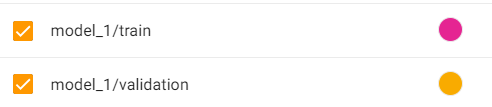

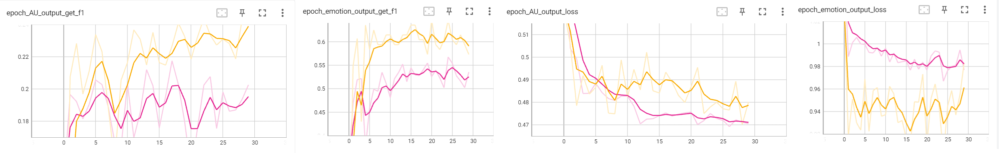

## Model Analysis
From the learning curve shown in Tensorboard, it shows that for FACS Codes prediction, the training and validation loss was able to converge more than the previous model. However, the performance was really bad, with an F1 Score of around 20%, the performance of HLE also did not improve (Approximately 60%). This suggests, underfitting, thus, the model complexity will be increased.  

Additionally, the F1 Score was clearly oscillating for validation dataset. On the other hand, the F1 Score of HLE was able to increase steadily, however, the validation loss was inconsistent as well.

This suggests 2 things:
- Learning rate is too high (Brownlee, 2020)  
OR
- Batch size is too small

Since the batch size has already been increased, the learning rate will be updated to deay through time.


# Approach 2 : Multi-Output Model [Increased Complexity, Learning Rate Decay]

Changes made from previous results include:  
- Learning Rate: 0.001 to 0.001 decay through time

Singhal (2021) proposed a model that could detect facial expressions with a higher accuracy of 68%. Additionally, the model was able to detect facial expression on video feed. Thus, the model's architecture will be adopted and see if this would improve the performance of our model. However, a global average pooling layer will be added to reduce the dimensionality of feature maps.

### Function: Learning Rate Decay

In [44]:
STEPS_PER_EPOCH = len(train.index)//BATCH_SIZE
lr_schedule = tf.keras.optimizers.schedules.InverseTimeDecay(
  0.001,
  # Decay 1000 times per step
  decay_steps=STEPS_PER_EPOCH*1000,
  decay_rate=1,
  staircase=False)

# Source: Week 5 Lab Exercises

In [45]:
class MultiOutputModel_1(MultiOutputModel):
  def base_layers(self, inputs):
      x = tf.keras.layers.Conv2D(64,(3,3), padding='same')(inputs)
      x = tf.keras.layers.BatchNormalization()(x)
      x = tf.keras.activations.relu(x)
      x = tf.keras.layers.MaxPool2D(pool_size=(2,2))(x)
      x = tf.keras.layers.Dropout(0.25)(x)


      x = tf.keras.layers.Conv2D(128,(5,5), padding='same')(inputs)
      x = tf.keras.layers.BatchNormalization()(x)
      x = tf.keras.activations.relu(x)
      x = tf.keras.layers.MaxPool2D(pool_size=(2,2))(x)
      x = tf.keras.layers.Dropout(0.25)(x)

      x = tf.keras.layers.Conv2D(512,(3,3), padding='same')(inputs)
      x = tf.keras.layers.BatchNormalization()(x)
      x = tf.keras.activations.relu(x)
      x = tf.keras.layers.MaxPool2D(pool_size=(2,2))(x)
      x = tf.keras.layers.Dropout(0.25)(x)

      x = tf.keras.layers.Conv2D(512,(3,3), padding='same')(inputs)
      x = tf.keras.layers.BatchNormalization()(x)
      x = tf.keras.activations.relu(x)
      x = tf.keras.layers.MaxPool2D(pool_size=(2,2))(x)
      x = tf.keras.layers.Dropout(0.25)(x)

      x = tf.keras.layers.GlobalAveragePooling2D()(x)

      return x

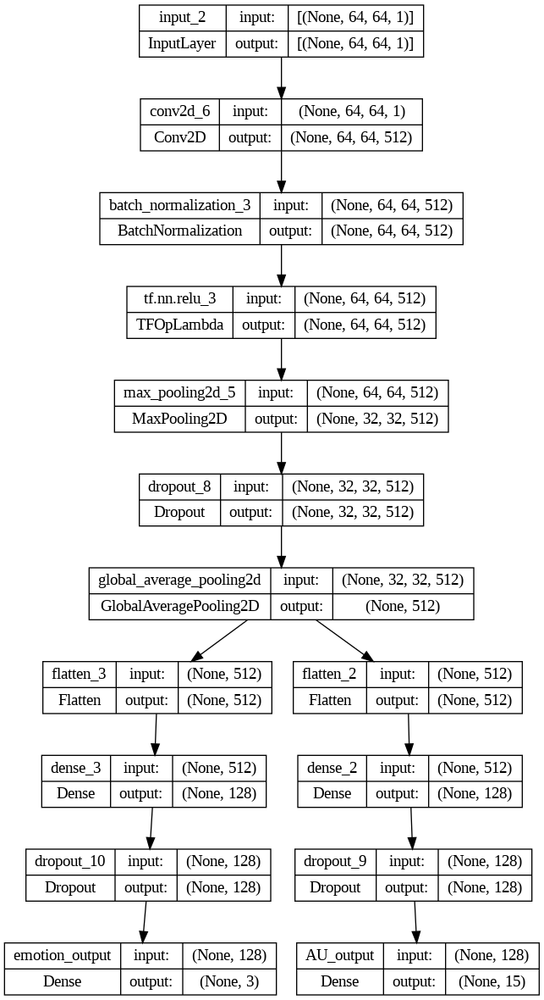

In [46]:
model_2 = MultiOutputModel_1().assemble_full_model(64,64,num_AU=len(au_codes), num_emotion=3)
tf.keras.utils.plot_model(model_2, show_shapes=True)

In [69]:
name_m2 = 'models/model_2'
training = True

model_2.compile(optimizer=tf.keras.optimizers.Adam(lr_schedule),
                loss={'emotion_output': 'categorical_crossentropy',
                      'AU_output': 'binary_crossentropy'
                      },
                loss_weights={
                    'AU_output': 2,
                    'emotion_output': 1
                },

                metrics={'emotion_output': get_f1,
                         'AU_output': get_f1
                })

callbacks, train_model = verify_training(name_m2, training)

if train_model:
  history_2 = model_2.fit(multi_training_generator,
                              epochs=30,
                              callbacks=callbacks,
                              validation_data=multi_validation_generator)

Epoch 1/30
10/10 [==============================] - ETA: 0s - loss: 2.3106 - emotion_output_loss: 1.1046 - AU_output_loss: 0.6030 - emotion_output_get_f1: 0.3973 - AU_output_get_f1: 0.2553
Epoch 1: val_loss improved from inf to 2.40596, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_2/


10/10 [==============================] - 26s 2s/step - loss: 2.3106 - emotion_output_loss: 1.1046 - AU_output_loss: 0.6030 - emotion_output_get_f1: 0.3973 - AU_output_get_f1: 0.2553 - val_loss: 2.4060 - val_emotion_output_loss: 1.0824 - val_AU_output_loss: 0.6618 - val_emotion_output_get_f1: 0.0000e+00 - val_AU_output_get_f1: 0.1233
Epoch 2/30
10/10 [==============================] - ETA: 0s - loss: 2.1657 - emotion_output_loss: 1.0773 - AU_output_loss: 0.5442 - emotion_output_get_f1: 0.4398 - AU_output_get_f1: 0.2697
Epoch 2: val_loss improved from 2.40596 to 2.38137, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_2/


10/10 [==============================] - 18s 2s/step - loss: 2.1657 - emotion_output_loss: 1.0773 - AU_output_loss: 0.5442 - emotion_output_get_f1: 0.4398 - AU_output_get_f1: 0.2697 - val_loss: 2.3814 - val_emotion_output_loss: 1.0775 - val_AU_output_loss: 0.6520 - val_emotion_output_get_f1: 0.0000e+00 - val_AU_output_get_f1: 0.2229
Epoch 3/30
10/10 [==============================] - ETA: 0s - loss: 2.1270 - emotion_output_loss: 1.0557 - AU_output_loss: 0.5356 - emotion_output_get_f1: 0.2433 - AU_output_get_f1: 0.2451
Epoch 3: val_loss did not improve from 2.38137
10/10 [==============================] - 16s 2s/step - loss: 2.1270 - emotion_output_loss: 1.0557 - AU_output_loss: 0.5356 - emotion_output_get_f1: 0.2433 - AU_output_get_f1: 0.2451 - val_loss: 2.3860 - val_emotion_output_loss: 1.0823 - val_AU_output_loss: 0.6519 - val_emotion_output_get_f1: 0.0000e+00 - val_AU_output_get_f1: 0.2217
Epoch 4/30
10/10 [==============================] - ETA: 0s - loss: 2.0857 - emotion_output_lo

10/10 [==============================] - 19s 2s/step - loss: 2.0857 - emotion_output_loss: 1.0345 - AU_output_loss: 0.5256 - emotion_output_get_f1: 0.3891 - AU_output_get_f1: 0.2269 - val_loss: 2.3671 - val_emotion_output_loss: 1.0663 - val_AU_output_loss: 0.6504 - val_emotion_output_get_f1: 0.0000e+00 - val_AU_output_get_f1: 0.2252
Epoch 5/30
10/10 [==============================] - ETA: 0s - loss: 2.0824 - emotion_output_loss: 1.0331 - AU_output_loss: 0.5246 - emotion_output_get_f1: 0.3425 - AU_output_get_f1: 0.2325
Epoch 5: val_loss improved from 2.36714 to 2.35967, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_2/


10/10 [==============================] - 18s 2s/step - loss: 2.0824 - emotion_output_loss: 1.0331 - AU_output_loss: 0.5246 - emotion_output_get_f1: 0.3425 - AU_output_get_f1: 0.2325 - val_loss: 2.3597 - val_emotion_output_loss: 1.0695 - val_AU_output_loss: 0.6451 - val_emotion_output_get_f1: 0.0000e+00 - val_AU_output_get_f1: 0.2137
Epoch 6/30
10/10 [==============================] - ETA: 0s - loss: 2.0496 - emotion_output_loss: 1.0061 - AU_output_loss: 0.5218 - emotion_output_get_f1: 0.3687 - AU_output_get_f1: 0.2202
Epoch 6: val_loss improved from 2.35967 to 2.33081, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_2/


10/10 [==============================] - 18s 2s/step - loss: 2.0496 - emotion_output_loss: 1.0061 - AU_output_loss: 0.5218 - emotion_output_get_f1: 0.3687 - AU_output_get_f1: 0.2202 - val_loss: 2.3308 - val_emotion_output_loss: 1.0656 - val_AU_output_loss: 0.6326 - val_emotion_output_get_f1: 0.0000e+00 - val_AU_output_get_f1: 0.2192
Epoch 7/30
10/10 [==============================] - ETA: 0s - loss: 2.0396 - emotion_output_loss: 1.0135 - AU_output_loss: 0.5130 - emotion_output_get_f1: 0.4032 - AU_output_get_f1: 0.2644
Epoch 7: val_loss improved from 2.33081 to 2.30627, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_2/


10/10 [==============================] - 18s 2s/step - loss: 2.0396 - emotion_output_loss: 1.0135 - AU_output_loss: 0.5130 - emotion_output_get_f1: 0.4032 - AU_output_get_f1: 0.2644 - val_loss: 2.3063 - val_emotion_output_loss: 1.0585 - val_AU_output_loss: 0.6239 - val_emotion_output_get_f1: 0.0000e+00 - val_AU_output_get_f1: 0.2352
Epoch 8/30
10/10 [==============================] - ETA: 0s - loss: 2.0264 - emotion_output_loss: 1.0136 - AU_output_loss: 0.5064 - emotion_output_get_f1: 0.3716 - AU_output_get_f1: 0.2337
Epoch 8: val_loss improved from 2.30627 to 2.28591, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_2/


10/10 [==============================] - 18s 2s/step - loss: 2.0264 - emotion_output_loss: 1.0136 - AU_output_loss: 0.5064 - emotion_output_get_f1: 0.3716 - AU_output_get_f1: 0.2337 - val_loss: 2.2859 - val_emotion_output_loss: 1.0575 - val_AU_output_loss: 0.6142 - val_emotion_output_get_f1: 0.0000e+00 - val_AU_output_get_f1: 0.2359
Epoch 9/30
10/10 [==============================] - ETA: 0s - loss: 2.0412 - emotion_output_loss: 1.0245 - AU_output_loss: 0.5084 - emotion_output_get_f1: 0.3290 - AU_output_get_f1: 0.2175
Epoch 9: val_loss improved from 2.28591 to 2.26198, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_2/


10/10 [==============================] - 21s 2s/step - loss: 2.0412 - emotion_output_loss: 1.0245 - AU_output_loss: 0.5084 - emotion_output_get_f1: 0.3290 - AU_output_get_f1: 0.2175 - val_loss: 2.2620 - val_emotion_output_loss: 1.0603 - val_AU_output_loss: 0.6008 - val_emotion_output_get_f1: 0.0000e+00 - val_AU_output_get_f1: 0.2357
Epoch 10/30
10/10 [==============================] - ETA: 0s - loss: 2.0028 - emotion_output_loss: 1.0079 - AU_output_loss: 0.4974 - emotion_output_get_f1: 0.2889 - AU_output_get_f1: 0.2291
Epoch 10: val_loss improved from 2.26198 to 2.24308, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_2/


10/10 [==============================] - 18s 2s/step - loss: 2.0028 - emotion_output_loss: 1.0079 - AU_output_loss: 0.4974 - emotion_output_get_f1: 0.2889 - AU_output_get_f1: 0.2291 - val_loss: 2.2431 - val_emotion_output_loss: 1.0569 - val_AU_output_loss: 0.5931 - val_emotion_output_get_f1: 0.0000e+00 - val_AU_output_get_f1: 0.2389
Epoch 11/30
10/10 [==============================] - ETA: 0s - loss: 2.0317 - emotion_output_loss: 1.0353 - AU_output_loss: 0.4982 - emotion_output_get_f1: 0.3543 - AU_output_get_f1: 0.2150
Epoch 11: val_loss improved from 2.24308 to 2.21359, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_2/


10/10 [==============================] - 18s 2s/step - loss: 2.0317 - emotion_output_loss: 1.0353 - AU_output_loss: 0.4982 - emotion_output_get_f1: 0.3543 - AU_output_get_f1: 0.2150 - val_loss: 2.2136 - val_emotion_output_loss: 1.0383 - val_AU_output_loss: 0.5877 - val_emotion_output_get_f1: 0.0000e+00 - val_AU_output_get_f1: 0.2233
Epoch 12/30
10/10 [==============================] - ETA: 0s - loss: 2.0082 - emotion_output_loss: 1.0201 - AU_output_loss: 0.4941 - emotion_output_get_f1: 0.3746 - AU_output_get_f1: 0.1949
Epoch 12: val_loss improved from 2.21359 to 2.18208, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_2/


10/10 [==============================] - 19s 2s/step - loss: 2.0082 - emotion_output_loss: 1.0201 - AU_output_loss: 0.4941 - emotion_output_get_f1: 0.3746 - AU_output_get_f1: 0.1949 - val_loss: 2.1821 - val_emotion_output_loss: 1.0387 - val_AU_output_loss: 0.5717 - val_emotion_output_get_f1: 0.0000e+00 - val_AU_output_get_f1: 0.2204
Epoch 13/30
10/10 [==============================] - ETA: 0s - loss: 1.9903 - emotion_output_loss: 1.0009 - AU_output_loss: 0.4947 - emotion_output_get_f1: 0.3674 - AU_output_get_f1: 0.2139
Epoch 13: val_loss improved from 2.18208 to 2.16577, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_2/


10/10 [==============================] - 18s 2s/step - loss: 1.9903 - emotion_output_loss: 1.0009 - AU_output_loss: 0.4947 - emotion_output_get_f1: 0.3674 - AU_output_get_f1: 0.2139 - val_loss: 2.1658 - val_emotion_output_loss: 1.0332 - val_AU_output_loss: 0.5663 - val_emotion_output_get_f1: 0.0000e+00 - val_AU_output_get_f1: 0.2256
Epoch 14/30
10/10 [==============================] - ETA: 0s - loss: 1.9798 - emotion_output_loss: 1.0120 - AU_output_loss: 0.4839 - emotion_output_get_f1: 0.3816 - AU_output_get_f1: 0.2052
Epoch 14: val_loss improved from 2.16577 to 2.11386, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_2/


10/10 [==============================] - 18s 2s/step - loss: 1.9798 - emotion_output_loss: 1.0120 - AU_output_loss: 0.4839 - emotion_output_get_f1: 0.3816 - AU_output_get_f1: 0.2052 - val_loss: 2.1139 - val_emotion_output_loss: 1.0192 - val_AU_output_loss: 0.5473 - val_emotion_output_get_f1: 0.0000e+00 - val_AU_output_get_f1: 0.2068
Epoch 15/30
10/10 [==============================] - ETA: 0s - loss: 1.9857 - emotion_output_loss: 1.0084 - AU_output_loss: 0.4887 - emotion_output_get_f1: 0.3712 - AU_output_get_f1: 0.2316
Epoch 15: val_loss did not improve from 2.11386
10/10 [==============================] - 17s 2s/step - loss: 1.9857 - emotion_output_loss: 1.0084 - AU_output_loss: 0.4887 - emotion_output_get_f1: 0.3712 - AU_output_get_f1: 0.2316 - val_loss: 2.1167 - val_emotion_output_loss: 1.0245 - val_AU_output_loss: 0.5461 - val_emotion_output_get_f1: 0.0000e+00 - val_AU_output_get_f1: 0.2332
Epoch 16/30
10/10 [==============================] - ETA: 0s - loss: 1.9916 - emotion_output

10/10 [==============================] - 21s 2s/step - loss: 1.9916 - emotion_output_loss: 1.0086 - AU_output_loss: 0.4915 - emotion_output_get_f1: 0.4284 - AU_output_get_f1: 0.2163 - val_loss: 2.0960 - val_emotion_output_loss: 1.0165 - val_AU_output_loss: 0.5398 - val_emotion_output_get_f1: 0.0000e+00 - val_AU_output_get_f1: 0.2284
Epoch 17/30
10/10 [==============================] - ETA: 0s - loss: 1.9966 - emotion_output_loss: 1.0211 - AU_output_loss: 0.4878 - emotion_output_get_f1: 0.3201 - AU_output_get_f1: 0.1943
Epoch 17: val_loss did not improve from 2.09601
10/10 [==============================] - 18s 2s/step - loss: 1.9966 - emotion_output_loss: 1.0211 - AU_output_loss: 0.4878 - emotion_output_get_f1: 0.3201 - AU_output_get_f1: 0.1943 - val_loss: 2.1066 - val_emotion_output_loss: 1.0365 - val_AU_output_loss: 0.5350 - val_emotion_output_get_f1: 0.0000e+00 - val_AU_output_get_f1: 0.2310
Epoch 18/30
10/10 [==============================] - ETA: 0s - loss: 1.9731 - emotion_output

10/10 [==============================] - 18s 2s/step - loss: 1.9731 - emotion_output_loss: 0.9979 - AU_output_loss: 0.4876 - emotion_output_get_f1: 0.3921 - AU_output_get_f1: 0.2092 - val_loss: 2.0774 - val_emotion_output_loss: 1.0208 - val_AU_output_loss: 0.5283 - val_emotion_output_get_f1: 0.0000e+00 - val_AU_output_get_f1: 0.2361
Epoch 19/30
10/10 [==============================] - ETA: 0s - loss: 1.9773 - emotion_output_loss: 1.0098 - AU_output_loss: 0.4837 - emotion_output_get_f1: 0.4412 - AU_output_get_f1: 0.2054
Epoch 19: val_loss improved from 2.07740 to 2.03314, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_2/


10/10 [==============================] - 18s 2s/step - loss: 1.9773 - emotion_output_loss: 1.0098 - AU_output_loss: 0.4837 - emotion_output_get_f1: 0.4412 - AU_output_get_f1: 0.2054 - val_loss: 2.0331 - val_emotion_output_loss: 1.0031 - val_AU_output_loss: 0.5150 - val_emotion_output_get_f1: 0.0000e+00 - val_AU_output_get_f1: 0.2310
Epoch 20/30
10/10 [==============================] - ETA: 0s - loss: 1.9789 - emotion_output_loss: 1.0067 - AU_output_loss: 0.4861 - emotion_output_get_f1: 0.4315 - AU_output_get_f1: 0.2029
Epoch 20: val_loss did not improve from 2.03314
10/10 [==============================] - 18s 2s/step - loss: 1.9789 - emotion_output_loss: 1.0067 - AU_output_loss: 0.4861 - emotion_output_get_f1: 0.4315 - AU_output_get_f1: 0.2029 - val_loss: 2.0343 - val_emotion_output_loss: 1.0107 - val_AU_output_loss: 0.5118 - val_emotion_output_get_f1: 0.0000e+00 - val_AU_output_get_f1: 0.2362
Epoch 21/30
10/10 [==============================] - ETA: 0s - loss: 1.9529 - emotion_output

10/10 [==============================] - 18s 2s/step - loss: 1.9248 - emotion_output_loss: 0.9754 - AU_output_loss: 0.4747 - emotion_output_get_f1: 0.4260 - AU_output_get_f1: 0.2289 - val_loss: 2.0135 - val_emotion_output_loss: 1.0067 - val_AU_output_loss: 0.5034 - val_emotion_output_get_f1: 0.0000e+00 - val_AU_output_get_f1: 0.2447
Epoch 23/30
10/10 [==============================] - ETA: 0s - loss: 1.9870 - emotion_output_loss: 1.0238 - AU_output_loss: 0.4816 - emotion_output_get_f1: 0.4318 - AU_output_get_f1: 0.2210
Epoch 23: val_loss improved from 2.01349 to 1.99230, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_2/


10/10 [==============================] - 18s 2s/step - loss: 1.9870 - emotion_output_loss: 1.0238 - AU_output_loss: 0.4816 - emotion_output_get_f1: 0.4318 - AU_output_get_f1: 0.2210 - val_loss: 1.9923 - val_emotion_output_loss: 0.9894 - val_AU_output_loss: 0.5014 - val_emotion_output_get_f1: 0.0000e+00 - val_AU_output_get_f1: 0.2108
Epoch 24/30
10/10 [==============================] - ETA: 0s - loss: 1.9547 - emotion_output_loss: 1.0012 - AU_output_loss: 0.4768 - emotion_output_get_f1: 0.3966 - AU_output_get_f1: 0.1898
Epoch 24: val_loss did not improve from 1.99230
10/10 [==============================] - 17s 2s/step - loss: 1.9547 - emotion_output_loss: 1.0012 - AU_output_loss: 0.4768 - emotion_output_get_f1: 0.3966 - AU_output_get_f1: 0.1898 - val_loss: 2.0133 - val_emotion_output_loss: 1.0244 - val_AU_output_loss: 0.4945 - val_emotion_output_get_f1: 0.0000e+00 - val_AU_output_get_f1: 0.2407
Epoch 25/30
10/10 [==============================] - ETA: 0s - loss: 1.9639 - emotion_output

10/10 [==============================] - 18s 2s/step - loss: 1.9509 - emotion_output_loss: 0.9926 - AU_output_loss: 0.4791 - emotion_output_get_f1: 0.3108 - AU_output_get_f1: 0.1966 - val_loss: 1.9840 - val_emotion_output_loss: 0.9775 - val_AU_output_loss: 0.5033 - val_emotion_output_get_f1: 0.0000e+00 - val_AU_output_get_f1: 0.2137
Epoch 28/30
10/10 [==============================] - ETA: 0s - loss: 1.9590 - emotion_output_loss: 0.9967 - AU_output_loss: 0.4811 - emotion_output_get_f1: 0.4474 - AU_output_get_f1: 0.1825
Epoch 28: val_loss improved from 1.98398 to 1.97802, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_2/


10/10 [==============================] - 18s 2s/step - loss: 1.9590 - emotion_output_loss: 0.9967 - AU_output_loss: 0.4811 - emotion_output_get_f1: 0.4474 - AU_output_get_f1: 0.1825 - val_loss: 1.9780 - val_emotion_output_loss: 0.9958 - val_AU_output_loss: 0.4911 - val_emotion_output_get_f1: 0.0000e+00 - val_AU_output_get_f1: 0.2387
Epoch 29/30
10/10 [==============================] - ETA: 0s - loss: 1.9658 - emotion_output_loss: 1.0002 - AU_output_loss: 0.4828 - emotion_output_get_f1: 0.4549 - AU_output_get_f1: 0.2315
Epoch 29: val_loss improved from 1.97802 to 1.97781, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_2/


10/10 [==============================] - 18s 2s/step - loss: 1.9658 - emotion_output_loss: 1.0002 - AU_output_loss: 0.4828 - emotion_output_get_f1: 0.4549 - AU_output_get_f1: 0.2315 - val_loss: 1.9778 - val_emotion_output_loss: 0.9915 - val_AU_output_loss: 0.4931 - val_emotion_output_get_f1: 0.0000e+00 - val_AU_output_get_f1: 0.2273
Epoch 30/30
10/10 [==============================] - ETA: 0s - loss: 1.9740 - emotion_output_loss: 1.0144 - AU_output_loss: 0.4798 - emotion_output_get_f1: 0.3097 - AU_output_get_f1: 0.2009
Epoch 30: val_loss did not improve from 1.97781
10/10 [==============================] - 18s 2s/step - loss: 1.9740 - emotion_output_loss: 1.0144 - AU_output_loss: 0.4798 - emotion_output_get_f1: 0.3097 - AU_output_get_f1: 0.2009 - val_loss: 1.9846 - val_emotion_output_loss: 0.9986 - val_AU_output_loss: 0.4930 - val_emotion_output_get_f1: 0.0000e+00 - val_AU_output_get_f1: 0.2238


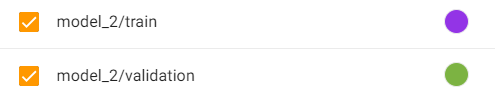

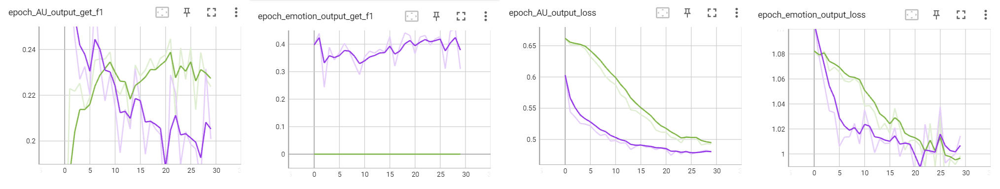

## Model Analysis
It can be seen that even after increasing the complexity of the model, the model's performance became worse, with the F1 Score for the HLE validation set remaining 0 across all epochs. This could be caused by the loss weights assigned to the branches. With that, transfer learning will now be considered to see if the performance will improve. Additionally, the F1 Score FACS codes are very unstable, this could indicate that the issue previously mentioned was still not resolved.

# Approach 3 : Transfer Learning
Changes from previous results:  
- Batch size : 32 to 48
- Loss weights : HLE: 1 to 0.5, FACS: 2 to 0.5  

From the documentations, it seems like **MobileNetV2** is a common pre-trained models used. Culfax (2018) also mentioned that it's lightweight architecture that reduces computation and model size.

This is also under the consideration that as stated by Schneider and Xhafa (2022), the model's complexity is determined by the nature of the training data. With a small dataset, the complexity of one's model should be decreased as overfitting would be an issue with high-complexity models.

Thus, in this approach, transfer learning will be tried out with that model


From Tensorflow's documentation, it is shown that the input shape has to be of 224 by 224 or the difference should be no smaller than by 32. Other than that, the input shape has to have 3 channels. There is a provided function that pre-processes the images to suit the model. Thus, that function will be used. Additionally, in the `preprocess_input` function, the function assumes that the values range between 0 to 255, which was initially not the case with our dataset as well.

In [47]:
BATCH_SIZE = 48
color_training_generator = DataGenerator(train, dim=(224,224,3), batch_size=BATCH_SIZE, n_classes1=3, Augment=True, data_prefix=prefix, multi_output=True, rgb=True, normalize=False)
color_validation_generator = DataGenerator(val, dim=(224,224,3), batch_size=BATCH_SIZE, n_classes1=3, Augment=True, data_prefix=prefix, multi_output=True, rgb=True, normalize=False)

STEPS_PER_EPOCH = len(train.index)//BATCH_SIZE
lr_schedule = tf.keras.optimizers.schedules.InverseTimeDecay(
  0.001,
  # Decay 1000 times per step
  decay_steps=STEPS_PER_EPOCH*1000,
  decay_rate=1,
  staircase=False)

# Source: Week 5 Lab Exercises

Now that the images are converted into RGB format and resized appropriately, it is safer to visualize some of the images and see if the augmentation is suitable for color images.

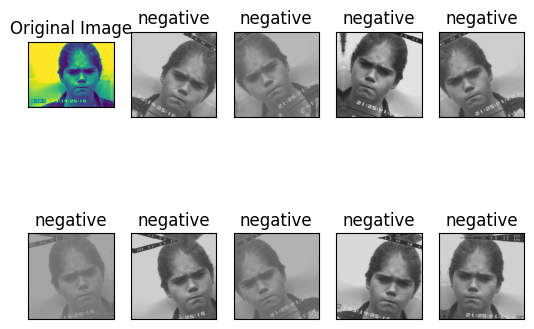

In [71]:
color_training_generator.show_individual()

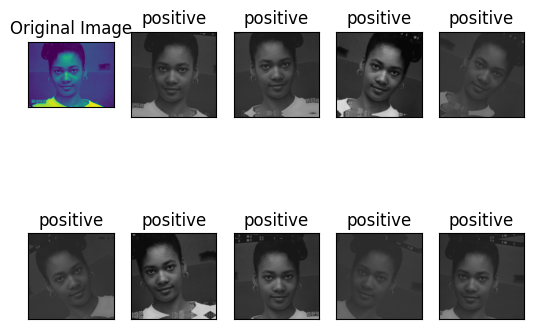

In [72]:
color_training_generator.show_individual()

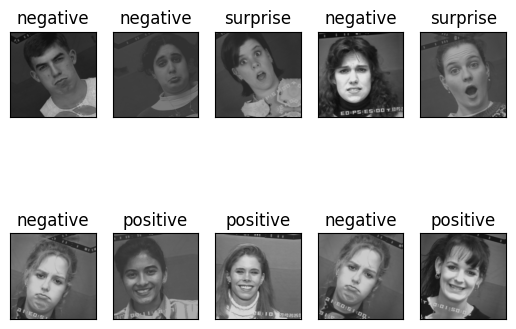

In [73]:
color_training_generator.show()

From the visualizations above, it can be seen that the current augmentation procedure is not suitable anymore after the images are converted to RGB. This could be caused by the random brightness and contrast. Thus, those values will be lowered.

### Function : Tweak Data Generator Augmentation

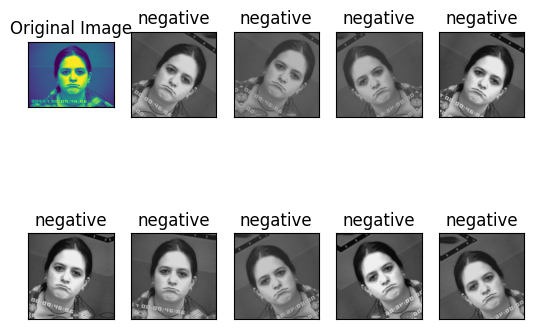

In [48]:
color_training_generator.change_brightness_delta(0.1)
color_training_generator.change_contrast_lb(0.5)

color_training_generator.show_individual()

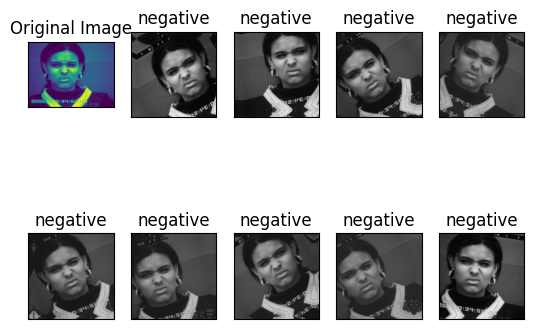

In [49]:
color_training_generator.show_individual()

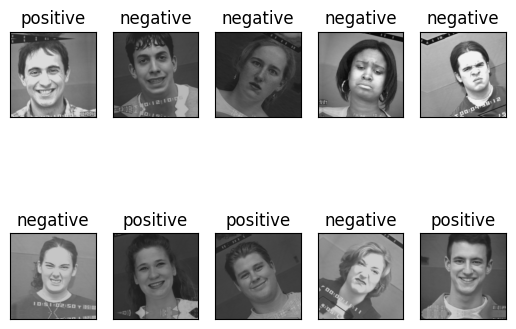

In [50]:
color_training_generator.show()

After tweaking the augmentation, it can be seen that now all images are pretty clear and suitable for training now. Now, the same tweak will be applied to the validation data generator as well and the model will now be trained.

In [ ]:
color_validation_generator.change_brightness_delta(0.1)
color_validation_generator.change_contrast_lb(0.5)

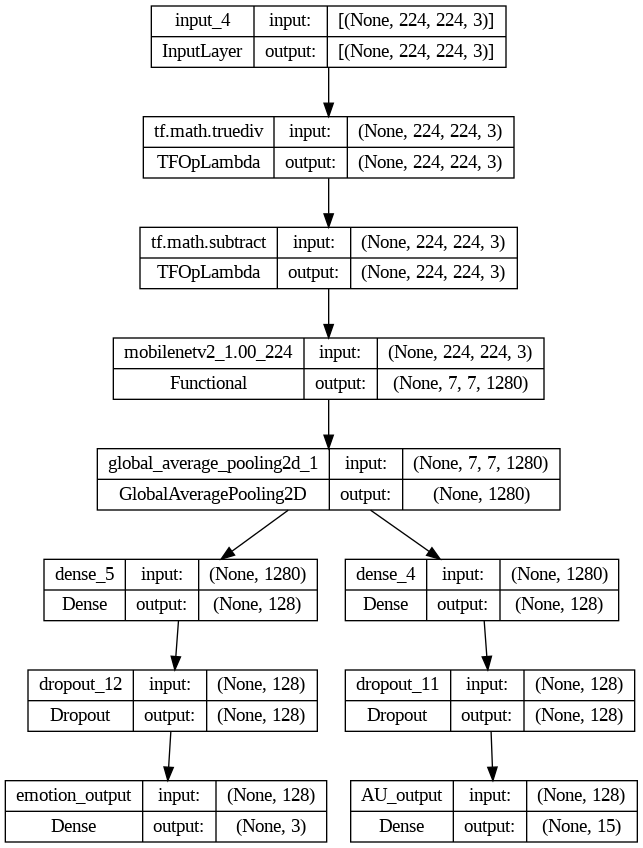

In [49]:
class MultiOutputModel_pretrained():

  def __init__(self, IMG_SHAPE):
    self.base_model = tf.keras.applications.MobileNetV2(input_shape=IMG_SHAPE,
                                               include_top=False,
                                               weights='imagenet'
                                               )

  def base_layers(self, inputs):
    x = tf.keras.applications.mobilenet_v2.preprocess_input(inputs)
    x = self.base_model(x, training=False)

    x = tf.keras.layers.GlobalAveragePooling2D()(x)

    return x

  def build_AU_branch(self, inputs, num_AU=15):
    x = tf.keras.layers.Dense(128, activation='relu')(inputs)
    x = tf.keras.layers.Dropout(0.5)(x)
    x = tf.keras.layers.Dense(num_AU, activation='sigmoid', name="AU_output")(x)

    return x

  def build_emotion_branch(self, inputs, num_emotion=3):
    x = tf.keras.layers.Dense(128, activation='relu')(inputs)
    x = tf.keras.layers.Dropout(0.5)(x)
    x = tf.keras.layers.Dense(num_emotion, activation='softmax', name="emotion_output")(x)

    return x

  def assemble_full_model(self, width, height, num_AU, num_emotion):
    input_shape = (height, width, 3)

    inputs = tf.keras.layers.Input(shape=input_shape)

    x = self.base_layers(inputs)
    AU_branch = self.build_AU_branch(x, num_AU)
    emotion_branch = self.build_emotion_branch(x, num_emotion)

    model = tf.keras.models.Model(inputs = inputs,
                                  outputs=[emotion_branch, AU_branch])
    return model

model_3 = MultiOutputModel_pretrained((224,224,3)).assemble_full_model(224,224,num_AU=len(au_codes), num_emotion=3)
# model.summary()
tf.keras.utils.plot_model(model_3, show_shapes=True)

In [80]:
name_m3 = 'models/model_3'
training = True

model_3.compile(optimizer=tf.keras.optimizers.Adam(lr_schedule),
                loss={'emotion_output': 'categorical_crossentropy',
                      'AU_output': 'binary_crossentropy'
                      },
                loss_weights={
                    'AU_output': 0.5,
                    'emotion_output': 0.5
                },

                metrics={'emotion_output': get_f1,
                         'AU_output': get_f1
                })

callbacks, train_model = verify_training(name_m3, training)

if train_model:
  history_3 = model_3.fit(color_training_generator,
                              epochs=30,
                              callbacks=callbacks,
                              validation_data=color_validation_generator)

Epoch 1/30
6/6 [==============================] - ETA: 0s - loss: 1.4565 - emotion_output_loss: 2.1461 - AU_output_loss: 0.7668 - emotion_output_get_f1: 0.3270 - AU_output_get_f1: 0.3215
Epoch 1: val_loss improved from inf to 0.81506, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_3/


6/6 [==============================] - 76s 9s/step - loss: 1.4565 - emotion_output_loss: 2.1461 - AU_output_loss: 0.7668 - emotion_output_get_f1: 0.3270 - AU_output_get_f1: 0.3215 - val_loss: 0.8151 - val_emotion_output_loss: 1.1229 - val_AU_output_loss: 0.5072 - val_emotion_output_get_f1: 0.5729 - val_AU_output_get_f1: 0.4040
Epoch 2/30
6/6 [==============================] - ETA: 0s - loss: 0.8726 - emotion_output_loss: 1.1383 - AU_output_loss: 0.6068 - emotion_output_get_f1: 0.4269 - AU_output_get_f1: 0.2849
Epoch 2: val_loss improved from 0.81506 to 0.72932, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_3/


6/6 [==============================] - 44s 8s/step - loss: 0.8726 - emotion_output_loss: 1.1383 - AU_output_loss: 0.6068 - emotion_output_get_f1: 0.4269 - AU_output_get_f1: 0.2849 - val_loss: 0.7293 - val_emotion_output_loss: 0.9473 - val_AU_output_loss: 0.5113 - val_emotion_output_get_f1: 0.6042 - val_AU_output_get_f1: 0.2359
Epoch 3/30
6/6 [==============================] - ETA: 0s - loss: 0.8064 - emotion_output_loss: 1.0607 - AU_output_loss: 0.5521 - emotion_output_get_f1: 0.3870 - AU_output_get_f1: 0.2688
Epoch 3: val_loss did not improve from 0.72932
6/6 [==============================] - 18s 3s/step - loss: 0.8064 - emotion_output_loss: 1.0607 - AU_output_loss: 0.5521 - emotion_output_get_f1: 0.3870 - AU_output_get_f1: 0.2688 - val_loss: 0.7342 - val_emotion_output_loss: 0.9807 - val_AU_output_loss: 0.4877 - val_emotion_output_get_f1: 0.5729 - val_AU_output_get_f1: 0.2318
Epoch 4/30
6/6 [==============================] - ETA: 0s - loss: 0.7921 - emotion_output_loss: 1.0689 - AU_

6/6 [==============================] - 43s 8s/step - loss: 0.7921 - emotion_output_loss: 1.0689 - AU_output_loss: 0.5152 - emotion_output_get_f1: 0.4887 - AU_output_get_f1: 0.2479 - val_loss: 0.7257 - val_emotion_output_loss: 0.9546 - val_AU_output_loss: 0.4969 - val_emotion_output_get_f1: 0.5937 - val_AU_output_get_f1: 0.0000e+00
Epoch 5/30
6/6 [==============================] - ETA: 0s - loss: 0.7539 - emotion_output_loss: 0.9985 - AU_output_loss: 0.5092 - emotion_output_get_f1: 0.3864 - AU_output_get_f1: 0.2376
Epoch 5: val_loss did not improve from 0.72574
6/6 [==============================] - 19s 3s/step - loss: 0.7539 - emotion_output_loss: 0.9985 - AU_output_loss: 0.5092 - emotion_output_get_f1: 0.3864 - AU_output_get_f1: 0.2376 - val_loss: 0.7353 - val_emotion_output_loss: 0.9757 - val_AU_output_loss: 0.4949 - val_emotion_output_get_f1: 0.0000e+00 - val_AU_output_get_f1: 0.2276
Epoch 6/30
6/6 [==============================] - ETA: 0s - loss: 0.7650 - emotion_output_loss: 1.01

6/6 [==============================] - 43s 8s/step - loss: 0.7650 - emotion_output_loss: 1.0175 - AU_output_loss: 0.5125 - emotion_output_get_f1: 0.3815 - AU_output_get_f1: 0.2403 - val_loss: 0.7248 - val_emotion_output_loss: 0.9622 - val_AU_output_loss: 0.4875 - val_emotion_output_get_f1: 0.5937 - val_AU_output_get_f1: 0.0000e+00
Epoch 7/30
6/6 [==============================] - ETA: 0s - loss: 0.7518 - emotion_output_loss: 1.0017 - AU_output_loss: 0.5020 - emotion_output_get_f1: 0.4779 - AU_output_get_f1: 0.2488
Epoch 7: val_loss improved from 0.72482 to 0.72176, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_3/


6/6 [==============================] - 43s 8s/step - loss: 0.7518 - emotion_output_loss: 1.0017 - AU_output_loss: 0.5020 - emotion_output_get_f1: 0.4779 - AU_output_get_f1: 0.2488 - val_loss: 0.7218 - val_emotion_output_loss: 0.9621 - val_AU_output_loss: 0.4814 - val_emotion_output_get_f1: 0.5937 - val_AU_output_get_f1: 0.2360
Epoch 8/30
6/6 [==============================] - ETA: 0s - loss: 0.7550 - emotion_output_loss: 1.0180 - AU_output_loss: 0.4921 - emotion_output_get_f1: 0.4467 - AU_output_get_f1: 0.2780
Epoch 8: val_loss did not improve from 0.72176
6/6 [==============================] - 18s 3s/step - loss: 0.7550 - emotion_output_loss: 1.0180 - AU_output_loss: 0.4921 - emotion_output_get_f1: 0.4467 - AU_output_get_f1: 0.2780 - val_loss: 0.7361 - val_emotion_output_loss: 0.9885 - val_AU_output_loss: 0.4838 - val_emotion_output_get_f1: 0.5625 - val_AU_output_get_f1: 0.2386
Epoch 9/30
6/6 [==============================] - ETA: 0s - loss: 0.7459 - emotion_output_loss: 0.9869 - AU_

6/6 [==============================] - 43s 8s/step - loss: 0.7442 - emotion_output_loss: 0.9944 - AU_output_loss: 0.4939 - emotion_output_get_f1: 0.4176 - AU_output_get_f1: 0.2167 - val_loss: 0.7068 - val_emotion_output_loss: 0.9340 - val_AU_output_loss: 0.4796 - val_emotion_output_get_f1: 0.6250 - val_AU_output_get_f1: 0.2206
Epoch 13/30
6/6 [==============================] - ETA: 0s - loss: 0.7623 - emotion_output_loss: 1.0279 - AU_output_loss: 0.4966 - emotion_output_get_f1: 0.4030 - AU_output_get_f1: 0.2209
Epoch 13: val_loss did not improve from 0.70682
6/6 [==============================] - 17s 3s/step - loss: 0.7623 - emotion_output_loss: 1.0279 - AU_output_loss: 0.4966 - emotion_output_get_f1: 0.4030 - AU_output_get_f1: 0.2209 - val_loss: 0.7184 - val_emotion_output_loss: 0.9576 - val_AU_output_loss: 0.4792 - val_emotion_output_get_f1: 0.5937 - val_AU_output_get_f1: 0.2266
Epoch 14/30
6/6 [==============================] - ETA: 0s - loss: 0.7379 - emotion_output_loss: 0.9815 - 

6/6 [==============================] - 42s 8s/step - loss: 0.7307 - emotion_output_loss: 0.9711 - AU_output_loss: 0.4904 - emotion_output_get_f1: 0.5021 - AU_output_get_f1: 0.2093 - val_loss: 0.7056 - val_emotion_output_loss: 0.9327 - val_AU_output_loss: 0.4786 - val_emotion_output_get_f1: 0.6250 - val_AU_output_get_f1: 0.2222
Epoch 17/30
6/6 [==============================] - ETA: 0s - loss: 0.7527 - emotion_output_loss: 1.0220 - AU_output_loss: 0.4834 - emotion_output_get_f1: 0.4634 - AU_output_get_f1: 0.2123
Epoch 17: val_loss did not improve from 0.70564
6/6 [==============================] - 18s 3s/step - loss: 0.7527 - emotion_output_loss: 1.0220 - AU_output_loss: 0.4834 - emotion_output_get_f1: 0.4634 - AU_output_get_f1: 0.2123 - val_loss: 0.7319 - val_emotion_output_loss: 0.9692 - val_AU_output_loss: 0.4946 - val_emotion_output_get_f1: 0.5833 - val_AU_output_get_f1: 0.0000e+00
Epoch 18/30
6/6 [==============================] - ETA: 0s - loss: 0.7434 - emotion_output_loss: 0.996

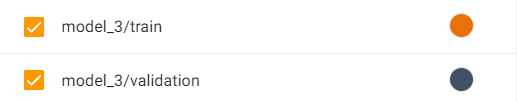

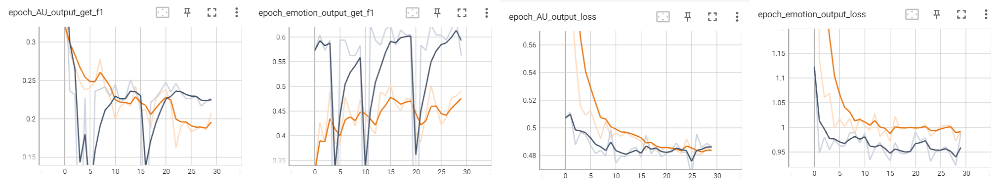

## Model Analysis
From the training above and the learning curves presented, most metrics are very unstable. It seems like one of the major issue right now is that the model barely learned about the FACS codes from the images. Thus, it is time to increase the complexity of the AU branch so that more layers could be dedicated to learning about the FACS codes. Other than that, the loss weights will be updated to put more focus on the FACS codes as well.

# Approach 4 : Transfer Learning [Increased Model Complexity]  
Changes from the previous results include:  
- FACS codes & HLE branch : Complexity Increased  
- Early Stopping Added

Early Stopping is added considering that the model complexity is now increased, which increases the chance of overfitting. Thus, if that occurs, the training should be stopped.

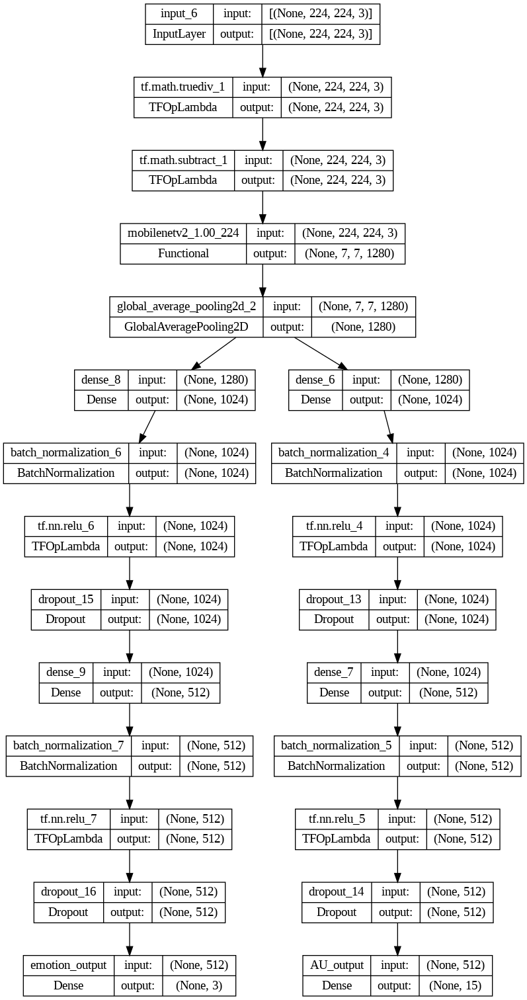

In [50]:
class MultiOutputModel_pretrained_complex(MultiOutputModel_pretrained):
  def build_AU_branch(self, inputs, num_AU=15):

      x = tf.keras.layers.Dense(1024)(inputs)
      x = tf.keras.layers.BatchNormalization()(x)
      x = tf.keras.activations.relu(x)
      x = tf.keras.layers.Dropout(0.25)(x)

      x = tf.keras.layers.Dense(512)(x)
      x = tf.keras.layers.BatchNormalization()(x)
      x = tf.keras.activations.relu(x)
      x = tf.keras.layers.Dropout(0.25)(x)

      x = tf.keras.layers.Dense(num_AU, activation='sigmoid', name="AU_output")(x)

      return x

  def build_emotion_branch(self, inputs, num_emotion=3):
    x = tf.keras.layers.Dense(1024)(inputs)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.activations.relu(x)
    x = tf.keras.layers.Dropout(0.25)(x)

    x = tf.keras.layers.Dense(512)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.activations.relu(x)
    x = tf.keras.layers.Dropout(0.25)(x)

    x = tf.keras.layers.Dense(num_emotion, activation='softmax', name="emotion_output")(x)

    return x

model_4 = MultiOutputModel_pretrained_complex((224,224,3)).assemble_full_model(224,224,num_AU=len(au_codes), num_emotion=3)
tf.keras.utils.plot_model(model_4, show_shapes=True)

In [83]:
name_m4 = 'models/model_4'
training = True

model_4.compile(optimizer=tf.keras.optimizers.Adam(lr_schedule),
                loss={'emotion_output': 'categorical_crossentropy',
                      'AU_output': 'binary_crossentropy'
                      },
                loss_weights={
                    'AU_output': 0.7,
                    'emotion_output': 0.3
                },

                metrics={'emotion_output': get_f1,
                         'AU_output': get_f1
                })

callbacks, train_model = verify_training(name_m4, training, early_stopping=True, patience_num=10)

if train_model:
  history_4 = model_4.fit(color_training_generator,
                              epochs=30,
                              callbacks=callbacks,
                              validation_data=color_validation_generator)

Epoch 1/30
6/6 [==============================] - ETA: 0s - loss: 0.8822 - emotion_output_loss: 1.3682 - AU_output_loss: 0.6739 - emotion_output_get_f1: 0.3295 - AU_output_get_f1: 0.2967
Epoch 1: val_loss improved from inf to 1.80706, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_4/


6/6 [==============================] - 92s 10s/step - loss: 0.8822 - emotion_output_loss: 1.3682 - AU_output_loss: 0.6739 - emotion_output_get_f1: 0.3295 - AU_output_get_f1: 0.2967 - val_loss: 1.8071 - val_emotion_output_loss: 4.5998 - val_AU_output_loss: 0.6102 - val_emotion_output_get_f1: 0.1667 - val_AU_output_get_f1: 0.2417
Epoch 2/30
6/6 [==============================] - ETA: 0s - loss: 0.7694 - emotion_output_loss: 1.2560 - AU_output_loss: 0.5609 - emotion_output_get_f1: 0.4988 - AU_output_get_f1: 0.2641
Epoch 2: val_loss improved from 1.80706 to 1.59185, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_4/


6/6 [==============================] - 57s 11s/step - loss: 0.7694 - emotion_output_loss: 1.2560 - AU_output_loss: 0.5609 - emotion_output_get_f1: 0.4988 - AU_output_get_f1: 0.2641 - val_loss: 1.5919 - val_emotion_output_loss: 3.7176 - val_AU_output_loss: 0.6808 - val_emotion_output_get_f1: 0.2292 - val_AU_output_get_f1: 0.2170
Epoch 3/30
6/6 [==============================] - ETA: 0s - loss: 0.7679 - emotion_output_loss: 1.3317 - AU_output_loss: 0.5262 - emotion_output_get_f1: 0.5011 - AU_output_get_f1: 0.2323
Epoch 3: val_loss did not improve from 1.59185
6/6 [==============================] - 19s 3s/step - loss: 0.7679 - emotion_output_loss: 1.3317 - AU_output_loss: 0.5262 - emotion_output_get_f1: 0.5011 - AU_output_get_f1: 0.2323 - val_loss: 2.2578 - val_emotion_output_loss: 5.9411 - val_AU_output_loss: 0.6792 - val_emotion_output_get_f1: 0.1771 - val_AU_output_get_f1: 0.2130
Epoch 4/30
6/6 [==============================] - ETA: 0s - loss: 0.7098 - emotion_output_loss: 1.1866 - AU

6/6 [==============================] - 43s 8s/step - loss: 0.6613 - emotion_output_loss: 1.0145 - AU_output_loss: 0.5099 - emotion_output_get_f1: 0.2889 - AU_output_get_f1: 0.1854 - val_loss: 1.2928 - val_emotion_output_loss: 2.2199 - val_AU_output_loss: 0.8955 - val_emotion_output_get_f1: 0.1979 - val_AU_output_get_f1: 0.3236
Epoch 8/30
6/6 [==============================] - ETA: 0s - loss: 0.6612 - emotion_output_loss: 1.0512 - AU_output_loss: 0.4941 - emotion_output_get_f1: 0.3415 - AU_output_get_f1: 0.1786
Epoch 8: val_loss improved from 1.29282 to 1.00026, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_4/


6/6 [==============================] - 49s 9s/step - loss: 0.6612 - emotion_output_loss: 1.0512 - AU_output_loss: 0.4941 - emotion_output_get_f1: 0.3415 - AU_output_get_f1: 0.1786 - val_loss: 1.0003 - val_emotion_output_loss: 1.0221 - val_AU_output_loss: 0.9909 - val_emotion_output_get_f1: 0.6250 - val_AU_output_get_f1: 0.2166
Epoch 9/30
6/6 [==============================] - ETA: 0s - loss: 0.6457 - emotion_output_loss: 1.0136 - AU_output_loss: 0.4880 - emotion_output_get_f1: 0.3992 - AU_output_get_f1: 0.1599
Epoch 9: val_loss did not improve from 1.00026
6/6 [==============================] - 19s 3s/step - loss: 0.6457 - emotion_output_loss: 1.0136 - AU_output_loss: 0.4880 - emotion_output_get_f1: 0.3992 - AU_output_get_f1: 0.1599 - val_loss: 1.1847 - val_emotion_output_loss: 1.5525 - val_AU_output_loss: 1.0271 - val_emotion_output_get_f1: 0.6042 - val_AU_output_get_f1: 0.2349
Epoch 10/30
6/6 [==============================] - ETA: 0s - loss: 0.6366 - emotion_output_loss: 0.9927 - AU

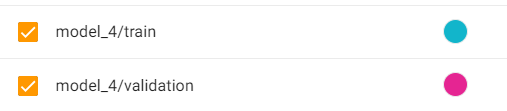

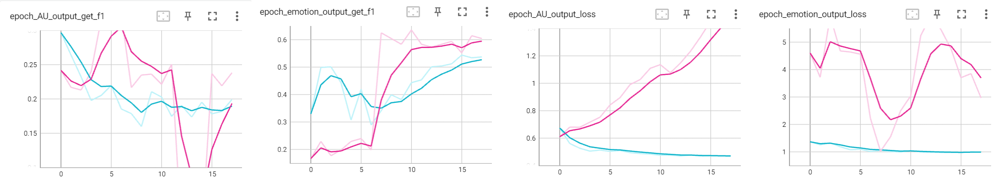

## Model Analysis
The training halted early by Early Stopping. It is noted that the performance is still not good, with 60% for HLE and 25% for FACS codes. It can be seen that for both target attributes, the training and validation loss as well as F1 Score are very unstable across the epochs which could be caused by several reasons:  
- High Learning Rate
- Low Batch Size

# Approach 5 : Transfer Learning [Decreased Complexity, Fine-Tuning]
With consideration from previous results, some of the pre-trained model's layers will be fine tuned, and the complexity of both branches will be decreased, and the dropout rate will be increased. It is said that when fine tuning pre-trained models, it is best to minimize the learning rate to prevent the model to forget about what it has learned. Thus, changes include:  
- Learning rate : 0.001 to 0.00001
- Loss weights : FACS - 0.7 to 0.8 | HLE - 0.3 to 0.2

Fine tuning at layer 100


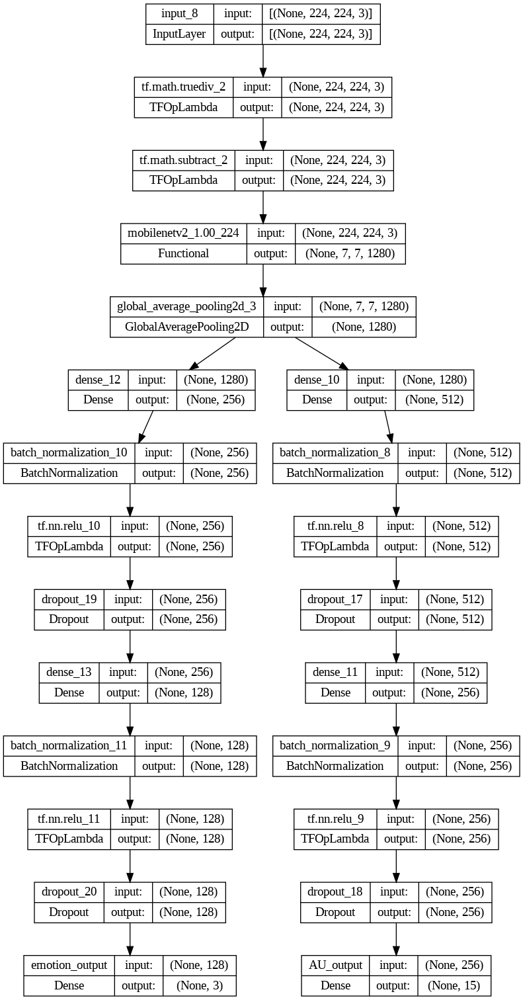

In [51]:
class MultiOutputModel_pretrained_finetune():

  def __init__(self, IMG_SHAPE):
    self.base_model = tf.keras.applications.MobileNetV2(input_shape=IMG_SHAPE,
                                               include_top=False,
                                               weights='imagenet'
                                               )

  def base_layers(self, inputs):
    x = tf.keras.applications.mobilenet_v2.preprocess_input(inputs)
    x = self.base_model(x, training=True)

    fine_tune_at = 100
    print("Fine tuning at layer", fine_tune_at)
    for layer in self.base_model.layers[:fine_tune_at]:
      layer.trainable =  False

    x = tf.keras.layers.GlobalAveragePooling2D()(x)

    return x

  def build_AU_branch(self, inputs, num_AU=15):
    x = tf.keras.layers.Dense(512)(inputs)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.activations.relu(x)
    x = tf.keras.layers.Dropout(0.5)(x)

    x = tf.keras.layers.Dense(256)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.activations.relu(x)
    x = tf.keras.layers.Dropout(0.8)(x)

    x = tf.keras.layers.Dense(num_AU, activation='sigmoid', name="AU_output")(x)

    return x

  def build_emotion_branch(self, inputs, num_emotion=3):
    x = tf.keras.layers.Dense(256)(inputs)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.activations.relu(x)
    x = tf.keras.layers.Dropout(0.5)(x)

    x = tf.keras.layers.Dense(128)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.activations.relu(x)
    x = tf.keras.layers.Dropout(0.8)(x)

    x = tf.keras.layers.Dense(num_emotion, activation='softmax', name="emotion_output")(x)

    return x

  def assemble_full_model(self, width, height, num_AU, num_emotion):
    input_shape = (height, width, 3)

    inputs = tf.keras.layers.Input(shape=input_shape)

    x = self.base_layers(inputs)
    AU_branch = self.build_AU_branch(x, num_AU)
    emotion_branch = self.build_emotion_branch(x, num_emotion)

    model = tf.keras.models.Model(inputs = inputs,
                                  outputs=[emotion_branch, AU_branch])
    return model

model_5 = MultiOutputModel_pretrained_finetune((224,224,3)).assemble_full_model(224,224,num_AU=len(au_codes), num_emotion=3)
tf.keras.utils.plot_model(model_5, show_shapes=True)

### Function: New Learning Rate Decay

In [52]:
BATCH_SIZE = 48

STEPS_PER_EPOCH = len(train.index)//BATCH_SIZE
lr_schedule = tf.keras.optimizers.schedules.InverseTimeDecay(
  0.00001,
  # Decay 1000 times per step
  decay_steps=STEPS_PER_EPOCH*1000,
  decay_rate=1,
  staircase=False)

In [55]:
name_m5 = 'models/model_5'
training = True

model_5.compile(optimizer=tf.keras.optimizers.Adam(lr_schedule),
                loss={'emotion_output': 'categorical_crossentropy',
                      'AU_output': 'binary_crossentropy'
                      },
                loss_weights={
                    'AU_output': 0.8,
                    'emotion_output': 0.2
                },

                metrics={'emotion_output': get_f1,
                         'AU_output': get_f1
                })

callbacks, train_model = verify_training(name_m5, training, early_stopping=True, patience_num=10)

if train_model:
  history_5 = model_5.fit(color_training_generator,
                              epochs=30,
                              callbacks=callbacks,
                              validation_data=color_validation_generator)

Epoch 1/30
6/6 [==============================] - ETA: 0s - loss: 1.3660 - emotion_output_loss: 2.2399 - AU_output_loss: 1.1475 - emotion_output_get_f1: 0.2608 - AU_output_get_f1: 0.2965
Epoch 1: val_loss improved from inf to 0.83301, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_5/


6/6 [==============================] - 72s 9s/step - loss: 1.3660 - emotion_output_loss: 2.2399 - AU_output_loss: 1.1475 - emotion_output_get_f1: 0.2608 - AU_output_get_f1: 0.2965 - val_loss: 0.8330 - val_emotion_output_loss: 1.2335 - val_AU_output_loss: 0.7329 - val_emotion_output_get_f1: 0.1875 - val_AU_output_get_f1: 0.2862
Epoch 2/30
6/6 [==============================] - ETA: 0s - loss: 1.3011 - emotion_output_loss: 2.1376 - AU_output_loss: 1.0920 - emotion_output_get_f1: 0.3008 - AU_output_get_f1: 0.2987
Epoch 2: val_loss improved from 0.83301 to 0.82549, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_5/


6/6 [==============================] - 42s 8s/step - loss: 1.3011 - emotion_output_loss: 2.1376 - AU_output_loss: 1.0920 - emotion_output_get_f1: 0.3008 - AU_output_get_f1: 0.2987 - val_loss: 0.8255 - val_emotion_output_loss: 1.1997 - val_AU_output_loss: 0.7319 - val_emotion_output_get_f1: 0.1714 - val_AU_output_get_f1: 0.2830
Epoch 3/30
6/6 [==============================] - ETA: 0s - loss: 1.2643 - emotion_output_loss: 1.9938 - AU_output_loss: 1.0819 - emotion_output_get_f1: 0.3236 - AU_output_get_f1: 0.3094
Epoch 3: val_loss improved from 0.82549 to 0.81225, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_5/


6/6 [==============================] - 43s 8s/step - loss: 1.2643 - emotion_output_loss: 1.9938 - AU_output_loss: 1.0819 - emotion_output_get_f1: 0.3236 - AU_output_get_f1: 0.3094 - val_loss: 0.8123 - val_emotion_output_loss: 1.1815 - val_AU_output_loss: 0.7199 - val_emotion_output_get_f1: 0.2177 - val_AU_output_get_f1: 0.3010
Epoch 4/30
6/6 [==============================] - ETA: 0s - loss: 1.3273 - emotion_output_loss: 2.2220 - AU_output_loss: 1.1036 - emotion_output_get_f1: 0.2556 - AU_output_get_f1: 0.2927
Epoch 4: val_loss did not improve from 0.81225
6/6 [==============================] - 17s 3s/step - loss: 1.3273 - emotion_output_loss: 2.2220 - AU_output_loss: 1.1036 - emotion_output_get_f1: 0.2556 - AU_output_get_f1: 0.2927 - val_loss: 0.8128 - val_emotion_output_loss: 1.1811 - val_AU_output_loss: 0.7207 - val_emotion_output_get_f1: 0.1226 - val_AU_output_get_f1: 0.3116
Epoch 5/30
6/6 [==============================] - ETA: 0s - loss: 1.3271 - emotion_output_loss: 2.2611 - AU_

6/6 [==============================] - 43s 8s/step - loss: 1.2742 - emotion_output_loss: 2.0730 - AU_output_loss: 1.0746 - emotion_output_get_f1: 0.2952 - AU_output_get_f1: 0.3079 - val_loss: 0.8108 - val_emotion_output_loss: 1.1793 - val_AU_output_loss: 0.7186 - val_emotion_output_get_f1: 0.0974 - val_AU_output_get_f1: 0.2934
Epoch 8/30
6/6 [==============================] - ETA: 0s - loss: 1.3150 - emotion_output_loss: 2.2432 - AU_output_loss: 1.0830 - emotion_output_get_f1: 0.2886 - AU_output_get_f1: 0.2915
Epoch 8: val_loss improved from 0.81078 to 0.80392, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_5/


6/6 [==============================] - 43s 8s/step - loss: 1.3150 - emotion_output_loss: 2.2432 - AU_output_loss: 1.0830 - emotion_output_get_f1: 0.2886 - AU_output_get_f1: 0.2915 - val_loss: 0.8039 - val_emotion_output_loss: 1.1365 - val_AU_output_loss: 0.7208 - val_emotion_output_get_f1: 0.0968 - val_AU_output_get_f1: 0.2801
Epoch 9/30
6/6 [==============================] - ETA: 0s - loss: 1.3356 - emotion_output_loss: 2.2147 - AU_output_loss: 1.1158 - emotion_output_get_f1: 0.3316 - AU_output_get_f1: 0.2814
Epoch 9: val_loss improved from 0.80392 to 0.80355, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_5/


6/6 [==============================] - 44s 8s/step - loss: 1.3356 - emotion_output_loss: 2.2147 - AU_output_loss: 1.1158 - emotion_output_get_f1: 0.3316 - AU_output_get_f1: 0.2814 - val_loss: 0.8036 - val_emotion_output_loss: 1.1502 - val_AU_output_loss: 0.7169 - val_emotion_output_get_f1: 0.0978 - val_AU_output_get_f1: 0.3134
Epoch 10/30
6/6 [==============================] - ETA: 0s - loss: 1.3060 - emotion_output_loss: 2.1682 - AU_output_loss: 1.0904 - emotion_output_get_f1: 0.3237 - AU_output_get_f1: 0.2992
Epoch 10: val_loss improved from 0.80355 to 0.80205, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_5/


6/6 [==============================] - 45s 8s/step - loss: 1.3060 - emotion_output_loss: 2.1682 - AU_output_loss: 1.0904 - emotion_output_get_f1: 0.3237 - AU_output_get_f1: 0.2992 - val_loss: 0.8020 - val_emotion_output_loss: 1.1360 - val_AU_output_loss: 0.7186 - val_emotion_output_get_f1: 0.1910 - val_AU_output_get_f1: 0.3177
Epoch 11/30
6/6 [==============================] - ETA: 0s - loss: 1.2915 - emotion_output_loss: 2.0815 - AU_output_loss: 1.0940 - emotion_output_get_f1: 0.3415 - AU_output_get_f1: 0.2939
Epoch 11: val_loss improved from 0.80205 to 0.79552, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_5/


6/6 [==============================] - 44s 8s/step - loss: 1.2915 - emotion_output_loss: 2.0815 - AU_output_loss: 1.0940 - emotion_output_get_f1: 0.3415 - AU_output_get_f1: 0.2939 - val_loss: 0.7955 - val_emotion_output_loss: 1.1217 - val_AU_output_loss: 0.7140 - val_emotion_output_get_f1: 0.1035 - val_AU_output_get_f1: 0.2843
Epoch 12/30
6/6 [==============================] - ETA: 0s - loss: 1.2925 - emotion_output_loss: 2.0782 - AU_output_loss: 1.0960 - emotion_output_get_f1: 0.3128 - AU_output_get_f1: 0.2805
Epoch 12: val_loss did not improve from 0.79552
6/6 [==============================] - 18s 3s/step - loss: 1.2925 - emotion_output_loss: 2.0782 - AU_output_loss: 1.0960 - emotion_output_get_f1: 0.3128 - AU_output_get_f1: 0.2805 - val_loss: 0.8001 - val_emotion_output_loss: 1.1613 - val_AU_output_loss: 0.7098 - val_emotion_output_get_f1: 0.1116 - val_AU_output_get_f1: 0.3050
Epoch 13/30
6/6 [==============================] - ETA: 0s - loss: 1.2688 - emotion_output_loss: 1.9367 - 

6/6 [==============================] - 43s 8s/step - loss: 1.3041 - emotion_output_loss: 2.1214 - AU_output_loss: 1.0998 - emotion_output_get_f1: 0.3059 - AU_output_get_f1: 0.2932 - val_loss: 0.7947 - val_emotion_output_loss: 1.1367 - val_AU_output_loss: 0.7092 - val_emotion_output_get_f1: 0.1500 - val_AU_output_get_f1: 0.3070
Epoch 18/30
6/6 [==============================] - ETA: 0s - loss: 1.2785 - emotion_output_loss: 2.1189 - AU_output_loss: 1.0684 - emotion_output_get_f1: 0.3132 - AU_output_get_f1: 0.2978
Epoch 18: val_loss improved from 0.79467 to 0.79062, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_5/


6/6 [==============================] - 45s 9s/step - loss: 1.2785 - emotion_output_loss: 2.1189 - AU_output_loss: 1.0684 - emotion_output_get_f1: 0.3132 - AU_output_get_f1: 0.2978 - val_loss: 0.7906 - val_emotion_output_loss: 1.1157 - val_AU_output_loss: 0.7094 - val_emotion_output_get_f1: 0.1492 - val_AU_output_get_f1: 0.3122
Epoch 19/30
6/6 [==============================] - ETA: 0s - loss: 1.2749 - emotion_output_loss: 2.1108 - AU_output_loss: 1.0659 - emotion_output_get_f1: 0.2918 - AU_output_get_f1: 0.2880
Epoch 19: val_loss improved from 0.79062 to 0.78820, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_5/


6/6 [==============================] - 44s 8s/step - loss: 1.2749 - emotion_output_loss: 2.1108 - AU_output_loss: 1.0659 - emotion_output_get_f1: 0.2918 - AU_output_get_f1: 0.2880 - val_loss: 0.7882 - val_emotion_output_loss: 1.1206 - val_AU_output_loss: 0.7051 - val_emotion_output_get_f1: 0.1838 - val_AU_output_get_f1: 0.3050
Epoch 20/30
6/6 [==============================] - ETA: 0s - loss: 1.2466 - emotion_output_loss: 1.8753 - AU_output_loss: 1.0894 - emotion_output_get_f1: 0.3668 - AU_output_get_f1: 0.2898
Epoch 20: val_loss did not improve from 0.78820
6/6 [==============================] - 19s 3s/step - loss: 1.2466 - emotion_output_loss: 1.8753 - AU_output_loss: 1.0894 - emotion_output_get_f1: 0.3668 - AU_output_get_f1: 0.2898 - val_loss: 0.7884 - val_emotion_output_loss: 1.1412 - val_AU_output_loss: 0.7002 - val_emotion_output_get_f1: 0.1621 - val_AU_output_get_f1: 0.3136
Epoch 21/30
6/6 [==============================] - ETA: 0s - loss: 1.2772 - emotion_output_loss: 2.0477 - 

6/6 [==============================] - 45s 8s/step - loss: 1.2772 - emotion_output_loss: 2.0477 - AU_output_loss: 1.0846 - emotion_output_get_f1: 0.3220 - AU_output_get_f1: 0.2869 - val_loss: 0.7819 - val_emotion_output_loss: 1.1017 - val_AU_output_loss: 0.7019 - val_emotion_output_get_f1: 0.2320 - val_AU_output_get_f1: 0.3131
Epoch 22/30
6/6 [==============================] - ETA: 0s - loss: 1.2825 - emotion_output_loss: 2.1064 - AU_output_loss: 1.0766 - emotion_output_get_f1: 0.2983 - AU_output_get_f1: 0.2884
Epoch 22: val_loss improved from 0.78187 to 0.76986, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_5/


6/6 [==============================] - 44s 8s/step - loss: 1.2825 - emotion_output_loss: 2.1064 - AU_output_loss: 1.0766 - emotion_output_get_f1: 0.2983 - AU_output_get_f1: 0.2884 - val_loss: 0.7699 - val_emotion_output_loss: 1.0416 - val_AU_output_loss: 0.7019 - val_emotion_output_get_f1: 0.3086 - val_AU_output_get_f1: 0.3239
Epoch 23/30
6/6 [==============================] - ETA: 0s - loss: 1.2394 - emotion_output_loss: 1.9813 - AU_output_loss: 1.0539 - emotion_output_get_f1: 0.3538 - AU_output_get_f1: 0.2989
Epoch 23: val_loss did not improve from 0.76986
6/6 [==============================] - 26s 5s/step - loss: 1.2394 - emotion_output_loss: 1.9813 - AU_output_loss: 1.0539 - emotion_output_get_f1: 0.3538 - AU_output_get_f1: 0.2989 - val_loss: 0.7809 - val_emotion_output_loss: 1.0920 - val_AU_output_loss: 0.7031 - val_emotion_output_get_f1: 0.1044 - val_AU_output_get_f1: 0.3135
Epoch 24/30
6/6 [==============================] - ETA: 0s - loss: 1.2620 - emotion_output_loss: 2.0569 - 

6/6 [==============================] - 49s 9s/step - loss: 1.2620 - emotion_output_loss: 2.0569 - AU_output_loss: 1.0633 - emotion_output_get_f1: 0.3288 - AU_output_get_f1: 0.2926 - val_loss: 0.7649 - val_emotion_output_loss: 1.0642 - val_AU_output_loss: 0.6901 - val_emotion_output_get_f1: 0.1555 - val_AU_output_get_f1: 0.3299
Epoch 25/30
6/6 [==============================] - ETA: 0s - loss: 1.2592 - emotion_output_loss: 2.0323 - AU_output_loss: 1.0660 - emotion_output_get_f1: 0.3178 - AU_output_get_f1: 0.2860
Epoch 25: val_loss did not improve from 0.76489
6/6 [==============================] - 19s 3s/step - loss: 1.2592 - emotion_output_loss: 2.0323 - AU_output_loss: 1.0660 - emotion_output_get_f1: 0.3178 - AU_output_get_f1: 0.2860 - val_loss: 0.7825 - val_emotion_output_loss: 1.1032 - val_AU_output_loss: 0.7023 - val_emotion_output_get_f1: 0.2314 - val_AU_output_get_f1: 0.3265
Epoch 26/30
6/6 [==============================] - ETA: 0s - loss: 1.2925 - emotion_output_loss: 2.1601 - 

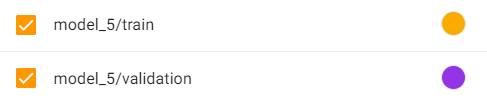

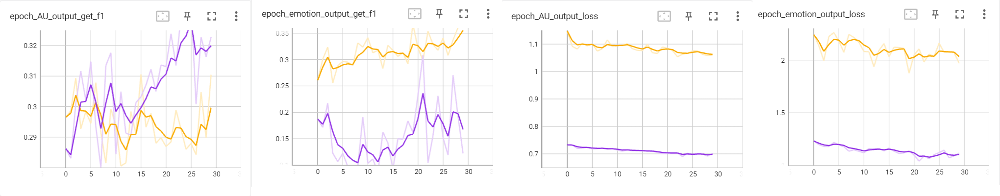

## Model Analysis
From the learning curve, it can be seen that for FACS codes, the validation F1 Score is increasing and higher than training F1 Score, but the validation F1 Score for HLE is lower than training, which could indicate overfitting in this branch.

For both target attributes, the validation and training loss is decreasing very very minimally and the validation loss seems to always be lower than the training loss. This is the first occurence of such phenomenon and is very unusual. This could be caused by the learning rate being too low, causing no changes in the loss.

# Approach 6 : Transfer Learning [Increased Learning Rate]
Changs from previous results include:  
- Learning rate - 0.00001 to 0.0001
- HLE Branch complexity decreased

In [53]:
BATCH_SIZE = 48

STEPS_PER_EPOCH = len(train.index)//BATCH_SIZE
lr_schedule = tf.keras.optimizers.schedules.InverseTimeDecay(
  0.0001,
  # Decay 1000 times per step
  decay_steps=STEPS_PER_EPOCH*1000,
  decay_rate=1,
  staircase=False)

Fine tuning at layer 100


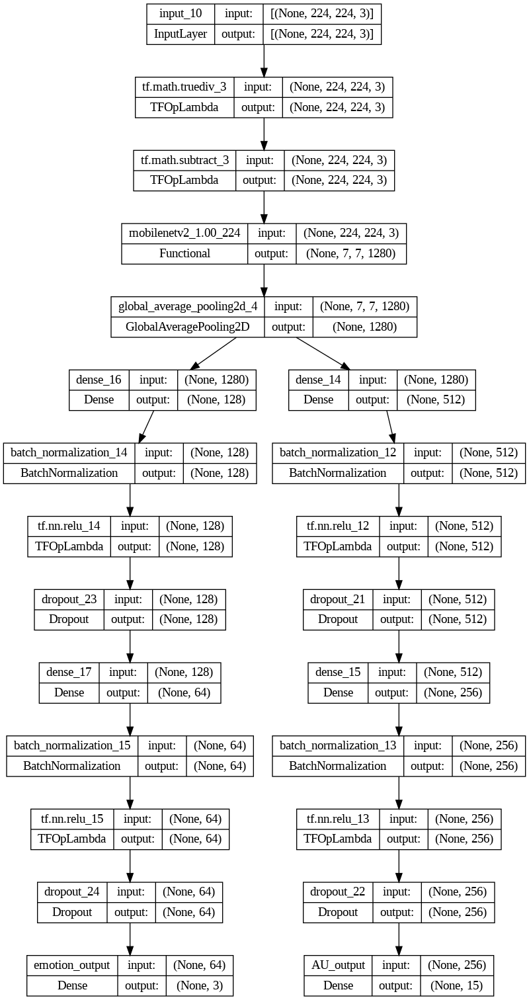

In [54]:
class MultiOutputModel_pretrained_finetune1(MultiOutputModel_pretrained_finetune):
  def build_emotion_branch(self, inputs, num_emotion=3):
    x = tf.keras.layers.Dense(128)(inputs)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.activations.relu(x)
    x = tf.keras.layers.Dropout(0.5)(x)

    x = tf.keras.layers.Dense(64)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.activations.relu(x)
    x = tf.keras.layers.Dropout(0.8)(x)

    x = tf.keras.layers.Dense(num_emotion, activation='softmax', name="emotion_output")(x)

    return x

model_6 = MultiOutputModel_pretrained_finetune1((224,224,3)).assemble_full_model(224,224,num_AU=len(au_codes), num_emotion=3)
tf.keras.utils.plot_model(model_6, show_shapes=True)

In [58]:
name_m6 = 'models/model_6'
training = True

model_6.compile(optimizer=tf.keras.optimizers.Adam(lr_schedule),
                loss={'emotion_output': 'categorical_crossentropy',
                      'AU_output': 'binary_crossentropy'
                      },
                loss_weights={
                    'AU_output': 0.8,
                    'emotion_output': 0.2
                },

                metrics={'emotion_output': get_f1,
                         'AU_output': get_f1
                })

callbacks, train_model = verify_training(name_m6, training, early_stopping=True, patience_num=10)

if train_model:
  history_6 = model_6.fit(color_training_generator,
                              epochs=30,
                              callbacks=callbacks,
                              validation_data=color_validation_generator)

Epoch 1/30
6/6 [==============================] - ETA: 0s - loss: 1.2200 - emotion_output_loss: 1.7685 - AU_output_loss: 1.0829 - emotion_output_get_f1: 0.3624 - AU_output_get_f1: 0.2871
Epoch 1: val_loss improved from inf to 0.78218, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_6/


6/6 [==============================] - 69s 9s/step - loss: 1.2200 - emotion_output_loss: 1.7685 - AU_output_loss: 1.0829 - emotion_output_get_f1: 0.3624 - AU_output_get_f1: 0.2871 - val_loss: 0.7822 - val_emotion_output_loss: 1.0426 - val_AU_output_loss: 0.7171 - val_emotion_output_get_f1: 0.2558 - val_AU_output_get_f1: 0.3041
Epoch 2/30
6/6 [==============================] - ETA: 0s - loss: 1.2659 - emotion_output_loss: 1.8474 - AU_output_loss: 1.1205 - emotion_output_get_f1: 0.3419 - AU_output_get_f1: 0.2840
Epoch 2: val_loss improved from 0.78218 to 0.77067, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_6/


6/6 [==============================] - 47s 9s/step - loss: 1.2659 - emotion_output_loss: 1.8474 - AU_output_loss: 1.1205 - emotion_output_get_f1: 0.3419 - AU_output_get_f1: 0.2840 - val_loss: 0.7707 - val_emotion_output_loss: 1.0332 - val_AU_output_loss: 0.7050 - val_emotion_output_get_f1: 0.3170 - val_AU_output_get_f1: 0.3078
Epoch 3/30
6/6 [==============================] - ETA: 0s - loss: 1.2355 - emotion_output_loss: 1.8633 - AU_output_loss: 1.0786 - emotion_output_get_f1: 0.3331 - AU_output_get_f1: 0.2839
Epoch 3: val_loss improved from 0.77067 to 0.75323, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_6/


6/6 [==============================] - 44s 8s/step - loss: 1.2355 - emotion_output_loss: 1.8633 - AU_output_loss: 1.0786 - emotion_output_get_f1: 0.3331 - AU_output_get_f1: 0.2839 - val_loss: 0.7532 - val_emotion_output_loss: 0.9857 - val_AU_output_loss: 0.6951 - val_emotion_output_get_f1: 0.3476 - val_AU_output_get_f1: 0.3145
Epoch 4/30
6/6 [==============================] - ETA: 0s - loss: 1.1783 - emotion_output_loss: 1.6190 - AU_output_loss: 1.0681 - emotion_output_get_f1: 0.3881 - AU_output_get_f1: 0.2912
Epoch 4: val_loss improved from 0.75323 to 0.74397, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_6/


6/6 [==============================] - 44s 8s/step - loss: 1.1783 - emotion_output_loss: 1.6190 - AU_output_loss: 1.0681 - emotion_output_get_f1: 0.3881 - AU_output_get_f1: 0.2912 - val_loss: 0.7440 - val_emotion_output_loss: 0.9761 - val_AU_output_loss: 0.6859 - val_emotion_output_get_f1: 0.2939 - val_AU_output_get_f1: 0.3208
Epoch 5/30
6/6 [==============================] - ETA: 0s - loss: 1.2039 - emotion_output_loss: 1.9346 - AU_output_loss: 1.0212 - emotion_output_get_f1: 0.3667 - AU_output_get_f1: 0.2834
Epoch 5: val_loss improved from 0.74397 to 0.73701, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_6/


6/6 [==============================] - 43s 8s/step - loss: 1.2039 - emotion_output_loss: 1.9346 - AU_output_loss: 1.0212 - emotion_output_get_f1: 0.3667 - AU_output_get_f1: 0.2834 - val_loss: 0.7370 - val_emotion_output_loss: 0.9597 - val_AU_output_loss: 0.6813 - val_emotion_output_get_f1: 0.3252 - val_AU_output_get_f1: 0.3009
Epoch 6/30
6/6 [==============================] - ETA: 0s - loss: 1.1610 - emotion_output_loss: 1.8267 - AU_output_loss: 0.9945 - emotion_output_get_f1: 0.3731 - AU_output_get_f1: 0.3152
Epoch 6: val_loss improved from 0.73701 to 0.72247, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_6/


6/6 [==============================] - 50s 10s/step - loss: 1.1610 - emotion_output_loss: 1.8267 - AU_output_loss: 0.9945 - emotion_output_get_f1: 0.3731 - AU_output_get_f1: 0.3152 - val_loss: 0.7225 - val_emotion_output_loss: 0.9156 - val_AU_output_loss: 0.6742 - val_emotion_output_get_f1: 0.3751 - val_AU_output_get_f1: 0.3122
Epoch 7/30
6/6 [==============================] - ETA: 0s - loss: 1.1236 - emotion_output_loss: 1.6894 - AU_output_loss: 0.9822 - emotion_output_get_f1: 0.3903 - AU_output_get_f1: 0.3065
Epoch 7: val_loss improved from 0.72247 to 0.70867, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_6/


6/6 [==============================] - 44s 8s/step - loss: 1.1236 - emotion_output_loss: 1.6894 - AU_output_loss: 0.9822 - emotion_output_get_f1: 0.3903 - AU_output_get_f1: 0.3065 - val_loss: 0.7087 - val_emotion_output_loss: 0.9234 - val_AU_output_loss: 0.6550 - val_emotion_output_get_f1: 0.3429 - val_AU_output_get_f1: 0.3448
Epoch 8/30
6/6 [==============================] - ETA: 0s - loss: 1.0654 - emotion_output_loss: 1.4314 - AU_output_loss: 0.9739 - emotion_output_get_f1: 0.4614 - AU_output_get_f1: 0.3093
Epoch 8: val_loss improved from 0.70867 to 0.68365, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_6/


6/6 [==============================] - 43s 8s/step - loss: 1.0654 - emotion_output_loss: 1.4314 - AU_output_loss: 0.9739 - emotion_output_get_f1: 0.4614 - AU_output_get_f1: 0.3093 - val_loss: 0.6837 - val_emotion_output_loss: 0.8231 - val_AU_output_loss: 0.6488 - val_emotion_output_get_f1: 0.4627 - val_AU_output_get_f1: 0.3728
Epoch 9/30
6/6 [==============================] - ETA: 0s - loss: 1.0112 - emotion_output_loss: 1.3407 - AU_output_loss: 0.9289 - emotion_output_get_f1: 0.4999 - AU_output_get_f1: 0.3093
Epoch 9: val_loss did not improve from 0.68365
6/6 [==============================] - 18s 3s/step - loss: 1.0112 - emotion_output_loss: 1.3407 - AU_output_loss: 0.9289 - emotion_output_get_f1: 0.4999 - AU_output_get_f1: 0.3093 - val_loss: 0.6877 - val_emotion_output_loss: 0.8752 - val_AU_output_loss: 0.6408 - val_emotion_output_get_f1: 0.4082 - val_AU_output_get_f1: 0.3627
Epoch 10/30
6/6 [==============================] - ETA: 0s - loss: 1.0292 - emotion_output_loss: 1.4293 - AU

6/6 [==============================] - 43s 8s/step - loss: 1.0292 - emotion_output_loss: 1.4293 - AU_output_loss: 0.9291 - emotion_output_get_f1: 0.4480 - AU_output_get_f1: 0.3081 - val_loss: 0.6705 - val_emotion_output_loss: 0.8150 - val_AU_output_loss: 0.6343 - val_emotion_output_get_f1: 0.5611 - val_AU_output_get_f1: 0.3607
Epoch 11/30
6/6 [==============================] - ETA: 0s - loss: 1.0692 - emotion_output_loss: 1.6039 - AU_output_loss: 0.9355 - emotion_output_get_f1: 0.4095 - AU_output_get_f1: 0.3287
Epoch 11: val_loss improved from 0.67048 to 0.66264, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_6/


6/6 [==============================] - 43s 8s/step - loss: 1.0692 - emotion_output_loss: 1.6039 - AU_output_loss: 0.9355 - emotion_output_get_f1: 0.4095 - AU_output_get_f1: 0.3287 - val_loss: 0.6626 - val_emotion_output_loss: 0.8113 - val_AU_output_loss: 0.6255 - val_emotion_output_get_f1: 0.6018 - val_AU_output_get_f1: 0.4067
Epoch 12/30
6/6 [==============================] - ETA: 0s - loss: 1.0107 - emotion_output_loss: 1.4869 - AU_output_loss: 0.8917 - emotion_output_get_f1: 0.4248 - AU_output_get_f1: 0.3215
Epoch 12: val_loss improved from 0.66264 to 0.65065, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_6/


6/6 [==============================] - 45s 9s/step - loss: 1.0107 - emotion_output_loss: 1.4869 - AU_output_loss: 0.8917 - emotion_output_get_f1: 0.4248 - AU_output_get_f1: 0.3215 - val_loss: 0.6506 - val_emotion_output_loss: 0.7968 - val_AU_output_loss: 0.6141 - val_emotion_output_get_f1: 0.5917 - val_AU_output_get_f1: 0.4253
Epoch 13/30
6/6 [==============================] - ETA: 0s - loss: 1.0361 - emotion_output_loss: 1.4560 - AU_output_loss: 0.9311 - emotion_output_get_f1: 0.4676 - AU_output_get_f1: 0.2967
Epoch 13: val_loss improved from 0.65065 to 0.62662, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_6/


6/6 [==============================] - 43s 8s/step - loss: 1.0361 - emotion_output_loss: 1.4560 - AU_output_loss: 0.9311 - emotion_output_get_f1: 0.4676 - AU_output_get_f1: 0.2967 - val_loss: 0.6266 - val_emotion_output_loss: 0.6917 - val_AU_output_loss: 0.6103 - val_emotion_output_get_f1: 0.6533 - val_AU_output_get_f1: 0.3986
Epoch 14/30
6/6 [==============================] - ETA: 0s - loss: 0.9389 - emotion_output_loss: 1.1862 - AU_output_loss: 0.8771 - emotion_output_get_f1: 0.5159 - AU_output_get_f1: 0.3439
Epoch 14: val_loss improved from 0.62662 to 0.62430, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_6/


6/6 [==============================] - 44s 8s/step - loss: 0.9389 - emotion_output_loss: 1.1862 - AU_output_loss: 0.8771 - emotion_output_get_f1: 0.5159 - AU_output_get_f1: 0.3439 - val_loss: 0.6243 - val_emotion_output_loss: 0.7140 - val_AU_output_loss: 0.6019 - val_emotion_output_get_f1: 0.6360 - val_AU_output_get_f1: 0.4032
Epoch 15/30
6/6 [==============================] - ETA: 0s - loss: 0.9460 - emotion_output_loss: 1.3043 - AU_output_loss: 0.8564 - emotion_output_get_f1: 0.4740 - AU_output_get_f1: 0.3530
Epoch 15: val_loss improved from 0.62430 to 0.61507, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_6/


6/6 [==============================] - 44s 8s/step - loss: 0.9460 - emotion_output_loss: 1.3043 - AU_output_loss: 0.8564 - emotion_output_get_f1: 0.4740 - AU_output_get_f1: 0.3530 - val_loss: 0.6151 - val_emotion_output_loss: 0.7140 - val_AU_output_loss: 0.5903 - val_emotion_output_get_f1: 0.6567 - val_AU_output_get_f1: 0.4577
Epoch 16/30
6/6 [==============================] - ETA: 0s - loss: 0.9098 - emotion_output_loss: 1.2288 - AU_output_loss: 0.8300 - emotion_output_get_f1: 0.5315 - AU_output_get_f1: 0.3331
Epoch 16: val_loss improved from 0.61507 to 0.59799, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_6/


6/6 [==============================] - 43s 8s/step - loss: 0.9098 - emotion_output_loss: 1.2288 - AU_output_loss: 0.8300 - emotion_output_get_f1: 0.5315 - AU_output_get_f1: 0.3331 - val_loss: 0.5980 - val_emotion_output_loss: 0.6712 - val_AU_output_loss: 0.5797 - val_emotion_output_get_f1: 0.6921 - val_AU_output_get_f1: 0.4412
Epoch 17/30
6/6 [==============================] - ETA: 0s - loss: 0.9104 - emotion_output_loss: 1.2599 - AU_output_loss: 0.8230 - emotion_output_get_f1: 0.5004 - AU_output_get_f1: 0.3513
Epoch 17: val_loss improved from 0.59799 to 0.59619, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_6/


6/6 [==============================] - 45s 9s/step - loss: 0.9104 - emotion_output_loss: 1.2599 - AU_output_loss: 0.8230 - emotion_output_get_f1: 0.5004 - AU_output_get_f1: 0.3513 - val_loss: 0.5962 - val_emotion_output_loss: 0.7021 - val_AU_output_loss: 0.5697 - val_emotion_output_get_f1: 0.6869 - val_AU_output_get_f1: 0.4522
Epoch 18/30
6/6 [==============================] - ETA: 0s - loss: 0.9050 - emotion_output_loss: 1.2226 - AU_output_loss: 0.8256 - emotion_output_get_f1: 0.5032 - AU_output_get_f1: 0.3401
Epoch 18: val_loss did not improve from 0.59619
6/6 [==============================] - 17s 3s/step - loss: 0.9050 - emotion_output_loss: 1.2226 - AU_output_loss: 0.8256 - emotion_output_get_f1: 0.5032 - AU_output_get_f1: 0.3401 - val_loss: 0.6031 - val_emotion_output_loss: 0.7300 - val_AU_output_loss: 0.5714 - val_emotion_output_get_f1: 0.6278 - val_AU_output_get_f1: 0.4444
Epoch 19/30
6/6 [==============================] - ETA: 0s - loss: 0.8748 - emotion_output_loss: 1.2939 - 

6/6 [==============================] - 43s 8s/step - loss: 0.8748 - emotion_output_loss: 1.2939 - AU_output_loss: 0.7700 - emotion_output_get_f1: 0.4668 - AU_output_get_f1: 0.3660 - val_loss: 0.5564 - val_emotion_output_loss: 0.6384 - val_AU_output_loss: 0.5359 - val_emotion_output_get_f1: 0.7787 - val_AU_output_get_f1: 0.5117
Epoch 20/30
6/6 [==============================] - ETA: 0s - loss: 0.8247 - emotion_output_loss: 1.1358 - AU_output_loss: 0.7469 - emotion_output_get_f1: 0.5181 - AU_output_get_f1: 0.3720
Epoch 20: val_loss improved from 0.55638 to 0.55369, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_6/


6/6 [==============================] - 44s 8s/step - loss: 0.8247 - emotion_output_loss: 1.1358 - AU_output_loss: 0.7469 - emotion_output_get_f1: 0.5181 - AU_output_get_f1: 0.3720 - val_loss: 0.5537 - val_emotion_output_loss: 0.6298 - val_AU_output_loss: 0.5347 - val_emotion_output_get_f1: 0.7356 - val_AU_output_get_f1: 0.4929
Epoch 21/30
6/6 [==============================] - ETA: 0s - loss: 0.7982 - emotion_output_loss: 1.0666 - AU_output_loss: 0.7311 - emotion_output_get_f1: 0.5861 - AU_output_get_f1: 0.3810
Epoch 21: val_loss improved from 0.55369 to 0.54906, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_6/


6/6 [==============================] - 43s 8s/step - loss: 0.7982 - emotion_output_loss: 1.0666 - AU_output_loss: 0.7311 - emotion_output_get_f1: 0.5861 - AU_output_get_f1: 0.3810 - val_loss: 0.5491 - val_emotion_output_loss: 0.6412 - val_AU_output_loss: 0.5260 - val_emotion_output_get_f1: 0.7549 - val_AU_output_get_f1: 0.4979
Epoch 22/30
6/6 [==============================] - ETA: 0s - loss: 0.8236 - emotion_output_loss: 1.0570 - AU_output_loss: 0.7652 - emotion_output_get_f1: 0.5245 - AU_output_get_f1: 0.3593
Epoch 22: val_loss did not improve from 0.54906
6/6 [==============================] - 17s 3s/step - loss: 0.8236 - emotion_output_loss: 1.0570 - AU_output_loss: 0.7652 - emotion_output_get_f1: 0.5245 - AU_output_get_f1: 0.3593 - val_loss: 0.5558 - val_emotion_output_loss: 0.6178 - val_AU_output_loss: 0.5403 - val_emotion_output_get_f1: 0.7794 - val_AU_output_get_f1: 0.5073
Epoch 23/30
6/6 [==============================] - ETA: 0s - loss: 0.7979 - emotion_output_loss: 1.0615 - 

6/6 [==============================] - 44s 8s/step - loss: 0.7979 - emotion_output_loss: 1.0615 - AU_output_loss: 0.7320 - emotion_output_get_f1: 0.5615 - AU_output_get_f1: 0.3945 - val_loss: 0.5119 - val_emotion_output_loss: 0.5487 - val_AU_output_loss: 0.5027 - val_emotion_output_get_f1: 0.7816 - val_AU_output_get_f1: 0.5642
Epoch 24/30
6/6 [==============================] - ETA: 0s - loss: 0.7435 - emotion_output_loss: 0.8791 - AU_output_loss: 0.7095 - emotion_output_get_f1: 0.5920 - AU_output_get_f1: 0.3855
Epoch 24: val_loss did not improve from 0.51191
6/6 [==============================] - 17s 3s/step - loss: 0.7435 - emotion_output_loss: 0.8791 - AU_output_loss: 0.7095 - emotion_output_get_f1: 0.5920 - AU_output_get_f1: 0.3855 - val_loss: 0.5365 - val_emotion_output_loss: 0.5994 - val_AU_output_loss: 0.5207 - val_emotion_output_get_f1: 0.7721 - val_AU_output_get_f1: 0.5274
Epoch 25/30
6/6 [==============================] - ETA: 0s - loss: 0.7303 - emotion_output_loss: 0.9239 - 

6/6 [==============================] - 43s 8s/step - loss: 0.7303 - emotion_output_loss: 0.9239 - AU_output_loss: 0.6819 - emotion_output_get_f1: 0.5856 - AU_output_get_f1: 0.4142 - val_loss: 0.5089 - val_emotion_output_loss: 0.5342 - val_AU_output_loss: 0.5025 - val_emotion_output_get_f1: 0.7840 - val_AU_output_get_f1: 0.6011
Epoch 26/30
6/6 [==============================] - ETA: 0s - loss: 0.6972 - emotion_output_loss: 0.8771 - AU_output_loss: 0.6522 - emotion_output_get_f1: 0.6342 - AU_output_get_f1: 0.4326
Epoch 26: val_loss improved from 0.50887 to 0.49209, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_6/


6/6 [==============================] - 42s 8s/step - loss: 0.6972 - emotion_output_loss: 0.8771 - AU_output_loss: 0.6522 - emotion_output_get_f1: 0.6342 - AU_output_get_f1: 0.4326 - val_loss: 0.4921 - val_emotion_output_loss: 0.4777 - val_AU_output_loss: 0.4957 - val_emotion_output_get_f1: 0.8172 - val_AU_output_get_f1: 0.5837
Epoch 27/30
6/6 [==============================] - ETA: 0s - loss: 0.7132 - emotion_output_loss: 0.8789 - AU_output_loss: 0.6718 - emotion_output_get_f1: 0.6255 - AU_output_get_f1: 0.4162
Epoch 27: val_loss did not improve from 0.49209
6/6 [==============================] - 17s 3s/step - loss: 0.7132 - emotion_output_loss: 0.8789 - AU_output_loss: 0.6718 - emotion_output_get_f1: 0.6255 - AU_output_get_f1: 0.4162 - val_loss: 0.4936 - val_emotion_output_loss: 0.5552 - val_AU_output_loss: 0.4782 - val_emotion_output_get_f1: 0.7824 - val_AU_output_get_f1: 0.6159
Epoch 28/30
6/6 [==============================] - ETA: 0s - loss: 0.7181 - emotion_output_loss: 0.9186 - 

6/6 [==============================] - 43s 8s/step - loss: 0.7181 - emotion_output_loss: 0.9186 - AU_output_loss: 0.6680 - emotion_output_get_f1: 0.6319 - AU_output_get_f1: 0.4026 - val_loss: 0.4857 - val_emotion_output_loss: 0.5192 - val_AU_output_loss: 0.4774 - val_emotion_output_get_f1: 0.8108 - val_AU_output_get_f1: 0.5861
Epoch 29/30
6/6 [==============================] - ETA: 0s - loss: 0.6716 - emotion_output_loss: 0.8295 - AU_output_loss: 0.6321 - emotion_output_get_f1: 0.6373 - AU_output_get_f1: 0.4309
Epoch 29: val_loss did not improve from 0.48574
6/6 [==============================] - 18s 3s/step - loss: 0.6716 - emotion_output_loss: 0.8295 - AU_output_loss: 0.6321 - emotion_output_get_f1: 0.6373 - AU_output_get_f1: 0.4309 - val_loss: 0.4875 - val_emotion_output_loss: 0.5027 - val_AU_output_loss: 0.4837 - val_emotion_output_get_f1: 0.8377 - val_AU_output_get_f1: 0.5607
Epoch 30/30
6/6 [==============================] - ETA: 0s - loss: 0.6629 - emotion_output_loss: 0.7697 - 

6/6 [==============================] - 44s 8s/step - loss: 0.6629 - emotion_output_loss: 0.7697 - AU_output_loss: 0.6362 - emotion_output_get_f1: 0.6689 - AU_output_get_f1: 0.4366 - val_loss: 0.4684 - val_emotion_output_loss: 0.4797 - val_AU_output_loss: 0.4656 - val_emotion_output_get_f1: 0.8631 - val_AU_output_get_f1: 0.6095


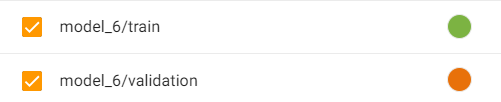

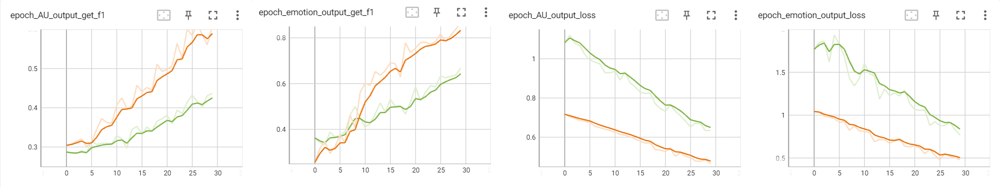

## Model Analysis
From the stable decrease in loss and increase in validation and training F1 Score, this is the start of a decent model for this classification task, with the last validation F1 Score on HLE being around 86% and 60% for predicting FACS codes. The phenomenon of validation loss being lower than training loss continued. From the looks of the learning curves, it seems like it needs more learning. This could either be done by increasing the epoch number or increasing the learning rate.

# Approach 7 : Transfer Learning [Higher Learning Rate]
Changes from the previous results include:  
Learning rate : 0.0001 to 0.0005

In [55]:
BATCH_SIZE = 48

STEPS_PER_EPOCH = len(train.index)//BATCH_SIZE
lr_schedule = tf.keras.optimizers.schedules.InverseTimeDecay(
  0.0005,
  # Decay 1000 times per step
  decay_steps=STEPS_PER_EPOCH*1000,
  decay_rate=1,
  staircase=False)

In [62]:
model_7 = MultiOutputModel_pretrained_finetune1((224,224,3)).assemble_full_model(224,224,num_AU=len(au_codes), num_emotion=3)

name_m7 = 'models/model_7'
training = True

model_7.compile(optimizer=tf.keras.optimizers.Adam(lr_schedule),
                loss={'emotion_output': 'categorical_crossentropy',
                      'AU_output': 'binary_crossentropy'
                      },
                loss_weights={
                    'AU_output': 0.8,
                    'emotion_output': 0.2
                },

                metrics={'emotion_output': get_f1,
                         'AU_output': get_f1
                })

callbacks, train_model = verify_training(name_m7, training, early_stopping=True, patience_num=10)

if train_model:
  history_7 = model_7.fit(color_training_generator,
                              epochs=30,
                              callbacks=callbacks,
                              validation_data=color_validation_generator)

Fine tuning at layer 100
Epoch 1/30
6/6 [==============================] - ETA: 0s - loss: 1.2636 - emotion_output_loss: 1.9563 - AU_output_loss: 1.0904 - emotion_output_get_f1: 0.3316 - AU_output_get_f1: 0.2989
Epoch 1: val_loss improved from inf to 0.80158, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_7/


6/6 [==============================] - 70s 10s/step - loss: 1.2636 - emotion_output_loss: 1.9563 - AU_output_loss: 1.0904 - emotion_output_get_f1: 0.3316 - AU_output_get_f1: 0.2989 - val_loss: 0.8016 - val_emotion_output_loss: 0.9684 - val_AU_output_loss: 0.7599 - val_emotion_output_get_f1: 0.3802 - val_AU_output_get_f1: 0.3385
Epoch 2/30
6/6 [==============================] - ETA: 0s - loss: 1.1071 - emotion_output_loss: 1.5136 - AU_output_loss: 1.0055 - emotion_output_get_f1: 0.4746 - AU_output_get_f1: 0.3394
Epoch 2: val_loss improved from 0.80158 to 0.75615, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_7/


6/6 [==============================] - 43s 8s/step - loss: 1.1071 - emotion_output_loss: 1.5136 - AU_output_loss: 1.0055 - emotion_output_get_f1: 0.4746 - AU_output_get_f1: 0.3394 - val_loss: 0.7561 - val_emotion_output_loss: 0.9315 - val_AU_output_loss: 0.7123 - val_emotion_output_get_f1: 0.4783 - val_AU_output_get_f1: 0.3759
Epoch 3/30
6/6 [==============================] - ETA: 0s - loss: 1.0538 - emotion_output_loss: 1.4686 - AU_output_loss: 0.9501 - emotion_output_get_f1: 0.4739 - AU_output_get_f1: 0.3243
Epoch 3: val_loss improved from 0.75615 to 0.69342, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_7/


6/6 [==============================] - 44s 8s/step - loss: 1.0538 - emotion_output_loss: 1.4686 - AU_output_loss: 0.9501 - emotion_output_get_f1: 0.4739 - AU_output_get_f1: 0.3243 - val_loss: 0.6934 - val_emotion_output_loss: 0.7639 - val_AU_output_loss: 0.6758 - val_emotion_output_get_f1: 0.6194 - val_AU_output_get_f1: 0.3884
Epoch 4/30
6/6 [==============================] - ETA: 0s - loss: 0.9510 - emotion_output_loss: 1.3529 - AU_output_loss: 0.8506 - emotion_output_get_f1: 0.5139 - AU_output_get_f1: 0.3371
Epoch 4: val_loss improved from 0.69342 to 0.63304, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_7/


6/6 [==============================] - 44s 8s/step - loss: 0.9510 - emotion_output_loss: 1.3529 - AU_output_loss: 0.8506 - emotion_output_get_f1: 0.5139 - AU_output_get_f1: 0.3371 - val_loss: 0.6330 - val_emotion_output_loss: 0.6646 - val_AU_output_loss: 0.6252 - val_emotion_output_get_f1: 0.7235 - val_AU_output_get_f1: 0.4447
Epoch 5/30
6/6 [==============================] - ETA: 0s - loss: 0.9007 - emotion_output_loss: 1.2800 - AU_output_loss: 0.8058 - emotion_output_get_f1: 0.4669 - AU_output_get_f1: 0.3554
Epoch 5: val_loss improved from 0.63304 to 0.59856, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_7/


6/6 [==============================] - 45s 9s/step - loss: 0.9007 - emotion_output_loss: 1.2800 - AU_output_loss: 0.8058 - emotion_output_get_f1: 0.4669 - AU_output_get_f1: 0.3554 - val_loss: 0.5986 - val_emotion_output_loss: 0.6466 - val_AU_output_loss: 0.5865 - val_emotion_output_get_f1: 0.7795 - val_AU_output_get_f1: 0.4585
Epoch 6/30
6/6 [==============================] - ETA: 0s - loss: 0.7880 - emotion_output_loss: 1.1384 - AU_output_loss: 0.7004 - emotion_output_get_f1: 0.5281 - AU_output_get_f1: 0.3970
Epoch 6: val_loss improved from 0.59856 to 0.56777, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_7/


6/6 [==============================] - 51s 10s/step - loss: 0.7880 - emotion_output_loss: 1.1384 - AU_output_loss: 0.7004 - emotion_output_get_f1: 0.5281 - AU_output_get_f1: 0.3970 - val_loss: 0.5678 - val_emotion_output_loss: 0.6778 - val_AU_output_loss: 0.5403 - val_emotion_output_get_f1: 0.7145 - val_AU_output_get_f1: 0.5142
Epoch 7/30
6/6 [==============================] - ETA: 0s - loss: 0.7393 - emotion_output_loss: 1.0238 - AU_output_loss: 0.6681 - emotion_output_get_f1: 0.5881 - AU_output_get_f1: 0.4079
Epoch 7: val_loss improved from 0.56777 to 0.53196, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_7/


6/6 [==============================] - 43s 8s/step - loss: 0.7393 - emotion_output_loss: 1.0238 - AU_output_loss: 0.6681 - emotion_output_get_f1: 0.5881 - AU_output_get_f1: 0.4079 - val_loss: 0.5320 - val_emotion_output_loss: 0.5915 - val_AU_output_loss: 0.5171 - val_emotion_output_get_f1: 0.7701 - val_AU_output_get_f1: 0.5123
Epoch 8/30
6/6 [==============================] - ETA: 0s - loss: 0.6724 - emotion_output_loss: 0.8617 - AU_output_loss: 0.6251 - emotion_output_get_f1: 0.6409 - AU_output_get_f1: 0.4259
Epoch 8: val_loss improved from 0.53196 to 0.46653, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_7/


6/6 [==============================] - 43s 8s/step - loss: 0.6724 - emotion_output_loss: 0.8617 - AU_output_loss: 0.6251 - emotion_output_get_f1: 0.6409 - AU_output_get_f1: 0.4259 - val_loss: 0.4665 - val_emotion_output_loss: 0.4215 - val_AU_output_loss: 0.4778 - val_emotion_output_get_f1: 0.8443 - val_AU_output_get_f1: 0.5646
Epoch 9/30
6/6 [==============================] - ETA: 0s - loss: 0.6360 - emotion_output_loss: 0.8523 - AU_output_loss: 0.5819 - emotion_output_get_f1: 0.6401 - AU_output_get_f1: 0.4633
Epoch 9: val_loss did not improve from 0.46653
6/6 [==============================] - 18s 3s/step - loss: 0.6360 - emotion_output_loss: 0.8523 - AU_output_loss: 0.5819 - emotion_output_get_f1: 0.6401 - AU_output_get_f1: 0.4633 - val_loss: 0.4946 - val_emotion_output_loss: 0.5495 - val_AU_output_loss: 0.4808 - val_emotion_output_get_f1: 0.7675 - val_AU_output_get_f1: 0.5756
Epoch 10/30
6/6 [==============================] - ETA: 0s - loss: 0.6037 - emotion_output_loss: 0.8307 - AU

6/6 [==============================] - 44s 8s/step - loss: 0.6037 - emotion_output_loss: 0.8307 - AU_output_loss: 0.5470 - emotion_output_get_f1: 0.6621 - AU_output_get_f1: 0.4802 - val_loss: 0.4086 - val_emotion_output_loss: 0.3461 - val_AU_output_loss: 0.4243 - val_emotion_output_get_f1: 0.8666 - val_AU_output_get_f1: 0.6335
Epoch 11/30
6/6 [==============================] - ETA: 0s - loss: 0.5657 - emotion_output_loss: 0.6936 - AU_output_loss: 0.5337 - emotion_output_get_f1: 0.7057 - AU_output_get_f1: 0.4905
Epoch 11: val_loss improved from 0.40863 to 0.40797, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_7/


6/6 [==============================] - 44s 8s/step - loss: 0.5657 - emotion_output_loss: 0.6936 - AU_output_loss: 0.5337 - emotion_output_get_f1: 0.7057 - AU_output_get_f1: 0.4905 - val_loss: 0.4080 - val_emotion_output_loss: 0.3821 - val_AU_output_loss: 0.4144 - val_emotion_output_get_f1: 0.8542 - val_AU_output_get_f1: 0.6214
Epoch 12/30
6/6 [==============================] - ETA: 0s - loss: 0.5362 - emotion_output_loss: 0.6807 - AU_output_loss: 0.5000 - emotion_output_get_f1: 0.7459 - AU_output_get_f1: 0.4978
Epoch 12: val_loss improved from 0.40797 to 0.38530, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_7/


6/6 [==============================] - 44s 8s/step - loss: 0.5362 - emotion_output_loss: 0.6807 - AU_output_loss: 0.5000 - emotion_output_get_f1: 0.7459 - AU_output_get_f1: 0.4978 - val_loss: 0.3853 - val_emotion_output_loss: 0.3164 - val_AU_output_loss: 0.4025 - val_emotion_output_get_f1: 0.8387 - val_AU_output_get_f1: 0.6490
Epoch 13/30
6/6 [==============================] - ETA: 0s - loss: 0.5008 - emotion_output_loss: 0.6286 - AU_output_loss: 0.4689 - emotion_output_get_f1: 0.7095 - AU_output_get_f1: 0.5359
Epoch 13: val_loss improved from 0.38530 to 0.35566, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_7/


6/6 [==============================] - 44s 8s/step - loss: 0.5008 - emotion_output_loss: 0.6286 - AU_output_loss: 0.4689 - emotion_output_get_f1: 0.7095 - AU_output_get_f1: 0.5359 - val_loss: 0.3557 - val_emotion_output_loss: 0.2409 - val_AU_output_loss: 0.3844 - val_emotion_output_get_f1: 0.9149 - val_AU_output_get_f1: 0.6861
Epoch 14/30
6/6 [==============================] - ETA: 0s - loss: 0.4639 - emotion_output_loss: 0.6142 - AU_output_loss: 0.4263 - emotion_output_get_f1: 0.7297 - AU_output_get_f1: 0.5568
Epoch 14: val_loss did not improve from 0.35566
6/6 [==============================] - 18s 3s/step - loss: 0.4639 - emotion_output_loss: 0.6142 - AU_output_loss: 0.4263 - emotion_output_get_f1: 0.7297 - AU_output_get_f1: 0.5568 - val_loss: 0.3642 - val_emotion_output_loss: 0.2837 - val_AU_output_loss: 0.3843 - val_emotion_output_get_f1: 0.9031 - val_AU_output_get_f1: 0.6688
Epoch 15/30
6/6 [==============================] - ETA: 0s - loss: 0.4698 - emotion_output_loss: 0.5724 - 

6/6 [==============================] - 45s 9s/step - loss: 0.4266 - emotion_output_loss: 0.4608 - AU_output_loss: 0.4180 - emotion_output_get_f1: 0.7967 - AU_output_get_f1: 0.5860 - val_loss: 0.3527 - val_emotion_output_loss: 0.2454 - val_AU_output_loss: 0.3795 - val_emotion_output_get_f1: 0.9197 - val_AU_output_get_f1: 0.6664
Epoch 17/30
6/6 [==============================] - ETA: 0s - loss: 0.4236 - emotion_output_loss: 0.5191 - AU_output_loss: 0.3997 - emotion_output_get_f1: 0.7707 - AU_output_get_f1: 0.5999
Epoch 17: val_loss improved from 0.35266 to 0.33954, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_7/


6/6 [==============================] - 44s 8s/step - loss: 0.4236 - emotion_output_loss: 0.5191 - AU_output_loss: 0.3997 - emotion_output_get_f1: 0.7707 - AU_output_get_f1: 0.5999 - val_loss: 0.3395 - val_emotion_output_loss: 0.2292 - val_AU_output_loss: 0.3671 - val_emotion_output_get_f1: 0.9368 - val_AU_output_get_f1: 0.6852
Epoch 18/30
6/6 [==============================] - ETA: 0s - loss: 0.4151 - emotion_output_loss: 0.4901 - AU_output_loss: 0.3964 - emotion_output_get_f1: 0.7795 - AU_output_get_f1: 0.5983
Epoch 18: val_loss improved from 0.33954 to 0.31357, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_7/


6/6 [==============================] - 44s 8s/step - loss: 0.4151 - emotion_output_loss: 0.4901 - AU_output_loss: 0.3964 - emotion_output_get_f1: 0.7795 - AU_output_get_f1: 0.5983 - val_loss: 0.3136 - val_emotion_output_loss: 0.2421 - val_AU_output_loss: 0.3314 - val_emotion_output_get_f1: 0.9312 - val_AU_output_get_f1: 0.6918
Epoch 19/30
6/6 [==============================] - ETA: 0s - loss: 0.3904 - emotion_output_loss: 0.4240 - AU_output_loss: 0.3820 - emotion_output_get_f1: 0.8197 - AU_output_get_f1: 0.6034
Epoch 19: val_loss did not improve from 0.31357
6/6 [==============================] - 17s 3s/step - loss: 0.3904 - emotion_output_loss: 0.4240 - AU_output_loss: 0.3820 - emotion_output_get_f1: 0.8197 - AU_output_get_f1: 0.6034 - val_loss: 0.3360 - val_emotion_output_loss: 0.2590 - val_AU_output_loss: 0.3552 - val_emotion_output_get_f1: 0.8891 - val_AU_output_get_f1: 0.6729
Epoch 20/30
6/6 [==============================] - ETA: 0s - loss: 0.3940 - emotion_output_loss: 0.4943 - 

6/6 [==============================] - 43s 8s/step - loss: 0.3820 - emotion_output_loss: 0.4057 - AU_output_loss: 0.3761 - emotion_output_get_f1: 0.8435 - AU_output_get_f1: 0.6315 - val_loss: 0.2973 - val_emotion_output_loss: 0.1903 - val_AU_output_loss: 0.3240 - val_emotion_output_get_f1: 0.9468 - val_AU_output_get_f1: 0.6999
Epoch 23/30
6/6 [==============================] - ETA: 0s - loss: 0.3461 - emotion_output_loss: 0.4004 - AU_output_loss: 0.3325 - emotion_output_get_f1: 0.8327 - AU_output_get_f1: 0.6528
Epoch 23: val_loss did not improve from 0.29728
6/6 [==============================] - 17s 3s/step - loss: 0.3461 - emotion_output_loss: 0.4004 - AU_output_loss: 0.3325 - emotion_output_get_f1: 0.8327 - AU_output_get_f1: 0.6528 - val_loss: 0.3178 - val_emotion_output_loss: 0.2947 - val_AU_output_loss: 0.3236 - val_emotion_output_get_f1: 0.9135 - val_AU_output_get_f1: 0.6894
Epoch 24/30
6/6 [==============================] - ETA: 0s - loss: 0.3473 - emotion_output_loss: 0.3683 - 

6/6 [==============================] - 43s 8s/step - loss: 0.3135 - emotion_output_loss: 0.3099 - AU_output_loss: 0.3145 - emotion_output_get_f1: 0.8809 - AU_output_get_f1: 0.6701 - val_loss: 0.2739 - val_emotion_output_loss: 0.1772 - val_AU_output_loss: 0.2981 - val_emotion_output_get_f1: 0.9262 - val_AU_output_get_f1: 0.7307
Epoch 28/30
6/6 [==============================] - ETA: 0s - loss: 0.3125 - emotion_output_loss: 0.2976 - AU_output_loss: 0.3162 - emotion_output_get_f1: 0.9074 - AU_output_get_f1: 0.6829
Epoch 28: val_loss improved from 0.27392 to 0.26999, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_7/


6/6 [==============================] - 44s 8s/step - loss: 0.3125 - emotion_output_loss: 0.2976 - AU_output_loss: 0.3162 - emotion_output_get_f1: 0.9074 - AU_output_get_f1: 0.6829 - val_loss: 0.2700 - val_emotion_output_loss: 0.1508 - val_AU_output_loss: 0.2998 - val_emotion_output_get_f1: 0.9736 - val_AU_output_get_f1: 0.7043
Epoch 29/30
6/6 [==============================] - ETA: 0s - loss: 0.2925 - emotion_output_loss: 0.2594 - AU_output_loss: 0.3008 - emotion_output_get_f1: 0.9057 - AU_output_get_f1: 0.7014
Epoch 29: val_loss did not improve from 0.26999
6/6 [==============================] - 17s 3s/step - loss: 0.2925 - emotion_output_loss: 0.2594 - AU_output_loss: 0.3008 - emotion_output_get_f1: 0.9057 - AU_output_get_f1: 0.7014 - val_loss: 0.2967 - val_emotion_output_loss: 0.2264 - val_AU_output_loss: 0.3143 - val_emotion_output_get_f1: 0.9247 - val_AU_output_get_f1: 0.6931
Epoch 30/30
6/6 [==============================] - ETA: 0s - loss: 0.3082 - emotion_output_loss: 0.2976 - 

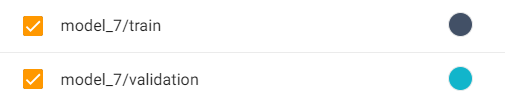

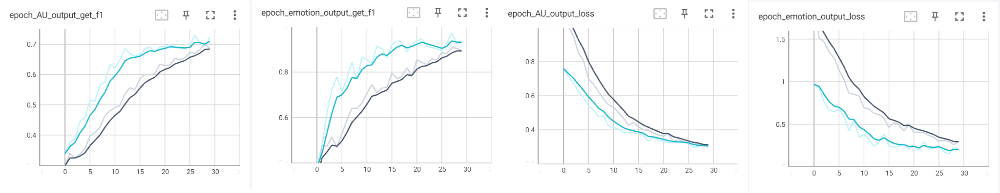

## Model Analysis

From analysing the learning curve, the validation and training loss for both target attributes ended up similar, which is good. Other than that, the model's performace for both target attributes are very decent (90% HLE and 70% FACS). With that, one of the possible actions to improve the model's performance could be slighly increasing the model's complexity again.

# Approach 8 : Transfer Learning [Lower Learning Rate, Increased Complexity]
The changes from previous results include:  
- Incraese complexity of AU brach

In [56]:
BATCH_SIZE = 48

STEPS_PER_EPOCH = len(train.index)//BATCH_SIZE
lr_schedule = tf.keras.optimizers.schedules.InverseTimeDecay(
  0.0005,
  # Decay 1000 times per step
  decay_steps=STEPS_PER_EPOCH*1000,
  decay_rate=1,
  staircase=False)

Fine tuning at layer 100


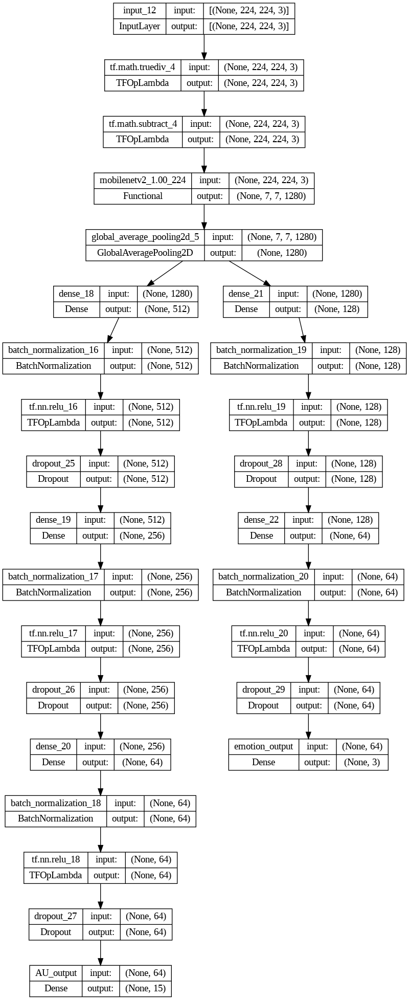

In [57]:
class MultiOutputModel_pretrained_finetune2(MultiOutputModel_pretrained_finetune1):
   def build_AU_branch(self, inputs, num_AU=15):
    x = tf.keras.layers.Dense(512)(inputs)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.activations.relu(x)
    x = tf.keras.layers.Dropout(0.5)(x)

    x = tf.keras.layers.Dense(256)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.activations.relu(x)
    x = tf.keras.layers.Dropout(0.8)(x)

    x = tf.keras.layers.Dense(64)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.activations.relu(x)
    x = tf.keras.layers.Dropout(0.5)(x)

    x = tf.keras.layers.Dense(num_AU, activation='sigmoid', name="AU_output")(x)

    return x

model_8 = MultiOutputModel_pretrained_finetune2((224,224,3)).assemble_full_model(224,224,num_AU=len(au_codes), num_emotion=3)
tf.keras.utils.plot_model(model_8, show_shapes=True)

In [65]:
name_m8 = 'models/model_8'
training = True

model_8.compile(optimizer=tf.keras.optimizers.Adam(lr_schedule),
                loss={'emotion_output': 'categorical_crossentropy',
                      'AU_output': 'binary_crossentropy'
                      },
                loss_weights={
                    'AU_output': 0.8,
                    'emotion_output': 0.2
                },

                metrics={'emotion_output': get_f1,
                         'AU_output': get_f1
                })

callbacks, train_model = verify_training(name_m8, training, early_stopping=True, patience_num=10)

if train_model:
  history_8 = model_8.fit(color_training_generator,
                              epochs=30,
                              callbacks=callbacks,
                              validation_data=color_validation_generator)

Epoch 1/30
6/6 [==============================] - ETA: 0s - loss: 1.0583 - emotion_output_loss: 2.0637 - AU_output_loss: 0.8069 - emotion_output_get_f1: 0.3151 - AU_output_get_f1: 0.3208
Epoch 1: val_loss improved from inf to 0.74894, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_8/


6/6 [==============================] - 67s 9s/step - loss: 1.0583 - emotion_output_loss: 2.0637 - AU_output_loss: 0.8069 - emotion_output_get_f1: 0.3151 - AU_output_get_f1: 0.3208 - val_loss: 0.7489 - val_emotion_output_loss: 0.9685 - val_AU_output_loss: 0.6941 - val_emotion_output_get_f1: 0.2969 - val_AU_output_get_f1: 0.2552
Epoch 2/30
6/6 [==============================] - ETA: 0s - loss: 0.9663 - emotion_output_loss: 1.6624 - AU_output_loss: 0.7923 - emotion_output_get_f1: 0.3802 - AU_output_get_f1: 0.3156
Epoch 2: val_loss improved from 0.74894 to 0.72149, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_8/


6/6 [==============================] - 45s 8s/step - loss: 0.9663 - emotion_output_loss: 1.6624 - AU_output_loss: 0.7923 - emotion_output_get_f1: 0.3802 - AU_output_get_f1: 0.3156 - val_loss: 0.7215 - val_emotion_output_loss: 0.8636 - val_AU_output_loss: 0.6860 - val_emotion_output_get_f1: 0.4559 - val_AU_output_get_f1: 0.2618
Epoch 3/30
6/6 [==============================] - ETA: 0s - loss: 0.9193 - emotion_output_loss: 1.5012 - AU_output_loss: 0.7738 - emotion_output_get_f1: 0.3985 - AU_output_get_f1: 0.3012
Epoch 3: val_loss improved from 0.72149 to 0.68972, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_8/


6/6 [==============================] - 47s 9s/step - loss: 0.9193 - emotion_output_loss: 1.5012 - AU_output_loss: 0.7738 - emotion_output_get_f1: 0.3985 - AU_output_get_f1: 0.3012 - val_loss: 0.6897 - val_emotion_output_loss: 0.7690 - val_AU_output_loss: 0.6699 - val_emotion_output_get_f1: 0.5946 - val_AU_output_get_f1: 0.2705
Epoch 4/30
6/6 [==============================] - ETA: 0s - loss: 0.8655 - emotion_output_loss: 1.3800 - AU_output_loss: 0.7369 - emotion_output_get_f1: 0.4730 - AU_output_get_f1: 0.3105
Epoch 4: val_loss improved from 0.68972 to 0.65857, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_8/


6/6 [==============================] - 44s 8s/step - loss: 0.8655 - emotion_output_loss: 1.3800 - AU_output_loss: 0.7369 - emotion_output_get_f1: 0.4730 - AU_output_get_f1: 0.3105 - val_loss: 0.6586 - val_emotion_output_loss: 0.6622 - val_AU_output_loss: 0.6577 - val_emotion_output_get_f1: 0.6874 - val_AU_output_get_f1: 0.3509
Epoch 5/30
6/6 [==============================] - ETA: 0s - loss: 0.8539 - emotion_output_loss: 1.4208 - AU_output_loss: 0.7122 - emotion_output_get_f1: 0.4376 - AU_output_get_f1: 0.3373
Epoch 5: val_loss improved from 0.65857 to 0.61578, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_8/


6/6 [==============================] - 46s 9s/step - loss: 0.8539 - emotion_output_loss: 1.4208 - AU_output_loss: 0.7122 - emotion_output_get_f1: 0.4376 - AU_output_get_f1: 0.3373 - val_loss: 0.6158 - val_emotion_output_loss: 0.5215 - val_AU_output_loss: 0.6393 - val_emotion_output_get_f1: 0.7946 - val_AU_output_get_f1: 0.3902
Epoch 6/30
6/6 [==============================] - ETA: 0s - loss: 0.7927 - emotion_output_loss: 1.1762 - AU_output_loss: 0.6969 - emotion_output_get_f1: 0.5163 - AU_output_get_f1: 0.3400
Epoch 6: val_loss improved from 0.61578 to 0.58875, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_8/


6/6 [==============================] - 45s 9s/step - loss: 0.7927 - emotion_output_loss: 1.1762 - AU_output_loss: 0.6969 - emotion_output_get_f1: 0.5163 - AU_output_get_f1: 0.3400 - val_loss: 0.5888 - val_emotion_output_loss: 0.4252 - val_AU_output_loss: 0.6296 - val_emotion_output_get_f1: 0.8535 - val_AU_output_get_f1: 0.3664
Epoch 7/30
6/6 [==============================] - ETA: 0s - loss: 0.7290 - emotion_output_loss: 0.9902 - AU_output_loss: 0.6637 - emotion_output_get_f1: 0.5659 - AU_output_get_f1: 0.3406
Epoch 7: val_loss improved from 0.58875 to 0.58530, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_8/


6/6 [==============================] - 44s 8s/step - loss: 0.7290 - emotion_output_loss: 0.9902 - AU_output_loss: 0.6637 - emotion_output_get_f1: 0.5659 - AU_output_get_f1: 0.3406 - val_loss: 0.5853 - val_emotion_output_loss: 0.4830 - val_AU_output_loss: 0.6109 - val_emotion_output_get_f1: 0.8357 - val_AU_output_get_f1: 0.4371
Epoch 8/30
6/6 [==============================] - ETA: 0s - loss: 0.6852 - emotion_output_loss: 0.8385 - AU_output_loss: 0.6468 - emotion_output_get_f1: 0.6247 - AU_output_get_f1: 0.3651
Epoch 8: val_loss improved from 0.58530 to 0.54845, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_8/


6/6 [==============================] - 44s 8s/step - loss: 0.6852 - emotion_output_loss: 0.8385 - AU_output_loss: 0.6468 - emotion_output_get_f1: 0.6247 - AU_output_get_f1: 0.3651 - val_loss: 0.5485 - val_emotion_output_loss: 0.3708 - val_AU_output_loss: 0.5929 - val_emotion_output_get_f1: 0.8756 - val_AU_output_get_f1: 0.4936
Epoch 9/30
6/6 [==============================] - ETA: 0s - loss: 0.6699 - emotion_output_loss: 0.8265 - AU_output_loss: 0.6308 - emotion_output_get_f1: 0.6549 - AU_output_get_f1: 0.3705
Epoch 9: val_loss improved from 0.54845 to 0.53116, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_8/


6/6 [==============================] - 46s 9s/step - loss: 0.6699 - emotion_output_loss: 0.8265 - AU_output_loss: 0.6308 - emotion_output_get_f1: 0.6549 - AU_output_get_f1: 0.3705 - val_loss: 0.5312 - val_emotion_output_loss: 0.3521 - val_AU_output_loss: 0.5759 - val_emotion_output_get_f1: 0.8770 - val_AU_output_get_f1: 0.5199
Epoch 10/30
6/6 [==============================] - ETA: 0s - loss: 0.6398 - emotion_output_loss: 0.7679 - AU_output_loss: 0.6078 - emotion_output_get_f1: 0.6587 - AU_output_get_f1: 0.3765
Epoch 10: val_loss did not improve from 0.53116
6/6 [==============================] - 19s 3s/step - loss: 0.6398 - emotion_output_loss: 0.7679 - AU_output_loss: 0.6078 - emotion_output_get_f1: 0.6587 - AU_output_get_f1: 0.3765 - val_loss: 0.5460 - val_emotion_output_loss: 0.4480 - val_AU_output_loss: 0.5705 - val_emotion_output_get_f1: 0.8387 - val_AU_output_get_f1: 0.5678
Epoch 11/30
6/6 [==============================] - ETA: 0s - loss: 0.5992 - emotion_output_loss: 0.6646 - 

6/6 [==============================] - 44s 8s/step - loss: 0.5992 - emotion_output_loss: 0.6646 - AU_output_loss: 0.5829 - emotion_output_get_f1: 0.7267 - AU_output_get_f1: 0.3996 - val_loss: 0.5307 - val_emotion_output_loss: 0.4308 - val_AU_output_loss: 0.5556 - val_emotion_output_get_f1: 0.8421 - val_AU_output_get_f1: 0.5963
Epoch 12/30
6/6 [==============================] - ETA: 0s - loss: 0.5979 - emotion_output_loss: 0.6748 - AU_output_loss: 0.5787 - emotion_output_get_f1: 0.7119 - AU_output_get_f1: 0.3898
Epoch 12: val_loss improved from 0.53065 to 0.50676, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_8/


6/6 [==============================] - 46s 9s/step - loss: 0.5979 - emotion_output_loss: 0.6748 - AU_output_loss: 0.5787 - emotion_output_get_f1: 0.7119 - AU_output_get_f1: 0.3898 - val_loss: 0.5068 - val_emotion_output_loss: 0.3601 - val_AU_output_loss: 0.5434 - val_emotion_output_get_f1: 0.8899 - val_AU_output_get_f1: 0.6080
Epoch 13/30
6/6 [==============================] - ETA: 0s - loss: 0.5717 - emotion_output_loss: 0.5895 - AU_output_loss: 0.5673 - emotion_output_get_f1: 0.7240 - AU_output_get_f1: 0.4094
Epoch 13: val_loss improved from 0.50676 to 0.48736, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_8/


6/6 [==============================] - 46s 9s/step - loss: 0.5717 - emotion_output_loss: 0.5895 - AU_output_loss: 0.5673 - emotion_output_get_f1: 0.7240 - AU_output_get_f1: 0.4094 - val_loss: 0.4874 - val_emotion_output_loss: 0.3353 - val_AU_output_loss: 0.5254 - val_emotion_output_get_f1: 0.8381 - val_AU_output_get_f1: 0.5944
Epoch 14/30
6/6 [==============================] - ETA: 0s - loss: 0.5471 - emotion_output_loss: 0.5662 - AU_output_loss: 0.5423 - emotion_output_get_f1: 0.7775 - AU_output_get_f1: 0.4269
Epoch 14: val_loss did not improve from 0.48736
6/6 [==============================] - 18s 3s/step - loss: 0.5471 - emotion_output_loss: 0.5662 - AU_output_loss: 0.5423 - emotion_output_get_f1: 0.7775 - AU_output_get_f1: 0.4269 - val_loss: 0.4925 - val_emotion_output_loss: 0.3713 - val_AU_output_loss: 0.5229 - val_emotion_output_get_f1: 0.8599 - val_AU_output_get_f1: 0.5976
Epoch 15/30
6/6 [==============================] - ETA: 0s - loss: 0.5429 - emotion_output_loss: 0.5692 - 

6/6 [==============================] - 45s 9s/step - loss: 0.5429 - emotion_output_loss: 0.5692 - AU_output_loss: 0.5364 - emotion_output_get_f1: 0.7558 - AU_output_get_f1: 0.4146 - val_loss: 0.4651 - val_emotion_output_loss: 0.3284 - val_AU_output_loss: 0.4992 - val_emotion_output_get_f1: 0.9005 - val_AU_output_get_f1: 0.6266
Epoch 16/30
6/6 [==============================] - ETA: 0s - loss: 0.5270 - emotion_output_loss: 0.4673 - AU_output_loss: 0.5419 - emotion_output_get_f1: 0.8301 - AU_output_get_f1: 0.4053
Epoch 16: val_loss improved from 0.46508 to 0.41432, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_8/


6/6 [==============================] - 44s 8s/step - loss: 0.5270 - emotion_output_loss: 0.4673 - AU_output_loss: 0.5419 - emotion_output_get_f1: 0.8301 - AU_output_get_f1: 0.4053 - val_loss: 0.4143 - val_emotion_output_loss: 0.1798 - val_AU_output_loss: 0.4729 - val_emotion_output_get_f1: 0.9523 - val_AU_output_get_f1: 0.6511
Epoch 17/30
6/6 [==============================] - ETA: 0s - loss: 0.5013 - emotion_output_loss: 0.4957 - AU_output_loss: 0.5027 - emotion_output_get_f1: 0.7949 - AU_output_get_f1: 0.4663
Epoch 17: val_loss did not improve from 0.41432
6/6 [==============================] - 17s 3s/step - loss: 0.5013 - emotion_output_loss: 0.4957 - AU_output_loss: 0.5027 - emotion_output_get_f1: 0.7949 - AU_output_get_f1: 0.4663 - val_loss: 0.4254 - val_emotion_output_loss: 0.2536 - val_AU_output_loss: 0.4684 - val_emotion_output_get_f1: 0.9474 - val_AU_output_get_f1: 0.6419
Epoch 18/30
6/6 [==============================] - ETA: 0s - loss: 0.4921 - emotion_output_loss: 0.4613 - 

6/6 [==============================] - 45s 8s/step - loss: 0.4501 - emotion_output_loss: 0.3732 - AU_output_loss: 0.4693 - emotion_output_get_f1: 0.8622 - AU_output_get_f1: 0.4725 - val_loss: 0.3885 - val_emotion_output_loss: 0.2335 - val_AU_output_loss: 0.4272 - val_emotion_output_get_f1: 0.9099 - val_AU_output_get_f1: 0.6799
Epoch 23/30
6/6 [==============================] - ETA: 0s - loss: 0.4273 - emotion_output_loss: 0.3378 - AU_output_loss: 0.4497 - emotion_output_get_f1: 0.8675 - AU_output_get_f1: 0.5213
Epoch 23: val_loss improved from 0.38847 to 0.37309, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_8/


6/6 [==============================] - 43s 8s/step - loss: 0.4273 - emotion_output_loss: 0.3378 - AU_output_loss: 0.4497 - emotion_output_get_f1: 0.8675 - AU_output_get_f1: 0.5213 - val_loss: 0.3731 - val_emotion_output_loss: 0.2023 - val_AU_output_loss: 0.4158 - val_emotion_output_get_f1: 0.9206 - val_AU_output_get_f1: 0.6783
Epoch 24/30
6/6 [==============================] - ETA: 0s - loss: 0.4354 - emotion_output_loss: 0.3612 - AU_output_loss: 0.4539 - emotion_output_get_f1: 0.8834 - AU_output_get_f1: 0.4976
Epoch 24: val_loss did not improve from 0.37309
6/6 [==============================] - 18s 3s/step - loss: 0.4354 - emotion_output_loss: 0.3612 - AU_output_loss: 0.4539 - emotion_output_get_f1: 0.8834 - AU_output_get_f1: 0.4976 - val_loss: 0.4016 - val_emotion_output_loss: 0.3299 - val_AU_output_loss: 0.4196 - val_emotion_output_get_f1: 0.9099 - val_AU_output_get_f1: 0.6436
Epoch 25/30
6/6 [==============================] - ETA: 0s - loss: 0.4390 - emotion_output_loss: 0.3860 - 

6/6 [==============================] - 43s 8s/step - loss: 0.3992 - emotion_output_loss: 0.2648 - AU_output_loss: 0.4328 - emotion_output_get_f1: 0.9153 - AU_output_get_f1: 0.5485 - val_loss: 0.3659 - val_emotion_output_loss: 0.2603 - val_AU_output_loss: 0.3923 - val_emotion_output_get_f1: 0.8943 - val_AU_output_get_f1: 0.6574
Epoch 27/30
6/6 [==============================] - ETA: 0s - loss: 0.4082 - emotion_output_loss: 0.3019 - AU_output_loss: 0.4348 - emotion_output_get_f1: 0.8933 - AU_output_get_f1: 0.5228
Epoch 27: val_loss did not improve from 0.36592
6/6 [==============================] - 18s 3s/step - loss: 0.4082 - emotion_output_loss: 0.3019 - AU_output_loss: 0.4348 - emotion_output_get_f1: 0.8933 - AU_output_get_f1: 0.5228 - val_loss: 0.3735 - val_emotion_output_loss: 0.3053 - val_AU_output_loss: 0.3905 - val_emotion_output_get_f1: 0.8897 - val_AU_output_get_f1: 0.6499
Epoch 28/30
6/6 [==============================] - ETA: 0s - loss: 0.3964 - emotion_output_loss: 0.2711 - 

6/6 [==============================] - 44s 8s/step - loss: 0.3880 - emotion_output_loss: 0.2405 - AU_output_loss: 0.4249 - emotion_output_get_f1: 0.9263 - AU_output_get_f1: 0.5394 - val_loss: 0.3375 - val_emotion_output_loss: 0.1958 - val_AU_output_loss: 0.3729 - val_emotion_output_get_f1: 0.9366 - val_AU_output_get_f1: 0.6720
Epoch 30/30
6/6 [==============================] - ETA: 0s - loss: 0.3799 - emotion_output_loss: 0.2429 - AU_output_loss: 0.4142 - emotion_output_get_f1: 0.9285 - AU_output_get_f1: 0.5593
Epoch 30: val_loss did not improve from 0.33749
6/6 [==============================] - 17s 3s/step - loss: 0.3799 - emotion_output_loss: 0.2429 - AU_output_loss: 0.4142 - emotion_output_get_f1: 0.9285 - AU_output_get_f1: 0.5593 - val_loss: 0.3400 - val_emotion_output_loss: 0.2205 - val_AU_output_loss: 0.3699 - val_emotion_output_get_f1: 0.9271 - val_AU_output_get_f1: 0.6603


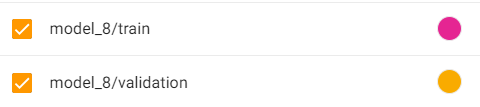

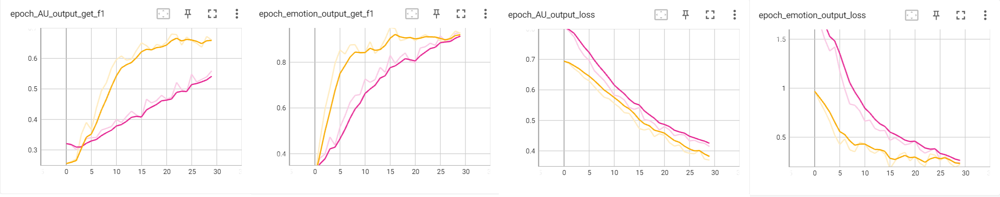

## Model Analysis
It is surprising to see that after increasing the complexity the model performed worse. Additionally, the loss for FACS branch also increased. However, no overfitting occured as validation F1 Score is higher than training's for both target attributes. Thus, the model's complexity will be reversed. With that, the model could be tried to train for more epoch.

# Approach 9 : Transfer Learning [Increased Epochs]
Changes from the previous results include:
 - Epoch number : 30 to 50
 - Decreased AU Branch complexity

In [59]:
model_9 = MultiOutputModel_pretrained_finetune1((224,224,3)).assemble_full_model(224,224,num_AU=len(au_codes), num_emotion=3)

name_m9 = 'models/model_9'
training = True

model_9.compile(optimizer=tf.keras.optimizers.Adam(lr_schedule),
                loss={'emotion_output': 'categorical_crossentropy',
                      'AU_output': 'binary_crossentropy'
                      },
                loss_weights={
                    'AU_output': 0.8,
                    'emotion_output': 0.2
                },

                metrics={'emotion_output': get_f1,
                         'AU_output': get_f1
                })

callbacks, train_model = verify_training(name_m9, training, early_stopping=True, patience_num=10)

if train_model:
  history_9 = model_9.fit(color_training_generator,
                              epochs=50,
                              callbacks=callbacks,
                              validation_data=color_validation_generator)

Fine tuning at layer 100
Epoch 1/50
6/6 [==============================] - ETA: 0s - loss: 1.1951 - emotion_output_loss: 1.8866 - AU_output_loss: 1.0222 - emotion_output_get_f1: 0.3472 - AU_output_get_f1: 0.3050
Epoch 1: val_loss improved from inf to 0.74230, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_9/


6/6 [==============================] - 73s 9s/step - loss: 1.1951 - emotion_output_loss: 1.8866 - AU_output_loss: 1.0222 - emotion_output_get_f1: 0.3472 - AU_output_get_f1: 0.3050 - val_loss: 0.7423 - val_emotion_output_loss: 0.9299 - val_AU_output_loss: 0.6954 - val_emotion_output_get_f1: 0.3401 - val_AU_output_get_f1: 0.3513
Epoch 2/50
6/6 [==============================] - ETA: 0s - loss: 1.0887 - emotion_output_loss: 1.6491 - AU_output_loss: 0.9486 - emotion_output_get_f1: 0.3962 - AU_output_get_f1: 0.3046
Epoch 2: val_loss improved from 0.74230 to 0.72305, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_9/


6/6 [==============================] - 45s 9s/step - loss: 1.0887 - emotion_output_loss: 1.6491 - AU_output_loss: 0.9486 - emotion_output_get_f1: 0.3962 - AU_output_get_f1: 0.3046 - val_loss: 0.7231 - val_emotion_output_loss: 0.9430 - val_AU_output_loss: 0.6681 - val_emotion_output_get_f1: 0.3267 - val_AU_output_get_f1: 0.3439
Epoch 3/50
6/6 [==============================] - ETA: 0s - loss: 1.0529 - emotion_output_loss: 1.6779 - AU_output_loss: 0.8967 - emotion_output_get_f1: 0.3696 - AU_output_get_f1: 0.3128
Epoch 3: val_loss improved from 0.72305 to 0.66072, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_9/


6/6 [==============================] - 44s 8s/step - loss: 1.0529 - emotion_output_loss: 1.6779 - AU_output_loss: 0.8967 - emotion_output_get_f1: 0.3696 - AU_output_get_f1: 0.3128 - val_loss: 0.6607 - val_emotion_output_loss: 0.8404 - val_AU_output_loss: 0.6158 - val_emotion_output_get_f1: 0.5004 - val_AU_output_get_f1: 0.4056
Epoch 4/50
6/6 [==============================] - ETA: 0s - loss: 0.9499 - emotion_output_loss: 1.5087 - AU_output_loss: 0.8102 - emotion_output_get_f1: 0.4278 - AU_output_get_f1: 0.3373
Epoch 4: val_loss improved from 0.66072 to 0.60992, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_9/


6/6 [==============================] - 44s 8s/step - loss: 0.9499 - emotion_output_loss: 1.5087 - AU_output_loss: 0.8102 - emotion_output_get_f1: 0.4278 - AU_output_get_f1: 0.3373 - val_loss: 0.6099 - val_emotion_output_loss: 0.7362 - val_AU_output_loss: 0.5784 - val_emotion_output_get_f1: 0.6818 - val_AU_output_get_f1: 0.4025
Epoch 5/50
6/6 [==============================] - ETA: 0s - loss: 0.8590 - emotion_output_loss: 1.3349 - AU_output_loss: 0.7400 - emotion_output_get_f1: 0.4538 - AU_output_get_f1: 0.3715
Epoch 5: val_loss improved from 0.60992 to 0.59002, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_9/


6/6 [==============================] - 44s 8s/step - loss: 0.8590 - emotion_output_loss: 1.3349 - AU_output_loss: 0.7400 - emotion_output_get_f1: 0.4538 - AU_output_get_f1: 0.3715 - val_loss: 0.5900 - val_emotion_output_loss: 0.7722 - val_AU_output_loss: 0.5445 - val_emotion_output_get_f1: 0.6823 - val_AU_output_get_f1: 0.4617
Epoch 6/50
6/6 [==============================] - ETA: 0s - loss: 0.7487 - emotion_output_loss: 1.0370 - AU_output_loss: 0.6766 - emotion_output_get_f1: 0.5563 - AU_output_get_f1: 0.3855
Epoch 6: val_loss improved from 0.59002 to 0.52438, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_9/


6/6 [==============================] - 44s 8s/step - loss: 0.7487 - emotion_output_loss: 1.0370 - AU_output_loss: 0.6766 - emotion_output_get_f1: 0.5563 - AU_output_get_f1: 0.3855 - val_loss: 0.5244 - val_emotion_output_loss: 0.5906 - val_AU_output_loss: 0.5078 - val_emotion_output_get_f1: 0.7706 - val_AU_output_get_f1: 0.5111
Epoch 7/50
6/6 [==============================] - ETA: 0s - loss: 0.6582 - emotion_output_loss: 0.8793 - AU_output_loss: 0.6029 - emotion_output_get_f1: 0.6175 - AU_output_get_f1: 0.4100
Epoch 7: val_loss improved from 0.52438 to 0.46463, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_9/


6/6 [==============================] - 43s 8s/step - loss: 0.6582 - emotion_output_loss: 0.8793 - AU_output_loss: 0.6029 - emotion_output_get_f1: 0.6175 - AU_output_get_f1: 0.4100 - val_loss: 0.4646 - val_emotion_output_loss: 0.4833 - val_AU_output_loss: 0.4600 - val_emotion_output_get_f1: 0.8111 - val_AU_output_get_f1: 0.5713
Epoch 8/50
6/6 [==============================] - ETA: 0s - loss: 0.6274 - emotion_output_loss: 0.8040 - AU_output_loss: 0.5833 - emotion_output_get_f1: 0.6012 - AU_output_get_f1: 0.4419
Epoch 8: val_loss improved from 0.46463 to 0.43168, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_9/


6/6 [==============================] - 44s 8s/step - loss: 0.6274 - emotion_output_loss: 0.8040 - AU_output_loss: 0.5833 - emotion_output_get_f1: 0.6012 - AU_output_get_f1: 0.4419 - val_loss: 0.4317 - val_emotion_output_loss: 0.4070 - val_AU_output_loss: 0.4379 - val_emotion_output_get_f1: 0.8733 - val_AU_output_get_f1: 0.6081
Epoch 9/50
6/6 [==============================] - ETA: 0s - loss: 0.5970 - emotion_output_loss: 0.8021 - AU_output_loss: 0.5458 - emotion_output_get_f1: 0.6340 - AU_output_get_f1: 0.4566
Epoch 9: val_loss did not improve from 0.43168
6/6 [==============================] - 18s 3s/step - loss: 0.5970 - emotion_output_loss: 0.8021 - AU_output_loss: 0.5458 - emotion_output_get_f1: 0.6340 - AU_output_get_f1: 0.4566 - val_loss: 0.4344 - val_emotion_output_loss: 0.4488 - val_AU_output_loss: 0.4308 - val_emotion_output_get_f1: 0.8242 - val_AU_output_get_f1: 0.6100
Epoch 10/50
6/6 [==============================] - ETA: 0s - loss: 0.5409 - emotion_output_loss: 0.6992 - AU

6/6 [==============================] - 45s 8s/step - loss: 0.5409 - emotion_output_loss: 0.6992 - AU_output_loss: 0.5013 - emotion_output_get_f1: 0.7117 - AU_output_get_f1: 0.4928 - val_loss: 0.4189 - val_emotion_output_loss: 0.4468 - val_AU_output_loss: 0.4119 - val_emotion_output_get_f1: 0.8194 - val_AU_output_get_f1: 0.5957
Epoch 11/50
6/6 [==============================] - ETA: 0s - loss: 0.5288 - emotion_output_loss: 0.7119 - AU_output_loss: 0.4830 - emotion_output_get_f1: 0.6910 - AU_output_get_f1: 0.4973
Epoch 11: val_loss improved from 0.41887 to 0.38411, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_9/


6/6 [==============================] - 44s 8s/step - loss: 0.5288 - emotion_output_loss: 0.7119 - AU_output_loss: 0.4830 - emotion_output_get_f1: 0.6910 - AU_output_get_f1: 0.4973 - val_loss: 0.3841 - val_emotion_output_loss: 0.3846 - val_AU_output_loss: 0.3840 - val_emotion_output_get_f1: 0.8526 - val_AU_output_get_f1: 0.6454
Epoch 12/50
6/6 [==============================] - ETA: 0s - loss: 0.5062 - emotion_output_loss: 0.6451 - AU_output_loss: 0.4715 - emotion_output_get_f1: 0.7213 - AU_output_get_f1: 0.5229
Epoch 12: val_loss improved from 0.38411 to 0.38144, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_9/


6/6 [==============================] - 43s 8s/step - loss: 0.5062 - emotion_output_loss: 0.6451 - AU_output_loss: 0.4715 - emotion_output_get_f1: 0.7213 - AU_output_get_f1: 0.5229 - val_loss: 0.3814 - val_emotion_output_loss: 0.3724 - val_AU_output_loss: 0.3837 - val_emotion_output_get_f1: 0.8935 - val_AU_output_get_f1: 0.6457
Epoch 13/50
6/6 [==============================] - ETA: 0s - loss: 0.4613 - emotion_output_loss: 0.5511 - AU_output_loss: 0.4389 - emotion_output_get_f1: 0.7471 - AU_output_get_f1: 0.5171
Epoch 13: val_loss improved from 0.38144 to 0.36689, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_9/


6/6 [==============================] - 43s 8s/step - loss: 0.4613 - emotion_output_loss: 0.5511 - AU_output_loss: 0.4389 - emotion_output_get_f1: 0.7471 - AU_output_get_f1: 0.5171 - val_loss: 0.3669 - val_emotion_output_loss: 0.2778 - val_AU_output_loss: 0.3892 - val_emotion_output_get_f1: 0.9148 - val_AU_output_get_f1: 0.6286
Epoch 14/50
6/6 [==============================] - ETA: 0s - loss: 0.4338 - emotion_output_loss: 0.4786 - AU_output_loss: 0.4227 - emotion_output_get_f1: 0.8029 - AU_output_get_f1: 0.5488
Epoch 14: val_loss improved from 0.36689 to 0.34008, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_9/


6/6 [==============================] - 43s 8s/step - loss: 0.4338 - emotion_output_loss: 0.4786 - AU_output_loss: 0.4227 - emotion_output_get_f1: 0.8029 - AU_output_get_f1: 0.5488 - val_loss: 0.3401 - val_emotion_output_loss: 0.2683 - val_AU_output_loss: 0.3580 - val_emotion_output_get_f1: 0.9043 - val_AU_output_get_f1: 0.6875
Epoch 15/50
6/6 [==============================] - ETA: 0s - loss: 0.4364 - emotion_output_loss: 0.4905 - AU_output_loss: 0.4228 - emotion_output_get_f1: 0.7768 - AU_output_get_f1: 0.5637
Epoch 15: val_loss did not improve from 0.34008
6/6 [==============================] - 18s 3s/step - loss: 0.4364 - emotion_output_loss: 0.4905 - AU_output_loss: 0.4228 - emotion_output_get_f1: 0.7768 - AU_output_get_f1: 0.5637 - val_loss: 0.3675 - val_emotion_output_loss: 0.3650 - val_AU_output_loss: 0.3682 - val_emotion_output_get_f1: 0.8737 - val_AU_output_get_f1: 0.6496
Epoch 16/50
6/6 [==============================] - ETA: 0s - loss: 0.4169 - emotion_output_loss: 0.5124 - 

6/6 [==============================] - 44s 8s/step - loss: 0.4169 - emotion_output_loss: 0.5124 - AU_output_loss: 0.3930 - emotion_output_get_f1: 0.7969 - AU_output_get_f1: 0.5924 - val_loss: 0.3105 - val_emotion_output_loss: 0.1865 - val_AU_output_loss: 0.3415 - val_emotion_output_get_f1: 0.9418 - val_AU_output_get_f1: 0.6925
Epoch 17/50
6/6 [==============================] - ETA: 0s - loss: 0.4212 - emotion_output_loss: 0.4879 - AU_output_loss: 0.4046 - emotion_output_get_f1: 0.8162 - AU_output_get_f1: 0.5909
Epoch 17: val_loss did not improve from 0.31050
6/6 [==============================] - 17s 3s/step - loss: 0.4212 - emotion_output_loss: 0.4879 - AU_output_loss: 0.4046 - emotion_output_get_f1: 0.8162 - AU_output_get_f1: 0.5909 - val_loss: 0.3419 - val_emotion_output_loss: 0.2970 - val_AU_output_loss: 0.3531 - val_emotion_output_get_f1: 0.8874 - val_AU_output_get_f1: 0.6502
Epoch 18/50
6/6 [==============================] - ETA: 0s - loss: 0.3910 - emotion_output_loss: 0.5092 - 

6/6 [==============================] - 44s 8s/step - loss: 0.3412 - emotion_output_loss: 0.3557 - AU_output_loss: 0.3376 - emotion_output_get_f1: 0.8565 - AU_output_get_f1: 0.6392 - val_loss: 0.3033 - val_emotion_output_loss: 0.2652 - val_AU_output_loss: 0.3128 - val_emotion_output_get_f1: 0.8992 - val_AU_output_get_f1: 0.6829
Epoch 23/50
6/6 [==============================] - ETA: 0s - loss: 0.3515 - emotion_output_loss: 0.3760 - AU_output_loss: 0.3453 - emotion_output_get_f1: 0.8468 - AU_output_get_f1: 0.6643
Epoch 23: val_loss did not improve from 0.30327
6/6 [==============================] - 19s 3s/step - loss: 0.3515 - emotion_output_loss: 0.3760 - AU_output_loss: 0.3453 - emotion_output_get_f1: 0.8468 - AU_output_get_f1: 0.6643 - val_loss: 0.3148 - val_emotion_output_loss: 0.3062 - val_AU_output_loss: 0.3170 - val_emotion_output_get_f1: 0.8888 - val_AU_output_get_f1: 0.6843
Epoch 24/50
6/6 [==============================] - ETA: 0s - loss: 0.3438 - emotion_output_loss: 0.3380 - 

6/6 [==============================] - 43s 8s/step - loss: 0.3438 - emotion_output_loss: 0.3380 - AU_output_loss: 0.3453 - emotion_output_get_f1: 0.8691 - AU_output_get_f1: 0.6451 - val_loss: 0.3019 - val_emotion_output_loss: 0.2341 - val_AU_output_loss: 0.3188 - val_emotion_output_get_f1: 0.9204 - val_AU_output_get_f1: 0.7127
Epoch 25/50
6/6 [==============================] - ETA: 0s - loss: 0.3376 - emotion_output_loss: 0.3962 - AU_output_loss: 0.3229 - emotion_output_get_f1: 0.8432 - AU_output_get_f1: 0.6633
Epoch 25: val_loss improved from 0.30188 to 0.29677, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_9/


6/6 [==============================] - 44s 8s/step - loss: 0.3376 - emotion_output_loss: 0.3962 - AU_output_loss: 0.3229 - emotion_output_get_f1: 0.8432 - AU_output_get_f1: 0.6633 - val_loss: 0.2968 - val_emotion_output_loss: 0.2436 - val_AU_output_loss: 0.3101 - val_emotion_output_get_f1: 0.9216 - val_AU_output_get_f1: 0.6926
Epoch 26/50
6/6 [==============================] - ETA: 0s - loss: 0.3311 - emotion_output_loss: 0.3606 - AU_output_loss: 0.3238 - emotion_output_get_f1: 0.8672 - AU_output_get_f1: 0.6397
Epoch 26: val_loss improved from 0.29677 to 0.28948, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_9/


6/6 [==============================] - 44s 8s/step - loss: 0.3311 - emotion_output_loss: 0.3606 - AU_output_loss: 0.3238 - emotion_output_get_f1: 0.8672 - AU_output_get_f1: 0.6397 - val_loss: 0.2895 - val_emotion_output_loss: 0.2608 - val_AU_output_loss: 0.2967 - val_emotion_output_get_f1: 0.8936 - val_AU_output_get_f1: 0.6846
Epoch 27/50
6/6 [==============================] - ETA: 0s - loss: 0.3022 - emotion_output_loss: 0.3407 - AU_output_loss: 0.2926 - emotion_output_get_f1: 0.8670 - AU_output_get_f1: 0.6858
Epoch 27: val_loss did not improve from 0.28948
6/6 [==============================] - 19s 3s/step - loss: 0.3022 - emotion_output_loss: 0.3407 - AU_output_loss: 0.2926 - emotion_output_get_f1: 0.8670 - AU_output_get_f1: 0.6858 - val_loss: 0.2954 - val_emotion_output_loss: 0.2607 - val_AU_output_loss: 0.3041 - val_emotion_output_get_f1: 0.9032 - val_AU_output_get_f1: 0.6921
Epoch 28/50
6/6 [==============================] - ETA: 0s - loss: 0.2969 - emotion_output_loss: 0.2595 - 

6/6 [==============================] - 44s 8s/step - loss: 0.2978 - emotion_output_loss: 0.3002 - AU_output_loss: 0.2973 - emotion_output_get_f1: 0.8872 - AU_output_get_f1: 0.6923 - val_loss: 0.2462 - val_emotion_output_loss: 0.1913 - val_AU_output_loss: 0.2599 - val_emotion_output_get_f1: 0.9419 - val_AU_output_get_f1: 0.7489
Epoch 30/50
6/6 [==============================] - ETA: 0s - loss: 0.2875 - emotion_output_loss: 0.2803 - AU_output_loss: 0.2892 - emotion_output_get_f1: 0.9116 - AU_output_get_f1: 0.7023
Epoch 30: val_loss did not improve from 0.24620
6/6 [==============================] - 19s 3s/step - loss: 0.2875 - emotion_output_loss: 0.2803 - AU_output_loss: 0.2892 - emotion_output_get_f1: 0.9116 - AU_output_get_f1: 0.7023 - val_loss: 0.2843 - val_emotion_output_loss: 0.2742 - val_AU_output_loss: 0.2868 - val_emotion_output_get_f1: 0.9040 - val_AU_output_get_f1: 0.7073
Epoch 31/50
6/6 [==============================] - ETA: 0s - loss: 0.3074 - emotion_output_loss: 0.3213 - 

6/6 [==============================] - 44s 8s/step - loss: 0.2721 - emotion_output_loss: 0.2701 - AU_output_loss: 0.2725 - emotion_output_get_f1: 0.9059 - AU_output_get_f1: 0.7292 - val_loss: 0.2428 - val_emotion_output_loss: 0.1612 - val_AU_output_loss: 0.2632 - val_emotion_output_get_f1: 0.9375 - val_AU_output_get_f1: 0.7371
Epoch 37/50
6/6 [==============================] - ETA: 0s - loss: 0.2579 - emotion_output_loss: 0.2401 - AU_output_loss: 0.2624 - emotion_output_get_f1: 0.9126 - AU_output_get_f1: 0.7442
Epoch 37: val_loss did not improve from 0.24282
6/6 [==============================] - 17s 3s/step - loss: 0.2579 - emotion_output_loss: 0.2401 - AU_output_loss: 0.2624 - emotion_output_get_f1: 0.9126 - AU_output_get_f1: 0.7442 - val_loss: 0.2798 - val_emotion_output_loss: 0.2498 - val_AU_output_loss: 0.2873 - val_emotion_output_get_f1: 0.8997 - val_AU_output_get_f1: 0.7097
Epoch 38/50
6/6 [==============================] - ETA: 0s - loss: 0.2524 - emotion_output_loss: 0.2689 - 

6/6 [==============================] - 45s 9s/step - loss: 0.2524 - emotion_output_loss: 0.2689 - AU_output_loss: 0.2482 - emotion_output_get_f1: 0.9024 - AU_output_get_f1: 0.7387 - val_loss: 0.2425 - val_emotion_output_loss: 0.1892 - val_AU_output_loss: 0.2558 - val_emotion_output_get_f1: 0.9530 - val_AU_output_get_f1: 0.7506
Epoch 39/50
6/6 [==============================] - ETA: 0s - loss: 0.2433 - emotion_output_loss: 0.2000 - AU_output_loss: 0.2541 - emotion_output_get_f1: 0.9355 - AU_output_get_f1: 0.7453
Epoch 39: val_loss did not improve from 0.24246
6/6 [==============================] - 18s 3s/step - loss: 0.2433 - emotion_output_loss: 0.2000 - AU_output_loss: 0.2541 - emotion_output_get_f1: 0.9355 - AU_output_get_f1: 0.7453 - val_loss: 0.2916 - val_emotion_output_loss: 0.3024 - val_AU_output_loss: 0.2889 - val_emotion_output_get_f1: 0.8994 - val_AU_output_get_f1: 0.7215
Epoch 40/50
6/6 [==============================] - ETA: 0s - loss: 0.2410 - emotion_output_loss: 0.2410 - 

6/6 [==============================] - 51s 10s/step - loss: 0.2427 - emotion_output_loss: 0.1996 - AU_output_loss: 0.2535 - emotion_output_get_f1: 0.9439 - AU_output_get_f1: 0.7484 - val_loss: 0.2235 - val_emotion_output_loss: 0.1156 - val_AU_output_loss: 0.2504 - val_emotion_output_get_f1: 0.9633 - val_AU_output_get_f1: 0.7567
Epoch 42/50
6/6 [==============================] - ETA: 0s - loss: 0.2187 - emotion_output_loss: 0.1974 - AU_output_loss: 0.2240 - emotion_output_get_f1: 0.9396 - AU_output_get_f1: 0.7816
Epoch 42: val_loss did not improve from 0.22346
6/6 [==============================] - 17s 3s/step - loss: 0.2187 - emotion_output_loss: 0.1974 - AU_output_loss: 0.2240 - emotion_output_get_f1: 0.9396 - AU_output_get_f1: 0.7816 - val_loss: 0.2621 - val_emotion_output_loss: 0.2266 - val_AU_output_loss: 0.2710 - val_emotion_output_get_f1: 0.9103 - val_AU_output_get_f1: 0.7209
Epoch 43/50
6/6 [==============================] - ETA: 0s - loss: 0.2356 - emotion_output_loss: 0.2330 -

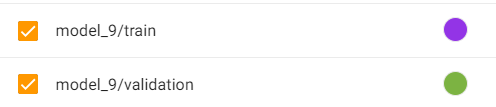

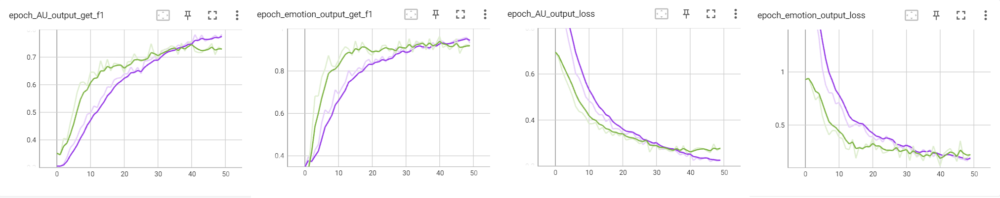

## Model Analysis
After increasing the number of epochs, it can be seen that the performance has improved, with the losses decreasing more and F1 score increasing (95% HLE & 75% FACS). However, it is starting to overfit after epoch 41. Thus, the number of epoch will be decreased to 40

One of the ways to improve model performance includes:
- Tweaking the batch sizes


# Approach 10 : Transfer Learning [Increased Batch Size]
Changes from previous results include:  
- Batch Size : 48 to 64
- Epoch number : 50 to 40

In [60]:
BATCH_SIZE = 64

color_training_generator = DataGenerator(train, dim=(224,224,3), batch_size=BATCH_SIZE, n_classes1=3, Augment=True, data_prefix=prefix, multi_output=True, rgb=True, normalize=False)
color_validation_generator = DataGenerator(val, dim=(224,224,3), batch_size=BATCH_SIZE, n_classes1=3, Augment=True, data_prefix=prefix, multi_output=True, rgb=True, normalize=False)

color_training_generator.change_brightness_delta(0.1)
color_training_generator.change_contrast_lb(0.5)
color_validation_generator.change_brightness_delta(0.1)
color_validation_generator.change_contrast_lb(0.5)
# color_training_generator.show_individual()

STEPS_PER_EPOCH = len(train.index)//BATCH_SIZE
lr_schedule = tf.keras.optimizers.schedules.InverseTimeDecay(
  0.0005,
  # Decay 1000 times per step
  decay_steps=STEPS_PER_EPOCH*1000,
  decay_rate=1,
  staircase=False)

In [61]:
model_10 = MultiOutputModel_pretrained_finetune1((224,224,3)).assemble_full_model(224,224,num_AU=len(au_codes), num_emotion=3)

Fine tuning at layer 100


In [62]:
# model_10 = MultiOutputModel_pretrained_finetune1((224,224,3)).assemble_full_model(224,224,num_AU=len(au_codes), num_emotion=3)
name_m10 = 'models/model_10'
training = True

model_10.compile(optimizer=tf.keras.optimizers.Adam(lr_schedule),
                loss={'emotion_output': 'categorical_crossentropy',
                      'AU_output': 'binary_crossentropy'
                      },
                loss_weights={
                    'AU_output': 0.8,
                    'emotion_output': 0.2
                },

                metrics={'emotion_output': get_f1,
                         'AU_output': get_f1
                })

# early_stopping=False, metric='val_loss', patience_num=25
callbacks, train_model = verify_training(name_m10, training, early_stopping=True, patience_num=10)

if train_model:
  history_10 = model_10.fit(color_training_generator,
                              epochs=40,
                              callbacks=callbacks,
                              validation_data=color_validation_generator)

Epoch 1/40
5/5 [==============================] - ETA: 0s - loss: 1.2343 - emotion_output_loss: 1.9989 - AU_output_loss: 1.0431 - emotion_output_get_f1: 0.3031 - AU_output_get_f1: 0.2936
Epoch 1: val_loss improved from inf to 0.72874, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_10/


5/5 [==============================] - 68s 12s/step - loss: 1.2343 - emotion_output_loss: 1.9989 - AU_output_loss: 1.0431 - emotion_output_get_f1: 0.3031 - AU_output_get_f1: 0.2936 - val_loss: 0.7287 - val_emotion_output_loss: 0.9969 - val_AU_output_loss: 0.6617 - val_emotion_output_get_f1: 0.4124 - val_AU_output_get_f1: 0.3115
Epoch 2/40
5/5 [==============================] - ETA: 0s - loss: 1.1115 - emotion_output_loss: 1.6140 - AU_output_loss: 0.9858 - emotion_output_get_f1: 0.4091 - AU_output_get_f1: 0.3086
Epoch 2: val_loss improved from 0.72874 to 0.68668, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_10/


5/5 [==============================] - 44s 10s/step - loss: 1.1115 - emotion_output_loss: 1.6140 - AU_output_loss: 0.9858 - emotion_output_get_f1: 0.4091 - AU_output_get_f1: 0.3086 - val_loss: 0.6867 - val_emotion_output_loss: 0.8366 - val_AU_output_loss: 0.6492 - val_emotion_output_get_f1: 0.5607 - val_AU_output_get_f1: 0.3123
Epoch 3/40
5/5 [==============================] - ETA: 0s - loss: 1.0093 - emotion_output_loss: 1.3990 - AU_output_loss: 0.9118 - emotion_output_get_f1: 0.4605 - AU_output_get_f1: 0.3123
Epoch 3: val_loss improved from 0.68668 to 0.64482, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_10/


5/5 [==============================] - 44s 10s/step - loss: 1.0093 - emotion_output_loss: 1.3990 - AU_output_loss: 0.9118 - emotion_output_get_f1: 0.4605 - AU_output_get_f1: 0.3123 - val_loss: 0.6448 - val_emotion_output_loss: 0.7255 - val_AU_output_loss: 0.6247 - val_emotion_output_get_f1: 0.7027 - val_AU_output_get_f1: 0.3729
Epoch 4/40
5/5 [==============================] - ETA: 0s - loss: 0.9527 - emotion_output_loss: 1.3627 - AU_output_loss: 0.8502 - emotion_output_get_f1: 0.4718 - AU_output_get_f1: 0.3220
Epoch 4: val_loss improved from 0.64482 to 0.59336, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_10/


5/5 [==============================] - 44s 10s/step - loss: 0.9527 - emotion_output_loss: 1.3627 - AU_output_loss: 0.8502 - emotion_output_get_f1: 0.4718 - AU_output_get_f1: 0.3220 - val_loss: 0.5934 - val_emotion_output_loss: 0.5743 - val_AU_output_loss: 0.5981 - val_emotion_output_get_f1: 0.7586 - val_AU_output_get_f1: 0.3655
Epoch 5/40
5/5 [==============================] - ETA: 0s - loss: 0.8881 - emotion_output_loss: 1.2263 - AU_output_loss: 0.8036 - emotion_output_get_f1: 0.5080 - AU_output_get_f1: 0.3339
Epoch 5: val_loss improved from 0.59336 to 0.58079, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_10/


5/5 [==============================] - 45s 10s/step - loss: 0.8881 - emotion_output_loss: 1.2263 - AU_output_loss: 0.8036 - emotion_output_get_f1: 0.5080 - AU_output_get_f1: 0.3339 - val_loss: 0.5808 - val_emotion_output_loss: 0.6187 - val_AU_output_loss: 0.5713 - val_emotion_output_get_f1: 0.7059 - val_AU_output_get_f1: 0.4103
Epoch 6/40
5/5 [==============================] - ETA: 0s - loss: 0.7905 - emotion_output_loss: 1.0649 - AU_output_loss: 0.7219 - emotion_output_get_f1: 0.5131 - AU_output_get_f1: 0.3776
Epoch 6: val_loss improved from 0.58079 to 0.48073, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_10/


5/5 [==============================] - 45s 10s/step - loss: 0.7905 - emotion_output_loss: 1.0649 - AU_output_loss: 0.7219 - emotion_output_get_f1: 0.5131 - AU_output_get_f1: 0.3776 - val_loss: 0.4807 - val_emotion_output_loss: 0.3469 - val_AU_output_loss: 0.5142 - val_emotion_output_get_f1: 0.8960 - val_AU_output_get_f1: 0.5204
Epoch 7/40
5/5 [==============================] - ETA: 0s - loss: 0.7336 - emotion_output_loss: 0.9826 - AU_output_loss: 0.6713 - emotion_output_get_f1: 0.5821 - AU_output_get_f1: 0.4001
Epoch 7: val_loss improved from 0.48073 to 0.44984, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_10/


5/5 [==============================] - 44s 10s/step - loss: 0.7336 - emotion_output_loss: 0.9826 - AU_output_loss: 0.6713 - emotion_output_get_f1: 0.5821 - AU_output_get_f1: 0.4001 - val_loss: 0.4498 - val_emotion_output_loss: 0.3622 - val_AU_output_loss: 0.4717 - val_emotion_output_get_f1: 0.8594 - val_AU_output_get_f1: 0.5681
Epoch 8/40
5/5 [==============================] - ETA: 0s - loss: 0.6921 - emotion_output_loss: 0.8632 - AU_output_loss: 0.6493 - emotion_output_get_f1: 0.6261 - AU_output_get_f1: 0.4120
Epoch 8: val_loss did not improve from 0.44984
5/5 [==============================] - 18s 4s/step - loss: 0.6921 - emotion_output_loss: 0.8632 - AU_output_loss: 0.6493 - emotion_output_get_f1: 0.6261 - AU_output_get_f1: 0.4120 - val_loss: 0.4827 - val_emotion_output_loss: 0.5331 - val_AU_output_loss: 0.4701 - val_emotion_output_get_f1: 0.7541 - val_AU_output_get_f1: 0.5592
Epoch 9/40
5/5 [==============================] - ETA: 0s - loss: 0.6488 - emotion_output_loss: 0.8250 - AU

5/5 [==============================] - 44s 10s/step - loss: 0.6488 - emotion_output_loss: 0.8250 - AU_output_loss: 0.6048 - emotion_output_get_f1: 0.6318 - AU_output_get_f1: 0.4481 - val_loss: 0.3894 - val_emotion_output_loss: 0.2929 - val_AU_output_loss: 0.4135 - val_emotion_output_get_f1: 0.8640 - val_AU_output_get_f1: 0.6698
Epoch 10/40
5/5 [==============================] - ETA: 0s - loss: 0.6004 - emotion_output_loss: 0.6894 - AU_output_loss: 0.5782 - emotion_output_get_f1: 0.6904 - AU_output_get_f1: 0.4549
Epoch 10: val_loss did not improve from 0.38938
5/5 [==============================] - 19s 4s/step - loss: 0.6004 - emotion_output_loss: 0.6894 - AU_output_loss: 0.5782 - emotion_output_get_f1: 0.6904 - AU_output_get_f1: 0.4549 - val_loss: 0.3992 - val_emotion_output_loss: 0.4017 - val_AU_output_loss: 0.3986 - val_emotion_output_get_f1: 0.8640 - val_AU_output_get_f1: 0.6370
Epoch 11/40
5/5 [==============================] - ETA: 0s - loss: 0.5637 - emotion_output_loss: 0.6968 -

5/5 [==============================] - 45s 10s/step - loss: 0.5180 - emotion_output_loss: 0.6180 - AU_output_loss: 0.4930 - emotion_output_get_f1: 0.7351 - AU_output_get_f1: 0.5010 - val_loss: 0.3505 - val_emotion_output_loss: 0.2905 - val_AU_output_loss: 0.3654 - val_emotion_output_get_f1: 0.8871 - val_AU_output_get_f1: 0.6700
Epoch 13/40
5/5 [==============================] - ETA: 0s - loss: 0.4881 - emotion_output_loss: 0.5839 - AU_output_loss: 0.4641 - emotion_output_get_f1: 0.7615 - AU_output_get_f1: 0.5388
Epoch 13: val_loss improved from 0.35045 to 0.33367, saving model to /content/drive/My Drive/RMIT/COSC2779/models/model_10/


5/5 [==============================] - 45s 10s/step - loss: 0.4881 - emotion_output_loss: 0.5839 - AU_output_loss: 0.4641 - emotion_output_get_f1: 0.7615 - AU_output_get_f1: 0.5388 - val_loss: 0.3337 - val_emotion_output_loss: 0.2496 - val_AU_output_loss: 0.3547 - val_emotion_output_get_f1: 0.8976 - val_AU_output_get_f1: 0.6701
Epoch 14/40
5/5 [==============================] - ETA: 0s - loss: 0.4839 - emotion_output_loss: 0.5894 - AU_output_loss: 0.4576 - emotion_output_get_f1: 0.7345 - AU_output_get_f1: 0.5356
Epoch 14: val_loss did not improve from 0.33367
5/5 [==============================] - 18s 4s/step - loss: 0.4839 - emotion_output_loss: 0.5894 - AU_output_loss: 0.4576 - emotion_output_get_f1: 0.7345 - AU_output_get_f1: 0.5356 - val_loss: 0.3802 - val_emotion_output_loss: 0.3787 - val_AU_output_loss: 0.3805 - val_emotion_output_get_f1: 0.8197 - val_AU_output_get_f1: 0.6434
Epoch 15/40
5/5 [==============================] - ETA: 0s - loss: 0.4414 - emotion_output_loss: 0.4309 -

5/5 [==============================] - 45s 10s/step - loss: 0.4284 - emotion_output_loss: 0.4605 - AU_output_loss: 0.4204 - emotion_output_get_f1: 0.8196 - AU_output_get_f1: 0.5765 - val_loss: 0.2419 - val_emotion_output_loss: 0.1171 - val_AU_output_loss: 0.2731 - val_emotion_output_get_f1: 0.9440 - val_AU_output_get_f1: 0.7475
Epoch 17/40
5/5 [==============================] - ETA: 0s - loss: 0.4207 - emotion_output_loss: 0.4330 - AU_output_loss: 0.4176 - emotion_output_get_f1: 0.8198 - AU_output_get_f1: 0.5622
Epoch 17: val_loss did not improve from 0.24187
5/5 [==============================] - 18s 4s/step - loss: 0.4207 - emotion_output_loss: 0.4330 - AU_output_loss: 0.4176 - emotion_output_get_f1: 0.8198 - AU_output_get_f1: 0.5622 - val_loss: 0.2998 - val_emotion_output_loss: 0.2690 - val_AU_output_loss: 0.3075 - val_emotion_output_get_f1: 0.9048 - val_AU_output_get_f1: 0.7071
Epoch 18/40
5/5 [==============================] - ETA: 0s - loss: 0.4144 - emotion_output_loss: 0.4168 -

5/5 [==============================] - 44s 10s/step - loss: 0.3290 - emotion_output_loss: 0.3217 - AU_output_loss: 0.3308 - emotion_output_get_f1: 0.8873 - AU_output_get_f1: 0.6497 - val_loss: 0.2298 - val_emotion_output_loss: 0.1027 - val_AU_output_loss: 0.2615 - val_emotion_output_get_f1: 0.9764 - val_AU_output_get_f1: 0.7379
Epoch 27/40
5/5 [==============================] - ETA: 0s - loss: 0.3190 - emotion_output_loss: 0.3177 - AU_output_loss: 0.3193 - emotion_output_get_f1: 0.8699 - AU_output_get_f1: 0.6606
Epoch 27: val_loss did not improve from 0.22976
5/5 [==============================] - 19s 4s/step - loss: 0.3190 - emotion_output_loss: 0.3177 - AU_output_loss: 0.3193 - emotion_output_get_f1: 0.8699 - AU_output_get_f1: 0.6606 - val_loss: 0.2777 - val_emotion_output_loss: 0.1529 - val_AU_output_loss: 0.3088 - val_emotion_output_get_f1: 0.9291 - val_AU_output_get_f1: 0.7062
Epoch 28/40
5/5 [==============================] - ETA: 0s - loss: 0.3108 - emotion_output_loss: 0.2666 -

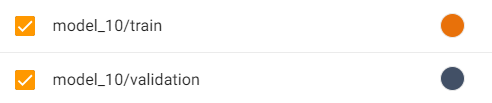

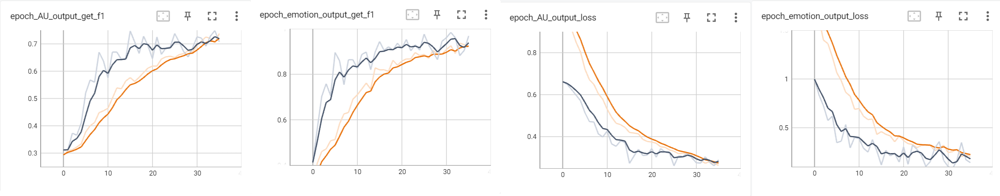

## Model Analysis
The performance is very similar to Model 9's, with a slight sign of improvement in HLE and slight decrease in the FACS validation F1 Score. However, the model did not overfit like the previous model. Thus, this will be deemed as the best model for this task.

# Plotting results

In [64]:
BATCH_SIZE

64

Generating the test data generator

In [65]:
color_testing_generator = DataGenerator(test, dim=(224,224,3), batch_size=BATCH_SIZE, n_classes1=3,
                                           Augment=False, data_prefix=prefix, multi_output=True,
                                           rgb=True, normalize=False,
                                           )

In [63]:
labels_int.keys()

dict_keys(['negative', 'positive', 'surprise'])

In [75]:
for image, label in color_testing_generator.__iter__():
  image = image
  prediction = model_10.predict(image)
  emotion_output = np.argmax(prediction[0], axis=1)
  emotion_label = np.argmax(label[0], axis=1)
  AU_output = np.round(prediction[1])
  AU_label = label[1]

2/2 [==============================] - 0s 48ms/step


In [91]:
model_10.evaluate(image,label)

2/2 [==============================] - 0s 72ms/step - loss: 0.3117 - emotion_output_loss: 0.4672 - AU_output_loss: 0.2728 - emotion_output_get_f1: 0.8735 - AU_output_get_f1: 0.7203


[0.3117203116416931,
 0.46720224618911743,
 0.27284982800483704,
 0.8734878301620483,
 0.7202650308609009]

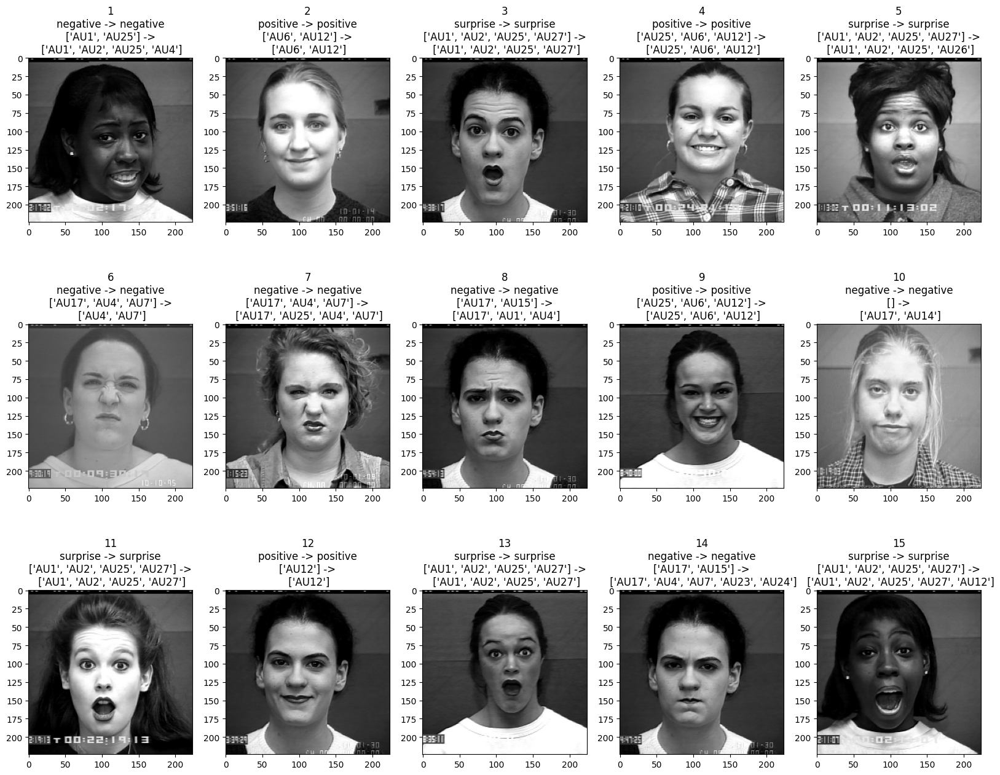

In [87]:
plt.figure(figsize=(20,15))
selected = []
for i in range(15):
  ind = random.choice(range(BATCH_SIZE))
  while ind in selected:
    ind = random.choice(range(BATCH_SIZE))
  selected.append(ind)
  plt.subplot(3,5,i+1)
  plt.imshow(image[ind].astype(int))

  AU_output_indexes = [i for i in range(len(AU_output[ind])) if AU_output[ind][i] == 1]
  AU_label_indexes = [i for i in range(len(AU_label[ind])) if AU_label[ind][i] == 1]

  emotion_label_name = list(labels_int.keys())[emotion_label[ind]]
  emotion_output_name = list(labels_int.keys())[emotion_output[ind]]

  AU_output_name = [au_codes[i] for i in AU_output_indexes]
  AU_label_name = [au_codes[i] for i in AU_label_indexes]
  plt.title(str(i+1) + "\n" + emotion_output_name + ' -> ' + emotion_label_name +
            "\n" + str(AU_output_name) + ' ->\n ' + str(AU_label_name))

plt.subplots_adjust(hspace=0.5)

**Surprise**  
The model performed fairly well on this emotion and its FACS codes. With a few miss-classifications such as predicting AU27 (Mouth Stretch) instead of AU26 (Jaw Drop). Looking at other images with the FACS codes AU27 (Image 3 & 11), it seems reasonable for the model to predict AU27. For image 15, the model missed AU12 (Lip Corner Puller), which is also odd that it is present as most of the AU12 resides in those images of subjects with a smile (Image 2 & 12)

**Positive**  
The model predicted correctly on all data shown above.

**Negative**
It can be seen that the model did not perform as well on predicting FACS for negative emotions.

- Image 1: The model missed AU2 and AU4 (Outer Brow Raiser & Brow Lowerer). Due to the dark complexion of the subject as well as the image being grayscale, it will be difficult to notice the brow movement.

- Image 6: The model predicted AU17 (Chin Raiser), from the image, it can be seen that the subject's chin is quite thick, which is reasonable that the model predicted AU17.

- Image 7: The model missed AU25 (Lip Parts), which is not obvious from the image

- Image 8: Model predicted AU15 (Lip Corner Depressor) and missed AU1 (Inner Brow Raiser) and AU4 (Brow Lowerer). It seems like predicting brow movement is a difficult task. From the image however, it seems reasonable for the model to predict some form of action from the subject's lips

- Image 10: Model missed AU14 and AU17 (Dimpler, Chin Raiser)

- Image 14: Model predicted AU15 (Lip Corner Depressor) and missed AU4, AU7, AU23 and AU24 (Brow Lowerer, Lid Tightener, Neck Tightener, Lip Pressor). The neck movement as well as lid movement was not obvious to the human eye. Additionally, AU15 and AU24 seems to point to similar lip actions.

**Confusion Matrix**  
It is important to note that Confusion Matrix words on HLE, but does not work on FACS codes as data could belong to multiple classes at the same time.

In [88]:
print(tf.math.confusion_matrix(emotion_label, emotion_output))

tf.Tensor(
[[33  3  3]
 [ 1 13  0]
 [ 2  0  9]], shape=(3, 3), dtype=int32)


From the confusion matrix, the first row being negative emotion, followed by positive and surprise, it is shown that the model was able to predict pretty well on all emotions.

# References:
Le, J. (2018). The 4 Convolutional Neural Network Models That Can Classify Your Fashion Images. [online] Medium. Available at: https://towardsdatascience.com/the-4-convolutional-neural-network-models-that-can-classify-your-fashion-images-9fe7f3e5399d#:~:text=Convolutional%20Neural%20Networks%20(CNNs)%20is.

saturncloud.io. (2023). Custom f1score metric in TensorFlow | Saturn Cloud Blog. [online] Available at: https://saturncloud.io/blog/custom-f1score-metric-in-tensorflow/ [Accessed 30 Aug. 2023].

Rosebrock, A. (2019). Why is my validation loss lower than my training loss? [online] PyImageSearch. Available at: https://pyimagesearch.com/2019/10/14/why-is-my-validation-loss-lower-than-my-training-loss/.

Jason Brownlee (2019). Understand the Impact of Learning Rate on Neural Network Performance. [online] Machine Learning Mastery. Available at: https://machinelearningmastery.com/understand-the-dynamics-of-learning-rate-on-deep-learning-neural-networks/.

Singhal, A. (2021). Facial expression detection using Machine Learning in Python. [online] Analytics Vidhya. Available at: https://medium.com/analytics-vidhya/facial-expression-detection-using-machine-learning-in-python-c6a188ac765f.

Culfaz, F. (2018). Transfer Learning using Mobilenet and Keras. [online] Medium. Available at: https://towardsdatascience.com/transfer-learning-using-mobilenet-and-keras-c75daf7ff299.

Schneider, P. and Fatos Xhafa (2022). Machine learning. Elsevier eBooks, pp.149–191. doi:https://doi.org/10.1016/b978-0-12-823818-9.00019-5.